#  Objectif

# Etude des repas: importer et sélectionner les données 

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
! pip install openpyxl

recettes_aliments = pd.read_excel("../Details_recettes.xlsx", engine='openpyxl')
liste_ingr = pd.read_excel("../Liste_ingredients.xlsx", engine='openpyxl')

#il y a 3 tables de données: les consommations des 7 jours, les individus et la nomenclature des aliments.
conso = pd.read_csv("../Table_conso.csv", encoding = "ISO-8859-1", sep=';')
indiv= pd.read_csv("../Table_indiv.csv", encoding = "ISO-8859-1",  sep=';', low_memory=False)
nomenc= pd.read_csv("../Nomenclature_3.csv", encoding = "ISO-8859-1",  sep=';')

In [3]:
#Sélectionner les colonnes d'intérêt pour les consommations (numéro d'indiv, numéro du jour de la semaine, 
# type de repas, code groupe aliment, code sous groupe aliment, code aliment)
conso=conso[["nomen", "nojour", "tyrep", "codgr", "sougr", "codal"]]
conso.info()

#Nombre de valeurs manquantes
print("donnees manquantes dans le tableau des consommations\n", conso.isnull().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541526 entries, 0 to 541525
Data columns (total 6 columns):
 #   Column  Non-Null Count   Dtype
---  ------  --------------   -----
 0   nomen   541526 non-null  int64
 1   nojour  541526 non-null  int64
 2   tyrep   541526 non-null  int64
 3   codgr   541526 non-null  int64
 4   sougr   541526 non-null  int64
 5   codal   541526 non-null  int64
dtypes: int64(6)
memory usage: 24.8 MB
donnees manquantes dans le tableau des consommations
 nomen     0
nojour    0
tyrep     0
codgr     0
sougr     0
codal     0
dtype: int64


In [4]:
import copy
import string
import pickle 

#on crée un dictionnaire pour associer un code d'aliment (codal) au libellé de l'aliment (libal)) 
dic_alim={}
for i in range(nomenc.shape[0]):
    dic_alim[nomenc.codal[i]]=nomenc.libal[i]
#print(dic_alim)

# with open("dic_alim.pkl", "wb") as fichier:
#     # Utiliser pickle.dump pour enregistrer 
#     pickle.dump(dic_alim, fichier)

# on crée un dictionnaire pour associer un code de groupe d'aliment (codgr) au libellé du groupe d'aliment (libgr)
groups=nomenc[["codgr", "libgr"]]
groups = groups.drop_duplicates()   
groups.reset_index(drop=True, inplace=True)
#groups.info()

dic_group={}
for i in range(groups.shape[0]):
    dic_group[groups.codgr[i]]=groups.libgr[i]
# print(dic_group)

# with open("dic_group.pkl", "wb") as fichier:
#     # Utiliser pickle.dump pour enregistrer 
#     pickle.dump(dic_group, fichier)


# On crée un dictionnaire pour associer un code de groupe d'aliment (codgr) une lettre pour distinguer des codes aliments (codal)
lettres_alphabet = list(string.ascii_uppercase)
dic_group_lettre = {}

for i in range(1, 46):
    if i <= len(lettres_alphabet):
        dic_group_lettre[i] = lettres_alphabet[i-1]
    else:
        quotient, reste = divmod(i-1, len(lettres_alphabet))
        prefixe = lettres_alphabet[quotient - 1]
        suffixe = lettres_alphabet[reste]
        dic_group_lettre[i] = prefixe + suffixe
# print(dic_group_lettre)

# on crée un dictionnaire pour associer un code de SOUS groupe d'aliment (codgr) au libellé du SOUS groupe d'aliment (libgr)
sous_groups=nomenc[["codgr", "sougr", "libsougr"]]

def concat_values(row):
    return str(row['codgr']) + '.' + str(row['sougr'])

sous_groups_new=copy.deepcopy(sous_groups)
sous_groups_new['codsougr'] = sous_groups.apply(concat_values, axis=1)
sous_groups_new=sous_groups_new.drop_duplicates()   
sous_groups_new.reset_index(drop=True, inplace=True)
# sous_groups_new[:30]

dic_sous_group={}
for i in range(sous_groups_new.shape[0]):
    dic_sous_group[sous_groups_new.codsougr[i]]=sous_groups_new.libsougr[i]
# print(dic_sous_group)

#on crée un dictionnaire pour associer un code d'aliment (codal) au code du sous groupe d'aliment(codgr.sousgr)) 
dic_alim_sous_group={}
for i in range(nomenc.shape[0]):
    dic_alim_sous_group[nomenc.codal[i]]=str(nomenc.codgr[i]) + '.' + str(nomenc.sougr[i])
# print(dic_alim_sous_group)


#on crée un dictionnaire pour associer un code d'aliment (codal) au code du groupe d'aliment (codgr)) 
dic_alim_group={}
for i in range(nomenc.shape[0]):
    dic_alim_group[nomenc.codal[i]]=nomenc.codgr[i]
# print(dic_alim_group)

In [4]:
#Sélectionner les colonnes d'intérêt pour individus (numéro d'indiv, sexe, catégorie d'age)
indiv=indiv[["nomen", "sexe_ps", "tage"]]

#Merger consommations et individus pour ne conserver que les consommations des adultes 
conso_indiv=pd.merge(conso, indiv)
conso_indiv.head()

#ne conserver que les adultes (18 ans et plus)
conso_indiv=conso_indiv[(conso_indiv.tage!=1) & (conso_indiv.tage!=2)  & (conso_indiv.tage!=3)]

print("nombre d'adultes:", len(conso_indiv["nomen"].unique()))
conso_indiv.head()

nombre d'adultes: 2624


,nomen,nojour,tyrep,codgr,sougr,codal,sexe_ps,tage
0,110006,6,1,34,99,18151,2,7
1,110006,6,1,30,1,31076,2,7
2,110006,6,1,1,1,7001,2,7
3,110006,6,1,15,99,16632,2,7
4,110006,6,3,21,1,26039,2,7


In [5]:
#Ajouter le libellé des aliments et des groupes et sous groupes d'aliments dans la table des consommations 

conso_indiv_alim=conso_indiv.assign(codsougr=np.nan, codgrlet=np.nan, Aliment=np.nan, Groupe_Aliment=np.nan, Sous_Groupe_Aliment=np.nan)

for i in range(conso_indiv_alim.shape[0]):
    conso_indiv_alim.codsougr[i]=str(conso_indiv_alim.codgr[i]) + '.' + str(conso_indiv_alim.sougr[i])
    conso_indiv_alim.codgrlet[i]=dic_group_lettre[conso_indiv_alim.codgr[i]]
    conso_indiv_alim.Aliment[i]=dic_alim.get(conso_indiv_alim.codal[i])
    conso_indiv_alim.Groupe_Aliment[i]=dic_group.get(conso_indiv_alim.codgr[i])
    conso_indiv_alim.Sous_Groupe_Aliment[i]=dic_sous_group.get(conso_indiv_alim.codsougr[i])
    
conso_indiv_alim.head()

C:\Users\jacqueno\AppData\Local\Temp\ipykernel_29260\1014949875.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  conso_indiv_alim.codsougr[i]=str(conso_indiv_alim.codgr[i]) + '.' + str(conso_indiv_alim.sougr[i])
C:\Users\jacqueno\AppData\Local\Temp\ipykernel_29260\1014949875.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  conso_indiv_alim.codgrlet[i]=dic_group_lettre[conso_indiv_alim.codgr[i]]
C:\Users\jacqueno\AppData\Local\Temp\ipykernel_29260\1014949875.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.

,nomen,nojour,tyrep,codgr,sougr,codal,sexe_ps,tage,codsougr,codgrlet,Aliment,Groupe_Aliment,Sous_Groupe_Aliment
0,110006,6,1,34,99,18151,2,7,34.99,AH,café au lait ou café crème ou cappuccino non s...,café,sans
1,110006,6,1,30,1,31076,2,7,30.1,AD,sucre allégé type tutti free,sucres et dérivés,sucre et assimilés
2,110006,6,1,1,1,7001,2,7,1.1,A,pain baguette,pain et panification sèche,pain
3,110006,6,1,15,99,16632,2,7,15.99,O,matière grasse allégée 60% m.g.,margarine,sans
4,110006,6,3,21,1,26039,2,7,21.1,U,thon au naturel en conserve égoutté,poissons,poissons de mer


In [6]:
#Créer les séquences des repas (déjeuners et diners) de la semaine pour chaque individu 

conso_rep0=conso_indiv_alim[(conso_indiv_alim.tyrep==3) | (conso_indiv_alim.tyrep==5)]
conso_rep1=conso_rep0.sort_values(['nomen', 'nojour'], ascending =[True, True])
# conso_rep1.head()
# conso_rep1.to_excel("repas_dej_diner_7j.xlsx")
conso_rep2=conso_rep1[["nomen", "nojour", "tyrep", "codgr", "codal"]]
conso_rep2.head()

,nomen,nojour,tyrep,codgr,codal
64,110006,1,3,17,28301
65,110006,1,3,3,9811
66,110006,1,3,1,7001
67,110006,1,3,31,18008
68,110006,1,3,10,19611


In [7]:
#Créer la liste des aliments des repas déjeuners et diners
liste_code_al_rep=(conso_rep1.codal.unique()).tolist()
print("nombre d'aliments differents au repas:", len(liste_code_al_rep))
print(liste_code_al_rep)

# liste_al_rep=[]
# for i in liste_code_al_rep:
#     liste_al_rep.append(dic_alim[i])
# print(liste_al_rep)

nombre d'aliments differents au repas: 1313
[28301, 9811, 7001, 18008, 19611, 13030, 16632, 81007, 20047, 11110, 22501, 39221, 25163, 19640, 13037, 8400, 25103, 9104, 36005, 20071, 13014, 28925, 36306, 20101, 4003, 17440, 28504, 11081, 30780, 30005, 25505, 92044, 28900, 19624, 20510, 19628, 26039, 19510, 31076, 20017, 20503, 20088, 20035, 20066, 25548, 6210, 20030, 23525, 26034, 25606, 20031, 12020, 7100, 76057, 5205, 13024, 81047, 81025, 25902, 28916, 13039, 6200, 12740, 76050, 28801, 40053, 20021, 12009, 20098, 22010, 13038, 20506, 25900, 8800, 25604, 39212, 7330, 7730, 26030, 19601, 13002, 21501, 20036, 19524, 13034, 42, 38402, 26037, 7004, 36102, 5207, 92031, 23900, 6550, 90098, 13004, 19851, 90072, 20018, 26033, 11105, 7812, 5200, 10007, 92024, 19700, 18009, 81024, 81061, 1007, 20009, 90067, 25402, 20099, 8320, 7200, 11108, 4018, 20011, 18046, 23081, 18004, 31017, 26013, 20090, 18071, 1004, 20008, 17130, 90068, 18041, 2000, 20033, 81006, 76022, 11114, 19401, 4019, 92003, 19521, 31

In [8]:
#Créer la liste des groupes des aliments dans les repas déjeuners et diners

liste_code_gr_rep=(conso_rep2.codgr.unique()).tolist()
print("nombre de groupes differents au repas:", len(liste_code_gr_rep))
print(liste_code_gr_rep)


nombre de groupes differents au repas: 44
[17, 3, 1, 31, 10, 26, 15, 13, 23, 43, 12, 41, 20, 39, 4, 18, 24, 14, 25, 21, 30, 36, 11, 33, 38, 19, 42, 6, 7, 8, 22, 34, 32, 44, 27, 35, 28, 37, 16, 9, 29, 5, 2, 45]


In [9]:
# Créer les séquences des aliments d'un repas par individu sous forme d'un dictionnaire
   
d_al = {}
for index, row in conso_rep1.iterrows():
    d_al.setdefault(row.nomen, {}).setdefault(row.nojour, {}).setdefault(row.tyrep, []).append(str(row.codal)) 
print(d_al[110006])
print(len(d_al))

{1: {3: ['28301', '9811', '7001', '18008', '19611', '13030', '16632', '81007'], 5: ['20047', '11110', '22501', '39221', '18008', '7001', '81007']}, 2: {3: ['25163', '9811', '19640', '18008', '7001', '13037'], 5: ['8400', '25103', '9104', '7001', '19640', '18008', '11110']}, 3: {3: ['36005', '20071', '7001', '18008', '19611', '13014', '81007', '81007'], 5: ['28925', '20071', '11110', '7001', '18008', '39221', '81007']}, 4: {3: ['36306', '20101', '4003', '17440', '28504', '11081', '7001', '19640', '18008', '81007', '81007'], 5: ['30780', '30005', '25505', '7001', '92044', '11110', '18008', '39221']}, 5: {3: ['28900', '7001', '19624', '18008'], 5: ['8400', '20510', '7001', '19628', '18008', '11110']}, 6: {3: ['26039', '11110', '7001', '19510', '31076', '18008', '9104', '20017', '20503', '20088', '20035', '20066'], 5: ['25548', '92044', '7001', '18008', '19510', '31076', '18008']}, 7: {3: ['6210', '20030', '7001', '23525', '18008'], 5: ['26034', '25606', '11110', '7001', '23525', '18008']}

In [10]:
#Créer les séquences des GROUPES d'un repas par individu sous forme d'un dictionnaire
d = {}
for index, row in conso_rep2.iterrows():
    d.setdefault(row.nomen, {}).setdefault(row.nojour, {}).setdefault(row.tyrep, []).append(str(row.codgr)) 
print(d[110006])
print(len(d))   

{1: {3: ['17', '3', '1', '31', '10', '26', '15', '13'], 5: ['23', '43', '12', '41', '31', '1', '13']}, 2: {3: ['17', '3', '10', '31', '1', '26'], 5: ['20', '39', '4', '1', '10', '31', '43']}, 3: {3: ['18', '23', '1', '31', '10', '26', '13', '13'], 5: ['20', '23', '43', '1', '31', '41', '13']}, 4: {3: ['18', '23', '24', '14', '20', '43', '1', '10', '31', '13', '13'], 5: ['20', '20', '17', '1', '23', '43', '31', '41']}, 5: {3: ['20', '1', '10', '31'], 5: ['20', '25', '1', '10', '31', '43']}, 6: {3: ['21', '43', '1', '10', '30', '31', '4', '23', '25', '23', '23', '23'], 5: ['36', '23', '1', '31', '10', '30', '31']}, 7: {3: ['17', '23', '1', '41', '31'], 5: ['21', '39', '43', '1', '41', '31']}}
2624


# Entrainer word2vec sur les séquences des aliments de chaque repas déjeuner ou diner (une phrase= 1 repas)

In [11]:
# !pip install gensim

import gensim
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)


In [12]:
#Sequences des REPAS (chaque séquence contient les groupes des aliments consommés à un repas)

REP_liste=[]
for cle, valeur in d.items():
    for sous_cle, sous_valeur in valeur.items():
        for subkey, sublist in sous_valeur.items():
            REP_liste.append(sublist)

print(REP_liste[:10])

[['17', '3', '1', '31', '10', '26', '15', '13'], ['23', '43', '12', '41', '31', '1', '13'], ['17', '3', '10', '31', '1', '26'], ['20', '39', '4', '1', '10', '31', '43'], ['18', '23', '1', '31', '10', '26', '13', '13'], ['20', '23', '43', '1', '31', '41', '13'], ['18', '23', '24', '14', '20', '43', '1', '10', '31', '13', '13'], ['20', '20', '17', '1', '23', '43', '31', '41'], ['20', '1', '10', '31'], ['20', '25', '1', '10', '31', '43']]


In [13]:
REP_aliments_liste=[]
for cle, valeur in d_al.items():
    for sous_cle, sous_valeur in valeur.items():
        for subkey, sublist in sous_valeur.items():
            REP_aliments_liste.append(sublist)

print(REP_aliments_liste[:10])

[['28301', '9811', '7001', '18008', '19611', '13030', '16632', '81007'], ['20047', '11110', '22501', '39221', '18008', '7001', '81007'], ['25163', '9811', '19640', '18008', '7001', '13037'], ['8400', '25103', '9104', '7001', '19640', '18008', '11110'], ['36005', '20071', '7001', '18008', '19611', '13014', '81007', '81007'], ['28925', '20071', '11110', '7001', '18008', '39221', '81007'], ['36306', '20101', '4003', '17440', '28504', '11081', '7001', '19640', '18008', '81007', '81007'], ['30780', '30005', '25505', '7001', '92044', '11110', '18008', '39221'], ['28900', '7001', '19624', '18008'], ['8400', '20510', '7001', '19628', '18008', '11110']]


In [14]:
nb_alim_rep=[]
for i in range(len(REP_liste)):
    nb_alim_rep.append(len(REP_liste[i]))
    
#Nombre d'aliments max consommées par un individu en 1 rep
print("nombre max:", max(nb_alim_rep))
#Nombre moyen d'aliments consommées par un individu en 1 rep
print("nombre moyen:", sum(nb_alim_rep)/len(nb_alim_rep))


nombre max: 31
nombre moyen: 7.240538437148705


In [15]:
#Créer un dictionnaire qui contient tous les groupes d'aliments des repas des 7 jours par individu 

d_indiv = {}
for index, row in conso_rep2.iterrows():
    d_indiv.setdefault(row.nomen, []).append(str(row.codgr))
  
print(d_indiv[110006])
print(len(d_indiv))

['17', '3', '1', '31', '10', '26', '15', '13', '23', '43', '12', '41', '31', '1', '13', '17', '3', '10', '31', '1', '26', '20', '39', '4', '1', '10', '31', '43', '18', '23', '1', '31', '10', '26', '13', '13', '20', '23', '43', '1', '31', '41', '13', '18', '23', '24', '14', '20', '43', '1', '10', '31', '13', '13', '20', '20', '17', '1', '23', '43', '31', '41', '20', '1', '10', '31', '20', '25', '1', '10', '31', '43', '21', '43', '1', '10', '30', '31', '4', '23', '25', '23', '23', '23', '36', '23', '1', '31', '10', '30', '31', '17', '23', '1', '41', '31', '21', '39', '43', '1', '41', '31']
2624


In [16]:
#Créer un dictionnaire qui contient le nombre d'individus qui ont consommé au moins une fois 
# le groupe d'aliment à un repas, pour chaque groupe du repas 

d_freq_gr={}

for e in liste_code_gr_rep:
    d_freq_gr[e]=0
    for i in d_indiv.keys():
        if str(e) in d_indiv[i]:
            d_freq_gr[e]=d_freq_gr[e]+1
d_freq_gr

{17: 2368,
 3: 1986,
 1: 2407,
 31: 2386,
 10: 2124,
 26: 2106,
 15: 830,
 13: 1927,
 23: 2578,
 43: 2378,
 12: 1554,
 41: 1232,
 20: 2324,
 39: 2198,
 4: 1608,
 18: 1891,
 24: 2339,
 14: 2125,
 25: 726,
 21: 2023,
 30: 1472,
 36: 1388,
 11: 2333,
 33: 1649,
 38: 1412,
 19: 387,
 42: 773,
 6: 139,
 7: 737,
 8: 1540,
 22: 805,
 34: 1461,
 32: 1127,
 44: 237,
 27: 571,
 35: 436,
 28: 666,
 37: 939,
 16: 53,
 9: 270,
 29: 574,
 5: 46,
 2: 53,
 45: 23}

In [17]:
#Identifier les groupes consommés par plus de 5% / moins de 5% des individus au repas

gr_non_rare=[]
gr_rare=[]
for e in liste_code_gr_rep:
    if d_freq_gr[e]>131:
        gr_non_rare.append(e)
    elif d_freq_gr[e]<132:
        gr_rare.append(e)
        
print("Nb de groupes fréquemment consommés:", len(gr_non_rare))
print("Nb de groupes rarement consommés:", len(gr_rare))

Nb de groupes fréquemment consommés: 40
Nb de groupes rarement consommés: 4


In [18]:
for i in gr_non_rare:
    print(i, dic_group[i])

17 viande
3 pâtes
1 pain et panification sèche
31 eaux
10 ultra-frais laitier
26 fruits
15 margarine
13 beurre
23 légumes (hors pommes de terre)
43 condiments et sauces
12 oeufs et dérivés
41 entremets, crèmes desserts et laits gélifiés
20 charcuterie
39 plats composés
4 riz et blé dur ou concassé
18 volaille et gibier
24 pommes de terre et apparentés
14 huile
25 légumes secs
21 poissons
30 sucres et dérivés
36 pizzas, quiches et pâtisseries salées
11 fromages
33 boissons alcoolisées
38 soupes et bouillons
19 abats
42 compotes et fruits cuits
6 viennoiserie
7 biscuits sucrés ou salés et barres
8 pâtisseries et gâteaux
22 crustacés et mollusques
34 café
32 boissons fraîches sans alcool
44 aliments destinés à une alimentation particulière
27 fruits secs et graines oléagineuses
35 autres boissons chaudes
28 glaces et desserts glacés
37 sandwichs, casse-croûte
9 lait
29 chocolat


In [19]:
for i in gr_rare:
    print(i, dic_group[i])

16 autres graisses
5 autres céréales
2 céréales pour petit déjeuner
45 -


In [20]:
# Enlever les REPAS qui contiennent les groupes rares
# vérifier que les nombres de repas sont bons :


# Enlever les REPAS qui contiennent les aliments rares
d_new = {}
for key, value in d.items():
    valeur={}
    for subkey, sublist in value.items():
        new_value = {}
        for sous_cle, sous_liste in sublist.items():
            if not any(str(e) in sous_liste for e in gr_rare):
                new_value[sous_cle] = sous_liste
        valeur[subkey]=new_value
    d_new[key] = valeur
    
print("longueur du dic:", len(d_new))
print(d_new[110006])

# vérifier que les nombres de repas sont bons :
print("\n vérification cohérence nombre de repas:")
longueur=0
for key in d_new.keys():
    for i in range(1,8):
        if i in d_new[key]:
            for j in [3,5]:
                if j in d_new[key][i]:
                    longueur+=1
print("nombre de repas remplis", longueur)

repas_manquant=0
jour_manquant=0
for key in d_new.keys():
    for i in range(1,8):
        if i not in d_new[key]:
            jour_manquant+=1
        elif i in d_new[key]:
            for j in [3,5]:
                if j not in d_new[key][i]:
                    repas_manquant+=1
print("nombre de repas manquants", repas_manquant)
print("nombre de jours manquants (les 2 repas)", jour_manquant)


longueur du dic: 2624
{1: {3: ['17', '3', '1', '31', '10', '26', '15', '13'], 5: ['23', '43', '12', '41', '31', '1', '13']}, 2: {3: ['17', '3', '10', '31', '1', '26'], 5: ['20', '39', '4', '1', '10', '31', '43']}, 3: {3: ['18', '23', '1', '31', '10', '26', '13', '13'], 5: ['20', '23', '43', '1', '31', '41', '13']}, 4: {3: ['18', '23', '24', '14', '20', '43', '1', '10', '31', '13', '13'], 5: ['20', '20', '17', '1', '23', '43', '31', '41']}, 5: {3: ['20', '1', '10', '31'], 5: ['20', '25', '1', '10', '31', '43']}, 6: {3: ['21', '43', '1', '10', '30', '31', '4', '23', '25', '23', '23', '23'], 5: ['36', '23', '1', '31', '10', '30', '31']}, 7: {3: ['17', '23', '1', '41', '31'], 5: ['21', '39', '43', '1', '41', '31']}}

 vérification cohérence nombre de repas:
nombre de repas remplis 34386
nombre de repas manquants 1712
nombre de jours manquants (les 2 repas) 319


In [21]:
#Sequences des REPAS qui ne contiennent pas les groupes rares

REP_alimfreqliste=[]
for cle, valeur in d_new.items():
    for sous_cle, sous_valeur in valeur.items(): 
        for sous_liste in sous_valeur.values():
            REP_alimfreqliste.append(sous_liste)

print(REP_alimfreqliste)
print(len(REP_alimfreqliste))

[['17', '3', '1', '31', '10', '26', '15', '13'], ['23', '43', '12', '41', '31', '1', '13'], ['17', '3', '10', '31', '1', '26'], ['20', '39', '4', '1', '10', '31', '43'], ['18', '23', '1', '31', '10', '26', '13', '13'], ['20', '23', '43', '1', '31', '41', '13'], ['18', '23', '24', '14', '20', '43', '1', '10', '31', '13', '13'], ['20', '20', '17', '1', '23', '43', '31', '41'], ['20', '1', '10', '31'], ['20', '25', '1', '10', '31', '43'], ['21', '43', '1', '10', '30', '31', '4', '23', '25', '23', '23', '23'], ['36', '23', '1', '31', '10', '30', '31'], ['17', '23', '1', '41', '31'], ['21', '39', '43', '1', '41', '31'], ['17', '23', '11', '1', '31', '33', '26', '15', '14'], ['38', '20', '31', '10', '26', '1'], ['17', '23', '1', '11', '33', '31'], ['38', '20', '1', '10', '31'], ['19', '23', '11', '1', '33', '31', '26', '15'], ['23', '12', '42', '10', '1', '31'], ['20', '25', '11', '1', '31', '33'], ['38', '20', '23', '41', '1', '31', '1'], ['6', '31'], ['38', '21', '10', '26', '31', '1', '1'

In [22]:
nb_alim_rep=[]
for i in range(len(REP_alimfreqliste)):
    nb_alim_rep.append(len(REP_alimfreqliste[i]))
#Nombre d'aliments max consommées par un individu en 1 REPAS
print("nombre max:", max(nb_alim_rep))
#Nombre moyen d'aliments consommées par un individu en 1 REPAS
print("nombre moyen:", sum(nb_alim_rep)/len(nb_alim_rep))

nombre max: 31
nombre moyen: 7.227040074448904


In [23]:
# w2v_cbow_rep_freq= gensim.models.word2vec.Word2Vec(sentences=REP_alimfreqliste,
#                                 vector_size=10, window=31,     ### here we train a cbow model 
#                                 min_count=5,                      
#                                 sample=0.001, workers=3,
#                                 sg=0, hs=0, negative=5,        ### set sg to 1 to train a sg model
#                                 cbow_mean=1, epochs=3000)


2023-07-26 20:07:17,891 : INFO : collecting all words and their counts
2023-07-26 20:07:17,892 : INFO : PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
2023-07-26 20:07:17,910 : INFO : PROGRESS: at sentence #10000, processed 73230 words, keeping 40 word types
2023-07-26 20:07:17,925 : INFO : PROGRESS: at sentence #20000, processed 145811 words, keeping 40 word types
2023-07-26 20:07:17,939 : INFO : PROGRESS: at sentence #30000, processed 219148 words, keeping 40 word types
2023-07-26 20:07:17,947 : INFO : collected 40 word types from a corpus of 248509 raw words and 34386 sentences
2023-07-26 20:07:17,948 : INFO : Creating a fresh vocabulary
2023-07-26 20:07:17,949 : INFO : Word2Vec lifecycle event {'msg': 'effective_min_count=5 retains 40 unique words (100.00% of original 40, drops 0)', 'datetime': '2023-07-26T20:07:17.949129', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': '

2023-07-26 20:07:22,051 : INFO : EPOCH 41: training on 248509 raw words (53231 effective words) took 0.1s, 662532 effective words/s
2023-07-26 20:07:22,135 : INFO : EPOCH 42: training on 248509 raw words (53578 effective words) took 0.1s, 722177 effective words/s
2023-07-26 20:07:22,232 : INFO : EPOCH 43: training on 248509 raw words (53378 effective words) took 0.1s, 643351 effective words/s
2023-07-26 20:07:22,319 : INFO : EPOCH 44: training on 248509 raw words (53534 effective words) took 0.1s, 716474 effective words/s
2023-07-26 20:07:22,401 : INFO : EPOCH 45: training on 248509 raw words (53385 effective words) took 0.1s, 757527 effective words/s
2023-07-26 20:07:22,494 : INFO : EPOCH 46: training on 248509 raw words (53356 effective words) took 0.1s, 679520 effective words/s
2023-07-26 20:07:22,579 : INFO : EPOCH 47: training on 248509 raw words (53104 effective words) took 0.1s, 714510 effective words/s
2023-07-26 20:07:22,670 : INFO : EPOCH 48: training on 248509 raw words (530

2023-07-26 20:07:27,906 : INFO : EPOCH 104: training on 248509 raw words (53167 effective words) took 0.1s, 661272 effective words/s
2023-07-26 20:07:27,995 : INFO : EPOCH 105: training on 248509 raw words (53320 effective words) took 0.1s, 689156 effective words/s
2023-07-26 20:07:28,088 : INFO : EPOCH 106: training on 248509 raw words (53417 effective words) took 0.1s, 620811 effective words/s
2023-07-26 20:07:28,163 : INFO : EPOCH 107: training on 248509 raw words (53220 effective words) took 0.1s, 686623 effective words/s
2023-07-26 20:07:28,247 : INFO : EPOCH 108: training on 248509 raw words (52982 effective words) took 0.1s, 692817 effective words/s
2023-07-26 20:07:28,346 : INFO : EPOCH 109: training on 248509 raw words (53275 effective words) took 0.1s, 625558 effective words/s
2023-07-26 20:07:28,427 : INFO : EPOCH 110: training on 248509 raw words (52898 effective words) took 0.1s, 674862 effective words/s
2023-07-26 20:07:28,528 : INFO : EPOCH 111: training on 248509 raw wo

2023-07-26 20:07:33,376 : INFO : EPOCH 166: training on 248509 raw words (53197 effective words) took 0.1s, 868809 effective words/s
2023-07-26 20:07:33,475 : INFO : EPOCH 167: training on 248509 raw words (52992 effective words) took 0.1s, 625770 effective words/s
2023-07-26 20:07:33,562 : INFO : EPOCH 168: training on 248509 raw words (53117 effective words) took 0.1s, 755232 effective words/s
2023-07-26 20:07:33,643 : INFO : EPOCH 169: training on 248509 raw words (53636 effective words) took 0.1s, 707182 effective words/s
2023-07-26 20:07:33,741 : INFO : EPOCH 170: training on 248509 raw words (53070 effective words) took 0.1s, 627041 effective words/s
2023-07-26 20:07:33,825 : INFO : EPOCH 171: training on 248509 raw words (53375 effective words) took 0.1s, 685492 effective words/s
2023-07-26 20:07:33,908 : INFO : EPOCH 172: training on 248509 raw words (53532 effective words) took 0.1s, 719881 effective words/s
2023-07-26 20:07:34,008 : INFO : EPOCH 173: training on 248509 raw wo

2023-07-26 20:07:38,837 : INFO : EPOCH 228: training on 248509 raw words (53649 effective words) took 0.1s, 653447 effective words/s
2023-07-26 20:07:38,923 : INFO : EPOCH 229: training on 248509 raw words (53456 effective words) took 0.1s, 784547 effective words/s
2023-07-26 20:07:39,005 : INFO : EPOCH 230: training on 248509 raw words (52745 effective words) took 0.1s, 652401 effective words/s
2023-07-26 20:07:39,096 : INFO : EPOCH 231: training on 248509 raw words (53447 effective words) took 0.1s, 688589 effective words/s
2023-07-26 20:07:39,187 : INFO : EPOCH 232: training on 248509 raw words (52936 effective words) took 0.1s, 632962 effective words/s
2023-07-26 20:07:39,269 : INFO : EPOCH 233: training on 248509 raw words (53263 effective words) took 0.1s, 745467 effective words/s
2023-07-26 20:07:39,355 : INFO : EPOCH 234: training on 248509 raw words (53179 effective words) took 0.1s, 693240 effective words/s
2023-07-26 20:07:39,439 : INFO : EPOCH 235: training on 248509 raw wo

2023-07-26 20:07:44,467 : INFO : EPOCH 290: training on 248509 raw words (53054 effective words) took 0.1s, 647656 effective words/s
2023-07-26 20:07:44,550 : INFO : EPOCH 291: training on 248509 raw words (53444 effective words) took 0.1s, 861348 effective words/s
2023-07-26 20:07:44,633 : INFO : EPOCH 292: training on 248509 raw words (53163 effective words) took 0.1s, 703421 effective words/s
2023-07-26 20:07:44,733 : INFO : EPOCH 293: training on 248509 raw words (53426 effective words) took 0.1s, 640598 effective words/s
2023-07-26 20:07:44,823 : INFO : EPOCH 294: training on 248509 raw words (53353 effective words) took 0.1s, 739176 effective words/s
2023-07-26 20:07:44,901 : INFO : EPOCH 295: training on 248509 raw words (53578 effective words) took 0.1s, 721054 effective words/s
2023-07-26 20:07:44,983 : INFO : EPOCH 296: training on 248509 raw words (53125 effective words) took 0.1s, 690660 effective words/s
2023-07-26 20:07:45,081 : INFO : EPOCH 297: training on 248509 raw wo

2023-07-26 20:07:49,933 : INFO : EPOCH 352: training on 248509 raw words (53448 effective words) took 0.1s, 643775 effective words/s
2023-07-26 20:07:50,025 : INFO : EPOCH 353: training on 248509 raw words (53213 effective words) took 0.1s, 670858 effective words/s
2023-07-26 20:07:50,113 : INFO : EPOCH 354: training on 248509 raw words (53215 effective words) took 0.1s, 688318 effective words/s
2023-07-26 20:07:50,194 : INFO : EPOCH 355: training on 248509 raw words (53128 effective words) took 0.1s, 770764 effective words/s
2023-07-26 20:07:50,284 : INFO : EPOCH 356: training on 248509 raw words (53335 effective words) took 0.1s, 726271 effective words/s
2023-07-26 20:07:50,378 : INFO : EPOCH 357: training on 248509 raw words (53408 effective words) took 0.1s, 628155 effective words/s
2023-07-26 20:07:50,474 : INFO : EPOCH 358: training on 248509 raw words (53131 effective words) took 0.1s, 644912 effective words/s
2023-07-26 20:07:50,545 : INFO : EPOCH 359: training on 248509 raw wo

2023-07-26 20:07:55,374 : INFO : EPOCH 414: training on 248509 raw words (53339 effective words) took 0.1s, 602852 effective words/s
2023-07-26 20:07:55,473 : INFO : EPOCH 415: training on 248509 raw words (53503 effective words) took 0.1s, 635951 effective words/s
2023-07-26 20:07:55,555 : INFO : EPOCH 416: training on 248509 raw words (53376 effective words) took 0.1s, 729147 effective words/s
2023-07-26 20:07:55,641 : INFO : EPOCH 417: training on 248509 raw words (53508 effective words) took 0.1s, 635969 effective words/s
2023-07-26 20:07:55,741 : INFO : EPOCH 418: training on 248509 raw words (53026 effective words) took 0.1s, 619082 effective words/s
2023-07-26 20:07:55,823 : INFO : EPOCH 419: training on 248509 raw words (53218 effective words) took 0.1s, 699810 effective words/s
2023-07-26 20:07:55,911 : INFO : EPOCH 420: training on 248509 raw words (53191 effective words) took 0.1s, 684163 effective words/s
2023-07-26 20:07:55,990 : INFO : EPOCH 421: training on 248509 raw wo

2023-07-26 20:08:01,063 : INFO : EPOCH 476: training on 248509 raw words (53338 effective words) took 0.1s, 648725 effective words/s
2023-07-26 20:08:01,153 : INFO : EPOCH 477: training on 248509 raw words (53058 effective words) took 0.1s, 651378 effective words/s
2023-07-26 20:08:01,236 : INFO : EPOCH 478: training on 248509 raw words (53267 effective words) took 0.1s, 730508 effective words/s
2023-07-26 20:08:01,335 : INFO : EPOCH 479: training on 248509 raw words (53374 effective words) took 0.1s, 633255 effective words/s
2023-07-26 20:08:01,413 : INFO : EPOCH 480: training on 248509 raw words (53240 effective words) took 0.1s, 763776 effective words/s
2023-07-26 20:08:01,486 : INFO : EPOCH 481: training on 248509 raw words (53057 effective words) took 0.1s, 777082 effective words/s
2023-07-26 20:08:01,591 : INFO : EPOCH 482: training on 248509 raw words (53496 effective words) took 0.1s, 570229 effective words/s
2023-07-26 20:08:01,669 : INFO : EPOCH 483: training on 248509 raw wo

2023-07-26 20:08:06,515 : INFO : EPOCH 538: training on 248509 raw words (53021 effective words) took 0.1s, 692752 effective words/s
2023-07-26 20:08:06,598 : INFO : EPOCH 539: training on 248509 raw words (53298 effective words) took 0.1s, 689755 effective words/s
2023-07-26 20:08:06,682 : INFO : EPOCH 540: training on 248509 raw words (53231 effective words) took 0.1s, 828842 effective words/s
2023-07-26 20:08:06,780 : INFO : EPOCH 541: training on 248509 raw words (53350 effective words) took 0.1s, 609022 effective words/s
2023-07-26 20:08:06,881 : INFO : EPOCH 542: training on 248509 raw words (53385 effective words) took 0.1s, 685213 effective words/s
2023-07-26 20:08:06,972 : INFO : EPOCH 543: training on 248509 raw words (53560 effective words) took 0.1s, 697051 effective words/s
2023-07-26 20:08:07,061 : INFO : EPOCH 544: training on 248509 raw words (53374 effective words) took 0.1s, 667053 effective words/s
2023-07-26 20:08:07,132 : INFO : EPOCH 545: training on 248509 raw wo

2023-07-26 20:08:12,037 : INFO : EPOCH 600: training on 248509 raw words (53252 effective words) took 0.1s, 682282 effective words/s
2023-07-26 20:08:12,128 : INFO : EPOCH 601: training on 248509 raw words (53429 effective words) took 0.1s, 654466 effective words/s
2023-07-26 20:08:12,221 : INFO : EPOCH 602: training on 248509 raw words (53198 effective words) took 0.1s, 660503 effective words/s
2023-07-26 20:08:12,313 : INFO : EPOCH 603: training on 248509 raw words (53448 effective words) took 0.1s, 613800 effective words/s
2023-07-26 20:08:12,403 : INFO : EPOCH 604: training on 248509 raw words (53051 effective words) took 0.1s, 666154 effective words/s
2023-07-26 20:08:12,496 : INFO : EPOCH 605: training on 248509 raw words (53326 effective words) took 0.1s, 666903 effective words/s
2023-07-26 20:08:12,593 : INFO : EPOCH 606: training on 248509 raw words (53098 effective words) took 0.1s, 610951 effective words/s
2023-07-26 20:08:12,682 : INFO : EPOCH 607: training on 248509 raw wo

2023-07-26 20:08:18,080 : INFO : EPOCH 662: training on 248509 raw words (53247 effective words) took 0.1s, 525032 effective words/s
2023-07-26 20:08:18,190 : INFO : EPOCH 663: training on 248509 raw words (53161 effective words) took 0.1s, 601187 effective words/s
2023-07-26 20:08:18,284 : INFO : EPOCH 664: training on 248509 raw words (52887 effective words) took 0.1s, 719439 effective words/s
2023-07-26 20:08:18,373 : INFO : EPOCH 665: training on 248509 raw words (53352 effective words) took 0.1s, 605058 effective words/s
2023-07-26 20:08:18,477 : INFO : EPOCH 666: training on 248509 raw words (53333 effective words) took 0.1s, 612238 effective words/s
2023-07-26 20:08:18,568 : INFO : EPOCH 667: training on 248509 raw words (53550 effective words) took 0.1s, 636523 effective words/s
2023-07-26 20:08:18,672 : INFO : EPOCH 668: training on 248509 raw words (53307 effective words) took 0.1s, 589163 effective words/s
2023-07-26 20:08:18,774 : INFO : EPOCH 669: training on 248509 raw wo

2023-07-26 20:08:23,782 : INFO : EPOCH 724: training on 248509 raw words (53427 effective words) took 0.1s, 646305 effective words/s
2023-07-26 20:08:23,880 : INFO : EPOCH 725: training on 248509 raw words (53394 effective words) took 0.1s, 648942 effective words/s
2023-07-26 20:08:23,964 : INFO : EPOCH 726: training on 248509 raw words (53268 effective words) took 0.1s, 749499 effective words/s
2023-07-26 20:08:24,060 : INFO : EPOCH 727: training on 248509 raw words (53312 effective words) took 0.1s, 623809 effective words/s
2023-07-26 20:08:24,145 : INFO : EPOCH 728: training on 248509 raw words (53545 effective words) took 0.1s, 697841 effective words/s
2023-07-26 20:08:24,232 : INFO : EPOCH 729: training on 248509 raw words (53485 effective words) took 0.1s, 736691 effective words/s
2023-07-26 20:08:24,310 : INFO : EPOCH 730: training on 248509 raw words (53406 effective words) took 0.1s, 715315 effective words/s
2023-07-26 20:08:24,405 : INFO : EPOCH 731: training on 248509 raw wo

2023-07-26 20:08:29,437 : INFO : EPOCH 786: training on 248509 raw words (53300 effective words) took 0.1s, 572618 effective words/s
2023-07-26 20:08:29,536 : INFO : EPOCH 787: training on 248509 raw words (53466 effective words) took 0.1s, 674847 effective words/s
2023-07-26 20:08:29,629 : INFO : EPOCH 788: training on 248509 raw words (53629 effective words) took 0.1s, 651151 effective words/s
2023-07-26 20:08:29,732 : INFO : EPOCH 789: training on 248509 raw words (53595 effective words) took 0.1s, 614649 effective words/s
2023-07-26 20:08:29,831 : INFO : EPOCH 790: training on 248509 raw words (53518 effective words) took 0.1s, 566708 effective words/s
2023-07-26 20:08:29,935 : INFO : EPOCH 791: training on 248509 raw words (53429 effective words) took 0.1s, 634124 effective words/s
2023-07-26 20:08:30,039 : INFO : EPOCH 792: training on 248509 raw words (53448 effective words) took 0.1s, 588085 effective words/s
2023-07-26 20:08:30,160 : INFO : EPOCH 793: training on 248509 raw wo

2023-07-26 20:08:35,222 : INFO : EPOCH 848: training on 248509 raw words (53236 effective words) took 0.1s, 756275 effective words/s
2023-07-26 20:08:35,319 : INFO : EPOCH 849: training on 248509 raw words (53663 effective words) took 0.1s, 694235 effective words/s
2023-07-26 20:08:35,404 : INFO : EPOCH 850: training on 248509 raw words (53528 effective words) took 0.1s, 711910 effective words/s
2023-07-26 20:08:35,483 : INFO : EPOCH 851: training on 248509 raw words (53251 effective words) took 0.1s, 736951 effective words/s
2023-07-26 20:08:35,577 : INFO : EPOCH 852: training on 248509 raw words (53355 effective words) took 0.1s, 599352 effective words/s
2023-07-26 20:08:35,687 : INFO : EPOCH 853: training on 248509 raw words (53198 effective words) took 0.1s, 561185 effective words/s
2023-07-26 20:08:35,776 : INFO : EPOCH 854: training on 248509 raw words (53291 effective words) took 0.1s, 655642 effective words/s
2023-07-26 20:08:35,874 : INFO : EPOCH 855: training on 248509 raw wo

2023-07-26 20:08:40,706 : INFO : EPOCH 910: training on 248509 raw words (53313 effective words) took 0.1s, 642857 effective words/s
2023-07-26 20:08:40,800 : INFO : EPOCH 911: training on 248509 raw words (53543 effective words) took 0.1s, 742662 effective words/s
2023-07-26 20:08:40,895 : INFO : EPOCH 912: training on 248509 raw words (53432 effective words) took 0.1s, 687323 effective words/s
2023-07-26 20:08:40,984 : INFO : EPOCH 913: training on 248509 raw words (53360 effective words) took 0.1s, 720794 effective words/s
2023-07-26 20:08:41,064 : INFO : EPOCH 914: training on 248509 raw words (53335 effective words) took 0.1s, 724978 effective words/s
2023-07-26 20:08:41,149 : INFO : EPOCH 915: training on 248509 raw words (53177 effective words) took 0.1s, 756234 effective words/s
2023-07-26 20:08:41,231 : INFO : EPOCH 916: training on 248509 raw words (52866 effective words) took 0.1s, 765272 effective words/s
2023-07-26 20:08:41,320 : INFO : EPOCH 917: training on 248509 raw wo

2023-07-26 20:08:46,562 : INFO : EPOCH 972: training on 248509 raw words (52957 effective words) took 0.1s, 661717 effective words/s
2023-07-26 20:08:46,661 : INFO : EPOCH 973: training on 248509 raw words (53372 effective words) took 0.1s, 650542 effective words/s
2023-07-26 20:08:46,769 : INFO : EPOCH 974: training on 248509 raw words (53380 effective words) took 0.1s, 551811 effective words/s
2023-07-26 20:08:46,871 : INFO : EPOCH 975: training on 248509 raw words (52970 effective words) took 0.1s, 602693 effective words/s
2023-07-26 20:08:46,967 : INFO : EPOCH 976: training on 248509 raw words (53416 effective words) took 0.1s, 643626 effective words/s
2023-07-26 20:08:47,062 : INFO : EPOCH 977: training on 248509 raw words (53012 effective words) took 0.1s, 631562 effective words/s
2023-07-26 20:08:47,156 : INFO : EPOCH 978: training on 248509 raw words (53503 effective words) took 0.1s, 676914 effective words/s
2023-07-26 20:08:47,254 : INFO : EPOCH 979: training on 248509 raw wo

2023-07-26 20:08:52,457 : INFO : EPOCH 1034: training on 248509 raw words (53186 effective words) took 0.1s, 706669 effective words/s
2023-07-26 20:08:52,548 : INFO : EPOCH 1035: training on 248509 raw words (53010 effective words) took 0.1s, 679413 effective words/s
2023-07-26 20:08:52,637 : INFO : EPOCH 1036: training on 248509 raw words (53387 effective words) took 0.1s, 662864 effective words/s
2023-07-26 20:08:52,757 : INFO : EPOCH 1037: training on 248509 raw words (53064 effective words) took 0.1s, 482504 effective words/s
2023-07-26 20:08:52,869 : INFO : EPOCH 1038: training on 248509 raw words (53135 effective words) took 0.1s, 554761 effective words/s
2023-07-26 20:08:52,962 : INFO : EPOCH 1039: training on 248509 raw words (53421 effective words) took 0.1s, 675723 effective words/s
2023-07-26 20:08:53,051 : INFO : EPOCH 1040: training on 248509 raw words (53481 effective words) took 0.1s, 679274 effective words/s
2023-07-26 20:08:53,153 : INFO : EPOCH 1041: training on 24850

2023-07-26 20:08:58,486 : INFO : EPOCH 1096: training on 248509 raw words (53273 effective words) took 0.1s, 906566 effective words/s
2023-07-26 20:08:58,564 : INFO : EPOCH 1097: training on 248509 raw words (53456 effective words) took 0.1s, 714095 effective words/s
2023-07-26 20:08:58,656 : INFO : EPOCH 1098: training on 248509 raw words (53326 effective words) took 0.1s, 707243 effective words/s
2023-07-26 20:08:58,749 : INFO : EPOCH 1099: training on 248509 raw words (53200 effective words) took 0.1s, 673164 effective words/s
2023-07-26 20:08:58,837 : INFO : EPOCH 1100: training on 248509 raw words (53329 effective words) took 0.1s, 695777 effective words/s
2023-07-26 20:08:58,919 : INFO : EPOCH 1101: training on 248509 raw words (53178 effective words) took 0.1s, 653851 effective words/s
2023-07-26 20:08:59,013 : INFO : EPOCH 1102: training on 248509 raw words (53053 effective words) took 0.1s, 719002 effective words/s
2023-07-26 20:08:59,094 : INFO : EPOCH 1103: training on 24850

2023-07-26 20:09:04,143 : INFO : EPOCH 1158: training on 248509 raw words (53560 effective words) took 0.1s, 744821 effective words/s
2023-07-26 20:09:04,215 : INFO : EPOCH 1159: training on 248509 raw words (53115 effective words) took 0.1s, 804528 effective words/s
2023-07-26 20:09:04,309 : INFO : EPOCH 1160: training on 248509 raw words (53465 effective words) took 0.1s, 693605 effective words/s
2023-07-26 20:09:04,392 : INFO : EPOCH 1161: training on 248509 raw words (53153 effective words) took 0.1s, 901205 effective words/s
2023-07-26 20:09:04,479 : INFO : EPOCH 1162: training on 248509 raw words (53087 effective words) took 0.1s, 717251 effective words/s
2023-07-26 20:09:04,548 : INFO : EPOCH 1163: training on 248509 raw words (53387 effective words) took 0.1s, 827744 effective words/s
2023-07-26 20:09:04,626 : INFO : EPOCH 1164: training on 248509 raw words (53312 effective words) took 0.1s, 767142 effective words/s
2023-07-26 20:09:04,721 : INFO : EPOCH 1165: training on 24850

2023-07-26 20:09:09,452 : INFO : EPOCH 1220: training on 248509 raw words (53396 effective words) took 0.1s, 674637 effective words/s
2023-07-26 20:09:09,537 : INFO : EPOCH 1221: training on 248509 raw words (53915 effective words) took 0.1s, 673861 effective words/s
2023-07-26 20:09:09,631 : INFO : EPOCH 1222: training on 248509 raw words (53636 effective words) took 0.1s, 598330 effective words/s
2023-07-26 20:09:09,728 : INFO : EPOCH 1223: training on 248509 raw words (53706 effective words) took 0.1s, 662322 effective words/s
2023-07-26 20:09:09,795 : INFO : EPOCH 1224: training on 248509 raw words (53300 effective words) took 0.1s, 742507 effective words/s
2023-07-26 20:09:09,889 : INFO : EPOCH 1225: training on 248509 raw words (53344 effective words) took 0.1s, 717009 effective words/s
2023-07-26 20:09:09,970 : INFO : EPOCH 1226: training on 248509 raw words (53279 effective words) took 0.1s, 834515 effective words/s
2023-07-26 20:09:10,046 : INFO : EPOCH 1227: training on 24850

2023-07-26 20:09:14,822 : INFO : EPOCH 1282: training on 248509 raw words (52847 effective words) took 0.1s, 762822 effective words/s
2023-07-26 20:09:14,900 : INFO : EPOCH 1283: training on 248509 raw words (53440 effective words) took 0.1s, 776868 effective words/s
2023-07-26 20:09:14,979 : INFO : EPOCH 1284: training on 248509 raw words (53422 effective words) took 0.1s, 790374 effective words/s
2023-07-26 20:09:15,076 : INFO : EPOCH 1285: training on 248509 raw words (53148 effective words) took 0.1s, 597953 effective words/s
2023-07-26 20:09:15,170 : INFO : EPOCH 1286: training on 248509 raw words (53260 effective words) took 0.1s, 656411 effective words/s
2023-07-26 20:09:15,264 : INFO : EPOCH 1287: training on 248509 raw words (53278 effective words) took 0.1s, 638370 effective words/s
2023-07-26 20:09:15,343 : INFO : EPOCH 1288: training on 248509 raw words (53043 effective words) took 0.1s, 809688 effective words/s
2023-07-26 20:09:15,432 : INFO : EPOCH 1289: training on 24850

2023-07-26 20:09:20,457 : INFO : EPOCH 1344: training on 248509 raw words (53122 effective words) took 0.1s, 720851 effective words/s
2023-07-26 20:09:20,543 : INFO : EPOCH 1345: training on 248509 raw words (53193 effective words) took 0.1s, 733132 effective words/s
2023-07-26 20:09:20,624 : INFO : EPOCH 1346: training on 248509 raw words (53388 effective words) took 0.1s, 749099 effective words/s
2023-07-26 20:09:20,712 : INFO : EPOCH 1347: training on 248509 raw words (53314 effective words) took 0.1s, 697039 effective words/s
2023-07-26 20:09:20,799 : INFO : EPOCH 1348: training on 248509 raw words (53111 effective words) took 0.1s, 704547 effective words/s
2023-07-26 20:09:20,893 : INFO : EPOCH 1349: training on 248509 raw words (53387 effective words) took 0.1s, 655943 effective words/s
2023-07-26 20:09:20,971 : INFO : EPOCH 1350: training on 248509 raw words (53335 effective words) took 0.1s, 717526 effective words/s
2023-07-26 20:09:21,070 : INFO : EPOCH 1351: training on 24850

2023-07-26 20:09:25,950 : INFO : EPOCH 1406: training on 248509 raw words (53665 effective words) took 0.1s, 622783 effective words/s
2023-07-26 20:09:26,043 : INFO : EPOCH 1407: training on 248509 raw words (53326 effective words) took 0.1s, 660666 effective words/s
2023-07-26 20:09:26,144 : INFO : EPOCH 1408: training on 248509 raw words (53189 effective words) took 0.1s, 611945 effective words/s
2023-07-26 20:09:26,241 : INFO : EPOCH 1409: training on 248509 raw words (53223 effective words) took 0.1s, 644466 effective words/s
2023-07-26 20:09:26,335 : INFO : EPOCH 1410: training on 248509 raw words (53169 effective words) took 0.1s, 675093 effective words/s
2023-07-26 20:09:26,422 : INFO : EPOCH 1411: training on 248509 raw words (53235 effective words) took 0.1s, 675311 effective words/s
2023-07-26 20:09:26,517 : INFO : EPOCH 1412: training on 248509 raw words (53195 effective words) took 0.1s, 640361 effective words/s
2023-07-26 20:09:26,602 : INFO : EPOCH 1413: training on 24850

2023-07-26 20:09:31,612 : INFO : EPOCH 1468: training on 248509 raw words (53433 effective words) took 0.1s, 632598 effective words/s
2023-07-26 20:09:31,697 : INFO : EPOCH 1469: training on 248509 raw words (53028 effective words) took 0.1s, 681409 effective words/s
2023-07-26 20:09:31,793 : INFO : EPOCH 1470: training on 248509 raw words (53629 effective words) took 0.1s, 656114 effective words/s
2023-07-26 20:09:31,887 : INFO : EPOCH 1471: training on 248509 raw words (53692 effective words) took 0.1s, 641537 effective words/s
2023-07-26 20:09:31,986 : INFO : EPOCH 1472: training on 248509 raw words (52905 effective words) took 0.1s, 632405 effective words/s
2023-07-26 20:09:32,091 : INFO : EPOCH 1473: training on 248509 raw words (53663 effective words) took 0.1s, 600170 effective words/s
2023-07-26 20:09:32,199 : INFO : EPOCH 1474: training on 248509 raw words (53524 effective words) took 0.1s, 563893 effective words/s
2023-07-26 20:09:32,302 : INFO : EPOCH 1475: training on 24850

2023-07-26 20:09:37,659 : INFO : EPOCH 1530: training on 248509 raw words (53095 effective words) took 0.1s, 588503 effective words/s
2023-07-26 20:09:37,758 : INFO : EPOCH 1531: training on 248509 raw words (53527 effective words) took 0.1s, 601252 effective words/s
2023-07-26 20:09:37,865 : INFO : EPOCH 1532: training on 248509 raw words (53352 effective words) took 0.1s, 513175 effective words/s
2023-07-26 20:09:37,958 : INFO : EPOCH 1533: training on 248509 raw words (53445 effective words) took 0.1s, 560129 effective words/s
2023-07-26 20:09:38,058 : INFO : EPOCH 1534: training on 248509 raw words (53285 effective words) took 0.1s, 606848 effective words/s
2023-07-26 20:09:38,158 : INFO : EPOCH 1535: training on 248509 raw words (52823 effective words) took 0.1s, 609304 effective words/s
2023-07-26 20:09:38,256 : INFO : EPOCH 1536: training on 248509 raw words (53601 effective words) took 0.1s, 642422 effective words/s
2023-07-26 20:09:38,341 : INFO : EPOCH 1537: training on 24850

2023-07-26 20:09:43,419 : INFO : EPOCH 1592: training on 248509 raw words (53586 effective words) took 0.1s, 788785 effective words/s
2023-07-26 20:09:43,496 : INFO : EPOCH 1593: training on 248509 raw words (53220 effective words) took 0.1s, 784028 effective words/s
2023-07-26 20:09:43,596 : INFO : EPOCH 1594: training on 248509 raw words (53440 effective words) took 0.1s, 638353 effective words/s
2023-07-26 20:09:43,684 : INFO : EPOCH 1595: training on 248509 raw words (53196 effective words) took 0.1s, 615259 effective words/s
2023-07-26 20:09:43,794 : INFO : EPOCH 1596: training on 248509 raw words (53125 effective words) took 0.1s, 572173 effective words/s
2023-07-26 20:09:43,888 : INFO : EPOCH 1597: training on 248509 raw words (53222 effective words) took 0.1s, 615765 effective words/s
2023-07-26 20:09:43,983 : INFO : EPOCH 1598: training on 248509 raw words (53237 effective words) took 0.1s, 652031 effective words/s
2023-07-26 20:09:44,069 : INFO : EPOCH 1599: training on 24850

2023-07-26 20:09:49,139 : INFO : EPOCH 1654: training on 248509 raw words (53243 effective words) took 0.1s, 594107 effective words/s
2023-07-26 20:09:49,240 : INFO : EPOCH 1655: training on 248509 raw words (53540 effective words) took 0.1s, 582664 effective words/s
2023-07-26 20:09:49,347 : INFO : EPOCH 1656: training on 248509 raw words (53177 effective words) took 0.1s, 578443 effective words/s
2023-07-26 20:09:49,445 : INFO : EPOCH 1657: training on 248509 raw words (53395 effective words) took 0.1s, 656697 effective words/s
2023-07-26 20:09:49,542 : INFO : EPOCH 1658: training on 248509 raw words (53131 effective words) took 0.1s, 625288 effective words/s
2023-07-26 20:09:49,638 : INFO : EPOCH 1659: training on 248509 raw words (52861 effective words) took 0.1s, 641581 effective words/s
2023-07-26 20:09:49,739 : INFO : EPOCH 1660: training on 248509 raw words (53476 effective words) took 0.1s, 631664 effective words/s
2023-07-26 20:09:49,835 : INFO : EPOCH 1661: training on 24850

2023-07-26 20:09:54,728 : INFO : EPOCH 1716: training on 248509 raw words (53123 effective words) took 0.1s, 650633 effective words/s
2023-07-26 20:09:54,813 : INFO : EPOCH 1717: training on 248509 raw words (53165 effective words) took 0.1s, 686769 effective words/s
2023-07-26 20:09:54,913 : INFO : EPOCH 1718: training on 248509 raw words (52848 effective words) took 0.1s, 640894 effective words/s
2023-07-26 20:09:55,005 : INFO : EPOCH 1719: training on 248509 raw words (53484 effective words) took 0.1s, 705295 effective words/s
2023-07-26 20:09:55,096 : INFO : EPOCH 1720: training on 248509 raw words (53181 effective words) took 0.1s, 625508 effective words/s
2023-07-26 20:09:55,175 : INFO : EPOCH 1721: training on 248509 raw words (53243 effective words) took 0.1s, 795988 effective words/s
2023-07-26 20:09:55,262 : INFO : EPOCH 1722: training on 248509 raw words (53286 effective words) took 0.1s, 664844 effective words/s
2023-07-26 20:09:55,347 : INFO : EPOCH 1723: training on 24850

2023-07-26 20:10:00,425 : INFO : EPOCH 1778: training on 248509 raw words (53280 effective words) took 0.1s, 639615 effective words/s
2023-07-26 20:10:00,522 : INFO : EPOCH 1779: training on 248509 raw words (53251 effective words) took 0.1s, 663303 effective words/s
2023-07-26 20:10:00,605 : INFO : EPOCH 1780: training on 248509 raw words (53279 effective words) took 0.1s, 735278 effective words/s
2023-07-26 20:10:00,687 : INFO : EPOCH 1781: training on 248509 raw words (53658 effective words) took 0.1s, 677509 effective words/s
2023-07-26 20:10:00,772 : INFO : EPOCH 1782: training on 248509 raw words (53735 effective words) took 0.1s, 703439 effective words/s
2023-07-26 20:10:00,878 : INFO : EPOCH 1783: training on 248509 raw words (53276 effective words) took 0.1s, 604944 effective words/s
2023-07-26 20:10:00,954 : INFO : EPOCH 1784: training on 248509 raw words (53446 effective words) took 0.1s, 675464 effective words/s
2023-07-26 20:10:01,053 : INFO : EPOCH 1785: training on 24850

2023-07-26 20:10:06,091 : INFO : EPOCH 1840: training on 248509 raw words (53471 effective words) took 0.1s, 620047 effective words/s
2023-07-26 20:10:06,193 : INFO : EPOCH 1841: training on 248509 raw words (53576 effective words) took 0.1s, 605739 effective words/s
2023-07-26 20:10:06,315 : INFO : EPOCH 1842: training on 248509 raw words (53294 effective words) took 0.1s, 500347 effective words/s
2023-07-26 20:10:06,418 : INFO : EPOCH 1843: training on 248509 raw words (52862 effective words) took 0.1s, 589851 effective words/s
2023-07-26 20:10:06,518 : INFO : EPOCH 1844: training on 248509 raw words (53387 effective words) took 0.1s, 576879 effective words/s
2023-07-26 20:10:06,618 : INFO : EPOCH 1845: training on 248509 raw words (53678 effective words) took 0.1s, 592178 effective words/s
2023-07-26 20:10:06,701 : INFO : EPOCH 1846: training on 248509 raw words (53088 effective words) took 0.1s, 663478 effective words/s
2023-07-26 20:10:06,809 : INFO : EPOCH 1847: training on 24850

2023-07-26 20:10:11,762 : INFO : EPOCH 1902: training on 248509 raw words (53815 effective words) took 0.1s, 770661 effective words/s
2023-07-26 20:10:11,845 : INFO : EPOCH 1903: training on 248509 raw words (53404 effective words) took 0.1s, 645130 effective words/s
2023-07-26 20:10:11,930 : INFO : EPOCH 1904: training on 248509 raw words (53038 effective words) took 0.1s, 759385 effective words/s
2023-07-26 20:10:12,021 : INFO : EPOCH 1905: training on 248509 raw words (53494 effective words) took 0.1s, 698827 effective words/s
2023-07-26 20:10:12,111 : INFO : EPOCH 1906: training on 248509 raw words (53130 effective words) took 0.1s, 654863 effective words/s
2023-07-26 20:10:12,194 : INFO : EPOCH 1907: training on 248509 raw words (53288 effective words) took 0.1s, 786901 effective words/s
2023-07-26 20:10:12,284 : INFO : EPOCH 1908: training on 248509 raw words (53541 effective words) took 0.1s, 656066 effective words/s
2023-07-26 20:10:12,378 : INFO : EPOCH 1909: training on 24850

2023-07-26 20:10:17,459 : INFO : EPOCH 1964: training on 248509 raw words (53023 effective words) took 0.1s, 560551 effective words/s
2023-07-26 20:10:17,575 : INFO : EPOCH 1965: training on 248509 raw words (53827 effective words) took 0.1s, 530195 effective words/s
2023-07-26 20:10:17,675 : INFO : EPOCH 1966: training on 248509 raw words (53248 effective words) took 0.1s, 596590 effective words/s
2023-07-26 20:10:17,775 : INFO : EPOCH 1967: training on 248509 raw words (53397 effective words) took 0.1s, 583168 effective words/s
2023-07-26 20:10:17,872 : INFO : EPOCH 1968: training on 248509 raw words (53359 effective words) took 0.1s, 571872 effective words/s
2023-07-26 20:10:17,975 : INFO : EPOCH 1969: training on 248509 raw words (53287 effective words) took 0.1s, 569550 effective words/s
2023-07-26 20:10:18,084 : INFO : EPOCH 1970: training on 248509 raw words (53271 effective words) took 0.1s, 579273 effective words/s
2023-07-26 20:10:18,199 : INFO : EPOCH 1971: training on 24850

2023-07-26 20:10:23,485 : INFO : EPOCH 2026: training on 248509 raw words (53234 effective words) took 0.1s, 661323 effective words/s
2023-07-26 20:10:23,580 : INFO : EPOCH 2027: training on 248509 raw words (53377 effective words) took 0.1s, 688259 effective words/s
2023-07-26 20:10:23,671 : INFO : EPOCH 2028: training on 248509 raw words (53473 effective words) took 0.1s, 700100 effective words/s
2023-07-26 20:10:23,753 : INFO : EPOCH 2029: training on 248509 raw words (53423 effective words) took 0.1s, 692073 effective words/s
2023-07-26 20:10:23,852 : INFO : EPOCH 2030: training on 248509 raw words (53516 effective words) took 0.1s, 597295 effective words/s
2023-07-26 20:10:23,936 : INFO : EPOCH 2031: training on 248509 raw words (53131 effective words) took 0.1s, 835493 effective words/s
2023-07-26 20:10:24,019 : INFO : EPOCH 2032: training on 248509 raw words (53101 effective words) took 0.1s, 733608 effective words/s
2023-07-26 20:10:24,118 : INFO : EPOCH 2033: training on 24850

2023-07-26 20:10:28,980 : INFO : EPOCH 2088: training on 248509 raw words (53247 effective words) took 0.1s, 650919 effective words/s
2023-07-26 20:10:29,067 : INFO : EPOCH 2089: training on 248509 raw words (53464 effective words) took 0.1s, 701940 effective words/s
2023-07-26 20:10:29,149 : INFO : EPOCH 2090: training on 248509 raw words (53043 effective words) took 0.1s, 710206 effective words/s
2023-07-26 20:10:29,239 : INFO : EPOCH 2091: training on 248509 raw words (52921 effective words) took 0.1s, 677976 effective words/s
2023-07-26 20:10:29,315 : INFO : EPOCH 2092: training on 248509 raw words (53652 effective words) took 0.1s, 712938 effective words/s
2023-07-26 20:10:29,415 : INFO : EPOCH 2093: training on 248509 raw words (53388 effective words) took 0.1s, 691344 effective words/s
2023-07-26 20:10:29,511 : INFO : EPOCH 2094: training on 248509 raw words (53169 effective words) took 0.1s, 603235 effective words/s
2023-07-26 20:10:29,599 : INFO : EPOCH 2095: training on 24850

2023-07-26 20:10:34,525 : INFO : EPOCH 2150: training on 248509 raw words (53192 effective words) took 0.1s, 628436 effective words/s
2023-07-26 20:10:34,612 : INFO : EPOCH 2151: training on 248509 raw words (53395 effective words) took 0.1s, 674047 effective words/s
2023-07-26 20:10:34,696 : INFO : EPOCH 2152: training on 248509 raw words (53542 effective words) took 0.1s, 762505 effective words/s
2023-07-26 20:10:34,799 : INFO : EPOCH 2153: training on 248509 raw words (53315 effective words) took 0.1s, 615967 effective words/s
2023-07-26 20:10:34,887 : INFO : EPOCH 2154: training on 248509 raw words (53253 effective words) took 0.1s, 727627 effective words/s
2023-07-26 20:10:34,981 : INFO : EPOCH 2155: training on 248509 raw words (53471 effective words) took 0.1s, 657406 effective words/s
2023-07-26 20:10:35,061 : INFO : EPOCH 2156: training on 248509 raw words (53776 effective words) took 0.1s, 762087 effective words/s
2023-07-26 20:10:35,149 : INFO : EPOCH 2157: training on 24850

2023-07-26 20:10:40,162 : INFO : EPOCH 2212: training on 248509 raw words (53350 effective words) took 0.1s, 650763 effective words/s
2023-07-26 20:10:40,246 : INFO : EPOCH 2213: training on 248509 raw words (53427 effective words) took 0.1s, 772174 effective words/s
2023-07-26 20:10:40,334 : INFO : EPOCH 2214: training on 248509 raw words (53280 effective words) took 0.1s, 677607 effective words/s
2023-07-26 20:10:40,418 : INFO : EPOCH 2215: training on 248509 raw words (52989 effective words) took 0.1s, 710122 effective words/s
2023-07-26 20:10:40,489 : INFO : EPOCH 2216: training on 248509 raw words (53191 effective words) took 0.1s, 767073 effective words/s
2023-07-26 20:10:40,568 : INFO : EPOCH 2217: training on 248509 raw words (53150 effective words) took 0.1s, 792881 effective words/s
2023-07-26 20:10:40,690 : INFO : EPOCH 2218: training on 248509 raw words (53512 effective words) took 0.1s, 565581 effective words/s
2023-07-26 20:10:40,784 : INFO : EPOCH 2219: training on 24850

2023-07-26 20:10:45,659 : INFO : EPOCH 2274: training on 248509 raw words (53587 effective words) took 0.1s, 741020 effective words/s
2023-07-26 20:10:45,736 : INFO : EPOCH 2275: training on 248509 raw words (53143 effective words) took 0.1s, 796647 effective words/s
2023-07-26 20:10:45,800 : INFO : EPOCH 2276: training on 248509 raw words (53287 effective words) took 0.1s, 814663 effective words/s
2023-07-26 20:10:45,898 : INFO : EPOCH 2277: training on 248509 raw words (53351 effective words) took 0.1s, 649571 effective words/s
2023-07-26 20:10:45,982 : INFO : EPOCH 2278: training on 248509 raw words (52830 effective words) took 0.1s, 750437 effective words/s
2023-07-26 20:10:46,072 : INFO : EPOCH 2279: training on 248509 raw words (53239 effective words) took 0.1s, 715790 effective words/s
2023-07-26 20:10:46,150 : INFO : EPOCH 2280: training on 248509 raw words (53208 effective words) took 0.1s, 785188 effective words/s
2023-07-26 20:10:46,231 : INFO : EPOCH 2281: training on 24850

2023-07-26 20:10:51,086 : INFO : EPOCH 2336: training on 248509 raw words (53658 effective words) took 0.1s, 707723 effective words/s
2023-07-26 20:10:51,162 : INFO : EPOCH 2337: training on 248509 raw words (53301 effective words) took 0.1s, 692368 effective words/s
2023-07-26 20:10:51,251 : INFO : EPOCH 2338: training on 248509 raw words (53429 effective words) took 0.1s, 720401 effective words/s
2023-07-26 20:10:51,334 : INFO : EPOCH 2339: training on 248509 raw words (53627 effective words) took 0.1s, 706565 effective words/s
2023-07-26 20:10:51,413 : INFO : EPOCH 2340: training on 248509 raw words (53231 effective words) took 0.1s, 749623 effective words/s
2023-07-26 20:10:51,516 : INFO : EPOCH 2341: training on 248509 raw words (53409 effective words) took 0.1s, 620721 effective words/s
2023-07-26 20:10:51,603 : INFO : EPOCH 2342: training on 248509 raw words (53202 effective words) took 0.1s, 683369 effective words/s
2023-07-26 20:10:51,678 : INFO : EPOCH 2343: training on 24850

2023-07-26 20:10:56,629 : INFO : EPOCH 2398: training on 248509 raw words (53150 effective words) took 0.1s, 673961 effective words/s
2023-07-26 20:10:56,711 : INFO : EPOCH 2399: training on 248509 raw words (53517 effective words) took 0.1s, 732516 effective words/s
2023-07-26 20:10:56,810 : INFO : EPOCH 2400: training on 248509 raw words (53285 effective words) took 0.1s, 570539 effective words/s
2023-07-26 20:10:56,896 : INFO : EPOCH 2401: training on 248509 raw words (53348 effective words) took 0.1s, 770177 effective words/s
2023-07-26 20:10:56,993 : INFO : EPOCH 2402: training on 248509 raw words (53133 effective words) took 0.1s, 661944 effective words/s
2023-07-26 20:10:57,078 : INFO : EPOCH 2403: training on 248509 raw words (53350 effective words) took 0.1s, 683543 effective words/s
2023-07-26 20:10:57,178 : INFO : EPOCH 2404: training on 248509 raw words (53206 effective words) took 0.1s, 600737 effective words/s
2023-07-26 20:10:57,261 : INFO : EPOCH 2405: training on 24850

2023-07-26 20:11:02,205 : INFO : EPOCH 2460: training on 248509 raw words (53069 effective words) took 0.1s, 769184 effective words/s
2023-07-26 20:11:02,291 : INFO : EPOCH 2461: training on 248509 raw words (53329 effective words) took 0.1s, 700015 effective words/s
2023-07-26 20:11:02,378 : INFO : EPOCH 2462: training on 248509 raw words (53105 effective words) took 0.1s, 692609 effective words/s
2023-07-26 20:11:02,462 : INFO : EPOCH 2463: training on 248509 raw words (53211 effective words) took 0.1s, 714516 effective words/s
2023-07-26 20:11:02,537 : INFO : EPOCH 2464: training on 248509 raw words (53174 effective words) took 0.1s, 685683 effective words/s
2023-07-26 20:11:02,641 : INFO : EPOCH 2465: training on 248509 raw words (53562 effective words) took 0.1s, 601655 effective words/s
2023-07-26 20:11:02,720 : INFO : EPOCH 2466: training on 248509 raw words (53750 effective words) took 0.1s, 717568 effective words/s
2023-07-26 20:11:02,804 : INFO : EPOCH 2467: training on 24850

2023-07-26 20:11:07,728 : INFO : EPOCH 2522: training on 248509 raw words (53200 effective words) took 0.1s, 641946 effective words/s
2023-07-26 20:11:07,820 : INFO : EPOCH 2523: training on 248509 raw words (53296 effective words) took 0.1s, 668636 effective words/s
2023-07-26 20:11:07,916 : INFO : EPOCH 2524: training on 248509 raw words (53529 effective words) took 0.1s, 648163 effective words/s
2023-07-26 20:11:07,998 : INFO : EPOCH 2525: training on 248509 raw words (53101 effective words) took 0.1s, 659705 effective words/s
2023-07-26 20:11:08,100 : INFO : EPOCH 2526: training on 248509 raw words (53545 effective words) took 0.1s, 694221 effective words/s
2023-07-26 20:11:08,180 : INFO : EPOCH 2527: training on 248509 raw words (53476 effective words) took 0.1s, 703727 effective words/s
2023-07-26 20:11:08,282 : INFO : EPOCH 2528: training on 248509 raw words (53343 effective words) took 0.1s, 746933 effective words/s
2023-07-26 20:11:08,349 : INFO : EPOCH 2529: training on 24850

2023-07-26 20:11:13,631 : INFO : EPOCH 2584: training on 248509 raw words (53192 effective words) took 0.1s, 686756 effective words/s
2023-07-26 20:11:13,710 : INFO : EPOCH 2585: training on 248509 raw words (53094 effective words) took 0.1s, 706612 effective words/s
2023-07-26 20:11:13,811 : INFO : EPOCH 2586: training on 248509 raw words (53365 effective words) took 0.1s, 640503 effective words/s
2023-07-26 20:11:13,905 : INFO : EPOCH 2587: training on 248509 raw words (53227 effective words) took 0.1s, 666031 effective words/s
2023-07-26 20:11:13,987 : INFO : EPOCH 2588: training on 248509 raw words (53446 effective words) took 0.1s, 754072 effective words/s
2023-07-26 20:11:14,073 : INFO : EPOCH 2589: training on 248509 raw words (53284 effective words) took 0.1s, 709962 effective words/s
2023-07-26 20:11:14,144 : INFO : EPOCH 2590: training on 248509 raw words (53526 effective words) took 0.1s, 700768 effective words/s
2023-07-26 20:11:14,251 : INFO : EPOCH 2591: training on 24850

2023-07-26 20:11:19,174 : INFO : EPOCH 2646: training on 248509 raw words (53369 effective words) took 0.1s, 633449 effective words/s
2023-07-26 20:11:19,273 : INFO : EPOCH 2647: training on 248509 raw words (53517 effective words) took 0.1s, 589752 effective words/s
2023-07-26 20:11:19,371 : INFO : EPOCH 2648: training on 248509 raw words (53634 effective words) took 0.1s, 657637 effective words/s
2023-07-26 20:11:19,456 : INFO : EPOCH 2649: training on 248509 raw words (53201 effective words) took 0.1s, 686072 effective words/s
2023-07-26 20:11:19,560 : INFO : EPOCH 2650: training on 248509 raw words (53316 effective words) took 0.1s, 614682 effective words/s
2023-07-26 20:11:19,640 : INFO : EPOCH 2651: training on 248509 raw words (53200 effective words) took 0.1s, 728067 effective words/s
2023-07-26 20:11:19,737 : INFO : EPOCH 2652: training on 248509 raw words (53201 effective words) took 0.1s, 645733 effective words/s
2023-07-26 20:11:19,825 : INFO : EPOCH 2653: training on 24850

2023-07-26 20:11:24,862 : INFO : EPOCH 2708: training on 248509 raw words (53060 effective words) took 0.1s, 575684 effective words/s
2023-07-26 20:11:24,954 : INFO : EPOCH 2709: training on 248509 raw words (53251 effective words) took 0.1s, 652463 effective words/s
2023-07-26 20:11:25,051 : INFO : EPOCH 2710: training on 248509 raw words (53117 effective words) took 0.1s, 715043 effective words/s
2023-07-26 20:11:25,150 : INFO : EPOCH 2711: training on 248509 raw words (53281 effective words) took 0.1s, 668172 effective words/s
2023-07-26 20:11:25,248 : INFO : EPOCH 2712: training on 248509 raw words (53346 effective words) took 0.1s, 672192 effective words/s
2023-07-26 20:11:25,347 : INFO : EPOCH 2713: training on 248509 raw words (53058 effective words) took 0.1s, 609749 effective words/s
2023-07-26 20:11:25,449 : INFO : EPOCH 2714: training on 248509 raw words (53193 effective words) took 0.1s, 608699 effective words/s
2023-07-26 20:11:25,550 : INFO : EPOCH 2715: training on 24850

2023-07-26 20:11:30,615 : INFO : EPOCH 2770: training on 248509 raw words (53287 effective words) took 0.1s, 675263 effective words/s
2023-07-26 20:11:30,697 : INFO : EPOCH 2771: training on 248509 raw words (53173 effective words) took 0.1s, 682053 effective words/s
2023-07-26 20:11:30,797 : INFO : EPOCH 2772: training on 248509 raw words (53365 effective words) took 0.1s, 642466 effective words/s
2023-07-26 20:11:30,879 : INFO : EPOCH 2773: training on 248509 raw words (53095 effective words) took 0.1s, 675217 effective words/s
2023-07-26 20:11:30,964 : INFO : EPOCH 2774: training on 248509 raw words (53046 effective words) took 0.1s, 659139 effective words/s
2023-07-26 20:11:31,048 : INFO : EPOCH 2775: training on 248509 raw words (53724 effective words) took 0.1s, 760105 effective words/s
2023-07-26 20:11:31,131 : INFO : EPOCH 2776: training on 248509 raw words (53113 effective words) took 0.1s, 725534 effective words/s
2023-07-26 20:11:31,229 : INFO : EPOCH 2777: training on 24850

2023-07-26 20:11:36,226 : INFO : EPOCH 2832: training on 248509 raw words (53223 effective words) took 0.1s, 729093 effective words/s
2023-07-26 20:11:36,323 : INFO : EPOCH 2833: training on 248509 raw words (53263 effective words) took 0.1s, 616049 effective words/s
2023-07-26 20:11:36,409 : INFO : EPOCH 2834: training on 248509 raw words (53242 effective words) took 0.1s, 685285 effective words/s
2023-07-26 20:11:36,491 : INFO : EPOCH 2835: training on 248509 raw words (53310 effective words) took 0.1s, 857288 effective words/s
2023-07-26 20:11:36,605 : INFO : EPOCH 2836: training on 248509 raw words (53538 effective words) took 0.1s, 542320 effective words/s
2023-07-26 20:11:36,698 : INFO : EPOCH 2837: training on 248509 raw words (53138 effective words) took 0.1s, 661870 effective words/s
2023-07-26 20:11:36,783 : INFO : EPOCH 2838: training on 248509 raw words (53473 effective words) took 0.1s, 702333 effective words/s
2023-07-26 20:11:36,878 : INFO : EPOCH 2839: training on 24850

2023-07-26 20:11:42,139 : INFO : EPOCH 2894: training on 248509 raw words (52884 effective words) took 0.1s, 517541 effective words/s
2023-07-26 20:11:42,240 : INFO : EPOCH 2895: training on 248509 raw words (53369 effective words) took 0.1s, 618869 effective words/s
2023-07-26 20:11:42,321 : INFO : EPOCH 2896: training on 248509 raw words (53429 effective words) took 0.1s, 663968 effective words/s
2023-07-26 20:11:42,437 : INFO : EPOCH 2897: training on 248509 raw words (53194 effective words) took 0.1s, 600904 effective words/s
2023-07-26 20:11:42,522 : INFO : EPOCH 2898: training on 248509 raw words (53192 effective words) took 0.1s, 708868 effective words/s
2023-07-26 20:11:42,604 : INFO : EPOCH 2899: training on 248509 raw words (53076 effective words) took 0.1s, 695869 effective words/s
2023-07-26 20:11:42,689 : INFO : EPOCH 2900: training on 248509 raw words (53457 effective words) took 0.1s, 655847 effective words/s
2023-07-26 20:11:42,771 : INFO : EPOCH 2901: training on 24850

2023-07-26 20:11:47,633 : INFO : EPOCH 2956: training on 248509 raw words (53077 effective words) took 0.1s, 680577 effective words/s
2023-07-26 20:11:47,732 : INFO : EPOCH 2957: training on 248509 raw words (53102 effective words) took 0.1s, 709720 effective words/s
2023-07-26 20:11:47,823 : INFO : EPOCH 2958: training on 248509 raw words (53518 effective words) took 0.1s, 653809 effective words/s
2023-07-26 20:11:47,927 : INFO : EPOCH 2959: training on 248509 raw words (53177 effective words) took 0.1s, 604630 effective words/s
2023-07-26 20:11:48,035 : INFO : EPOCH 2960: training on 248509 raw words (53219 effective words) took 0.1s, 573068 effective words/s
2023-07-26 20:11:48,136 : INFO : EPOCH 2961: training on 248509 raw words (53064 effective words) took 0.1s, 619702 effective words/s
2023-07-26 20:11:48,228 : INFO : EPOCH 2962: training on 248509 raw words (53319 effective words) took 0.1s, 649822 effective words/s
2023-07-26 20:11:48,317 : INFO : EPOCH 2963: training on 24850

In [23]:
# w2v_cbow_rep_freq.save("word2vec_Groupes_Alim_Repas.model")
w2v_cbow_rep_freq_load = gensim.models.Word2Vec.load("word2vec_Groupes_Alim_Repas.model")

2023-08-17 09:37:26,484 : INFO : loading Word2Vec object from word2vec_Groupes_Alim_Repas.model
2023-08-17 09:37:26,491 : INFO : loading wv recursively from word2vec_Groupes_Alim_Repas.model.wv.* with mmap=None
2023-08-17 09:37:26,492 : INFO : setting ignored attribute cum_table to None
2023-08-17 09:37:26,493 : INFO : Word2Vec lifecycle event {'fname': 'word2vec_Groupes_Alim_Repas.model', 'datetime': '2023-08-17T09:37:26.493903', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'loaded'}


# Représenter les GROUPES D ALIMENTS NON RARES du REPAS appris avec W2V dans un espace en 2 dimensions (TSNE)

In [11]:
def get_keys_by_value(dictionary, value):
    keys = []
    for key, val in dictionary.items():
        if val == value:
            keys.append(key)
    return keys

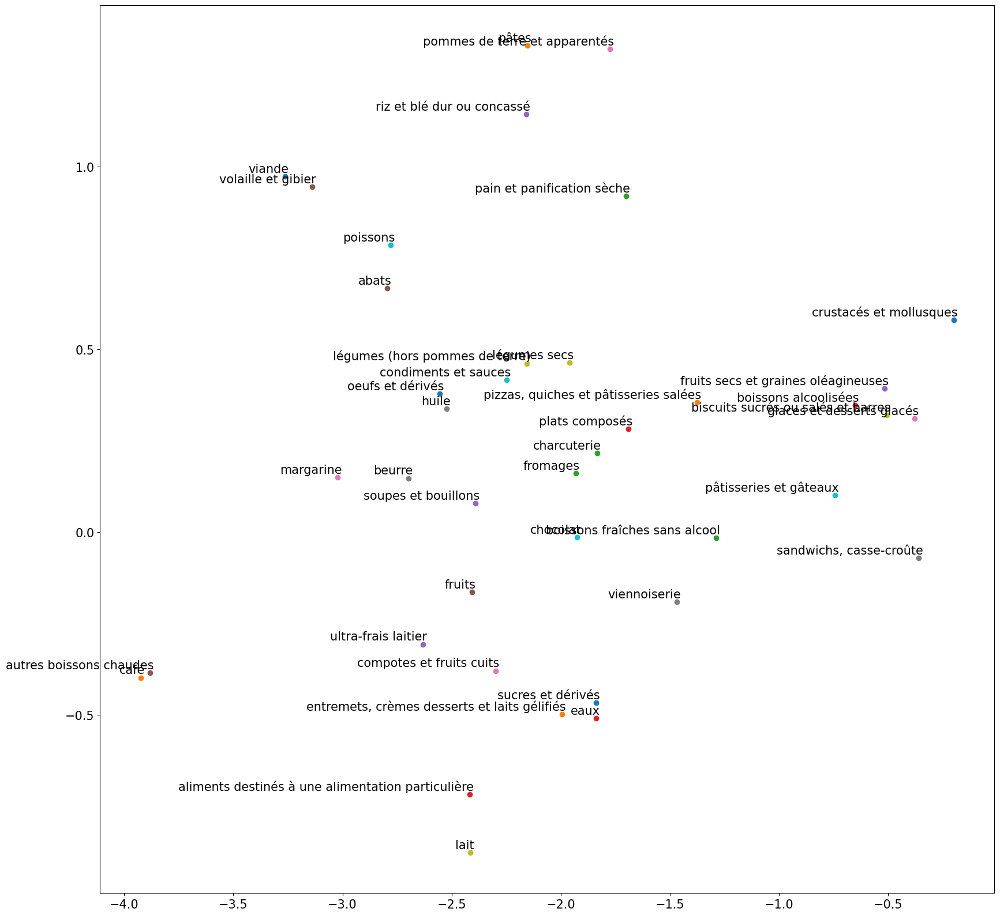

39


In [27]:
from sklearn.manifold import TSNE

def tsne_plot(model):
    "Creates and TSNE model and plots it"
    labels = []
    alim = []
    i=0  

    for e in liste_code_gr_rep:
        if str(e) in model.wv:
            alim.append(model.wv[str(e)])
            if (e) in dic_group:
                labels.append(dic_group[e])        
            i+=1
    alim2=np.array(alim)

    tsne_model = TSNE(perplexity=30, n_components=2, init='pca', n_iter=2500)
    new_values = tsne_model.fit_transform(alim2)

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])
        
    plt.figure(figsize=(20, 20)) 
    plt.rc('font', size=15)
    for i in range(len(x)):
        plt.scatter(x[i],y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
#     plt.savefig("w2v_rep_freq.jpg")
    plt.show()
    print(i)
    
    
tsne_plot(w2v_cbow_rep_freq_load) 


In [27]:
# CLUSTERISER LES SOUS GROUPES DU REPAS AVEC KMEANS

from sklearn.cluster import KMeans

print(np.shape(w2v_cbow_rep_freq_load.wv.vectors))

def cluster_kmeans(matrix, k):
    km_model = KMeans(n_clusters=k, n_init=10).fit(matrix)
    km_labels = km_model.labels_
    centers = km_model.cluster_centers_
    return km_model, km_labels, centers     
    
 # First cluster the item data and return the model
#on définit arbitrairement un nombre de clusters : ici on teste k=8
items_model, items_labels, items_cluster_centers = cluster_kmeans(w2v_cbow_rep_freq_load.wv.vectors, 8)

#on définit arbitrairement un nombre de clusters : ici on teste k=8
#dictionnaire qui associe à chaque aliment sa classe prédite en regardant l'array des probabilités d'appartenance à chaque classe
c=8
dico_cluster_codes={}
dico_cluster_noms={}
for i in range(c):
        dico_cluster_codes[i]=[]
        dico_cluster_noms[i]=[]
for e in gr_non_rare:
    if str(e) in w2v_cbow_rep_freq_load.wv:
        dico_cluster_codes[int(items_model.predict(w2v_cbow_rep_freq_load.wv[str(e)].reshape(1,-1)))].append(e)
        dico_cluster_noms[int(items_model.predict(w2v_cbow_rep_freq_load.wv[str(e)].reshape(1,-1)))].append(dic_group[e])

print(dico_cluster_codes.items())
print(dico_cluster_noms.items())


(40, 10)


C:\Users\jacqueno\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


dict_items([(0, [1, 31, 23, 43, 12, 20, 39, 25, 36, 11, 38, 6, 32, 29]), (1, [33, 7, 8, 22, 27, 28]), (2, [17, 18, 21, 19]), (3, [34, 35]), (4, [37]), (5, [30, 44, 9]), (6, [3, 4, 24]), (7, [10, 26, 15, 13, 41, 14, 42])])
dict_items([(0, ['pain et panification sèche', 'eaux', 'légumes (hors pommes de terre)', 'condiments et sauces', 'oeufs et dérivés', 'charcuterie', 'plats composés', 'légumes secs', 'pizzas, quiches et pâtisseries salées', 'fromages', 'soupes et bouillons', 'viennoiserie', 'boissons fraîches sans alcool', 'chocolat']), (1, ['boissons alcoolisées', 'biscuits sucrés ou salés et barres', 'pâtisseries et gâteaux', 'crustacés et mollusques', 'fruits secs et graines oléagineuses', 'glaces et desserts glacés']), (2, ['viande', 'volaille et gibier', 'poissons', 'abats']), (3, ['café', 'autres boissons chaudes']), (4, ['sandwichs, casse-croûte']), (5, ['sucres et dérivés', 'aliments destinés à une alimentation particulière', 'lait']), (6, ['pâtes', 'riz et blé dur ou concassé'

0.25353965
(40, 10)
(40,)
[0 0 0 0 7 0 7 7 7 1 0 3 2 6 5 0 2 7 0 2 6 0 1 6 7 0 0 4 7 0 1 1 3 1 1 0 5
 5 2 0]

 silhouette en fonction de k:


C:\Users\jacqueno\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\jacqueno\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\jacqueno\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\jacqueno\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory le

[0.289, 0.344, 0.249, 0.264, 0.242, 0.253, 0.245, 0.285, 0.265, 0.268, 0.281, 0.293, 0.24, 0.266, 0.231, 0.255, 0.223, 0.217, 0.244, 0.228, 0.222, 0.246, 0.231, 0.225, 0.192, 0.187, 0.169, 0.175]


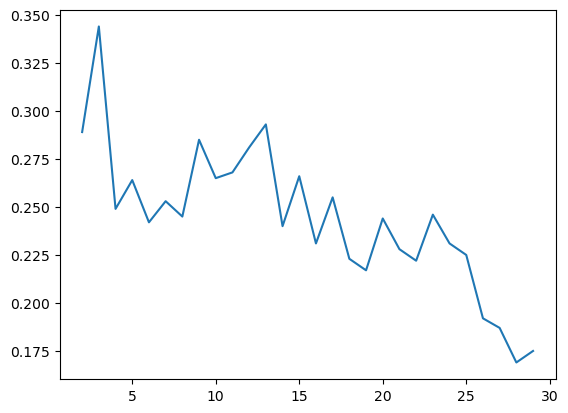

In [28]:
from sklearn import metrics
from sklearn.metrics import pairwise_distances

#Exemple de calcul de silhouette score 
print(metrics.silhouette_score(w2v_cbow_rep_freq_load.wv.vectors, items_labels, metric='euclidean'))
print(np.shape(w2v_cbow_rep_freq_load.wv.vectors))

#classe prédite pour chaque aliment du rep (ici avec k=8)
print(np.shape(items_labels))
print(items_labels[0:100])
#coordonnées des centroides de chaque classe (ici avec k=8)
#print(items_cluster_centers)

#Evaluer le silhouette scores en fonction de la valeur de k 
print("\n", "silhouette en fonction de k:")
x=[]
y=[]
for k in range(2,30):
    items_model, items_labels, items_cluster_centers = cluster_kmeans(w2v_cbow_rep_freq_load.wv.vectors, k)
    x.append(k)
    y.append(round(metrics.silhouette_score(w2v_cbow_rep_freq_load.wv.vectors, items_labels, metric='euclidean'),3))
plt.plot(x,y)
print(y)

# ON FIGE LES CLUSTERS DE GROUPES D'ALIMENTS MAIS ILS RESTENT HETEROGENES 

In [29]:
# ON FIXE A k=9 le nombre de clusters mais ils restent hétéogènes 
items_model, items_labels, items_cluster_centers = cluster_kmeans(w2v_cbow_rep_freq_load.wv.vectors, 9)

import pickle

# save the model 
filename = 'final_model_10dim_kmeans_groupes_repas_9clusters.sav'
# pickle.dump(items_model, open(filename, 'wb'))


C:\Users\jacqueno\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


In [30]:
#load the model basé sur 9 clusters
loaded_kmeans_model = pickle.load(open(filename, 'rb'))
loaded_kmeans_model=items_model

item_labels_load=loaded_kmeans_model.labels_
items_cluster_centers_load=loaded_kmeans_model.cluster_centers_
print(item_labels_load)
# print(items_cluster_centers_load)

[6 6 6 6 6 6 6 8 8 1 3 2 0 4 5 3 0 6 6 0 4 3 1 4 8 0 3 3 8 5 7 1 2 1 1 6 5
 5 0 3]


In [31]:
# dictionnaire qui associe à chaque aliment sa classe prédite, ici k=...

c=9
dico_cluster_codes={}
dico_cluster_noms={}
for i in range(c):
        dico_cluster_codes[i]=[]
        dico_cluster_noms[i]=[]

for e in gr_non_rare:
    if str(e) in w2v_cbow_rep_freq_load.wv:
        dico_cluster_codes[int(items_model.predict(w2v_cbow_rep_freq_load.wv[str(e)].reshape(1,-1)))].append(e)
        dico_cluster_noms[int(items_model.predict(w2v_cbow_rep_freq_load.wv[str(e)].reshape(1,-1)))].append(dic_group[e])
print(dico_cluster_codes.items())

table_cluster_alim=pd.DataFrame(columns=['cluster', 'aliments'], index=range(c))
for i in range(len(dico_cluster_noms.keys())):
    table_cluster_alim.cluster[i]=i
    table_cluster_alim.aliments[i]=dico_cluster_noms[i]
    print("\n", i, ": Ce cluster contient les GROUPES SUIVANTS:", "\n", "\t", dico_cluster_noms[i])           
# table_cluster_alim.to_excel('table_clusters_aliments_repas_10DIMW2V_test.xlsx', index=False)

for i in range(c): 
    print("catégorie", i)
    word_count = {}
    for word in dico_cluster_codes[i]: 
        if dic_group[word] in word_count:
            word_count[dic_group[word]] += 1
        else:
            word_count[dic_group[word]] = 1
    for e in word_count.keys():
        word_count[e]=round((word_count[e]/len(dico_cluster_codes[i])),2)
    print(word_count,"\n")
    
for i in range(c):
    print("catégorie", i, len(dico_cluster_codes[i]), " groupes \n")

dict_items([(0, [17, 12, 18, 21, 19]), (1, [33, 7, 8, 27, 28]), (2, [34, 35]), (3, [20, 39, 36, 6, 32, 37]), (4, [3, 4, 24]), (5, [30, 44, 9, 29]), (6, [1, 31, 15, 13, 23, 43, 14, 25, 11, 38]), (7, [22]), (8, [10, 26, 41, 42])])

 0 : Ce cluster contient les GROUPES SUIVANTS: 
 	 ['viande', 'oeufs et dérivés', 'volaille et gibier', 'poissons', 'abats']

 1 : Ce cluster contient les GROUPES SUIVANTS: 
 	 ['boissons alcoolisées', 'biscuits sucrés ou salés et barres', 'pâtisseries et gâteaux', 'fruits secs et graines oléagineuses', 'glaces et desserts glacés']

 2 : Ce cluster contient les GROUPES SUIVANTS: 
 	 ['café', 'autres boissons chaudes']

 3 : Ce cluster contient les GROUPES SUIVANTS: 
 	 ['charcuterie', 'plats composés', 'pizzas, quiches et pâtisseries salées', 'viennoiserie', 'boissons fraîches sans alcool', 'sandwichs, casse-croûte']

 4 : Ce cluster contient les GROUPES SUIVANTS: 
 	 ['pâtes', 'riz et blé dur ou concassé', 'pommes de terre et apparentés']

 5 : Ce cluster con

In [32]:
d_new

{110006: {1: {3: ['17', '3', '1', '31', '10', '26', '15', '13'],
   5: ['23', '43', '12', '41', '31', '1', '13']},
  2: {3: ['17', '3', '10', '31', '1', '26'],
   5: ['20', '39', '4', '1', '10', '31', '43']},
  3: {3: ['18', '23', '1', '31', '10', '26', '13', '13'],
   5: ['20', '23', '43', '1', '31', '41', '13']},
  4: {3: ['18', '23', '24', '14', '20', '43', '1', '10', '31', '13', '13'],
   5: ['20', '20', '17', '1', '23', '43', '31', '41']},
  5: {3: ['20', '1', '10', '31'], 5: ['20', '25', '1', '10', '31', '43']},
  6: {3: ['21',
    '43',
    '1',
    '10',
    '30',
    '31',
    '4',
    '23',
    '25',
    '23',
    '23',
    '23'],
   5: ['36', '23', '1', '31', '10', '30', '31']},
  7: {3: ['17', '23', '1', '41', '31'],
   5: ['21', '39', '43', '1', '41', '31']}},
 110007: {1: {3: ['17', '23', '11', '1', '31', '33', '26', '15', '14'],
   5: ['38', '20', '31', '10', '26', '1']},
  2: {3: ['17', '23', '1', '11', '33', '31'],
   5: ['38', '20', '1', '10', '31']},
  3: {3: ['19', 

In [33]:
#Calculer les coordonnées des users dans le nouvel espace contenant les clusters des aliments
# ATTENTION ICI ON N A PAS ENLEVE LE JOUR DE RECUEIL CACHE DONC C EST JUSTE POUR TESTER L APPROCHE 
import copy

#On reprend les REPAS qui contiennent les aliments non rares seulement:
d_new2= copy.deepcopy(d_new)
d_new_indiv_nonnuls={}
# print(d_new2)

for key in d_new2:
    for subkey in d_new2[key]:
        for subvalue in d_new[key][subkey]:
            if key in d_new2 and subkey in d_new2[key] and subvalue in d_new2[key][subkey]:
                d_new_indiv_nonnuls.setdefault(key, {})
                d_new_indiv_nonnuls[key][subkey] = d_new2[key][subkey]

print(d_new_indiv_nonnuls)

{110006: {1: {3: ['17', '3', '1', '31', '10', '26', '15', '13'], 5: ['23', '43', '12', '41', '31', '1', '13']}, 2: {3: ['17', '3', '10', '31', '1', '26'], 5: ['20', '39', '4', '1', '10', '31', '43']}, 3: {3: ['18', '23', '1', '31', '10', '26', '13', '13'], 5: ['20', '23', '43', '1', '31', '41', '13']}, 4: {3: ['18', '23', '24', '14', '20', '43', '1', '10', '31', '13', '13'], 5: ['20', '20', '17', '1', '23', '43', '31', '41']}, 5: {3: ['20', '1', '10', '31'], 5: ['20', '25', '1', '10', '31', '43']}, 6: {3: ['21', '43', '1', '10', '30', '31', '4', '23', '25', '23', '23', '23'], 5: ['36', '23', '1', '31', '10', '30', '31']}, 7: {3: ['17', '23', '1', '41', '31'], 5: ['21', '39', '43', '1', '41', '31']}}, 110007: {1: {3: ['17', '23', '11', '1', '31', '33', '26', '15', '14'], 5: ['38', '20', '31', '10', '26', '1']}, 2: {3: ['17', '23', '1', '11', '33', '31'], 5: ['38', '20', '1', '10', '31']}, 3: {3: ['19', '23', '11', '1', '33', '31', '26', '15'], 5: ['23', '12', '42', '10', '1', '31']}, 4:

In [34]:
#On crée un dictionnaire avec pour chaque individu la liste des aliments non rares mangés aux REPAS sur la semaine 
# POUR LES CONSOMMATIONS D'UN USER, ON NE GARDE PAS LES ALIMENTS d'un repas dans lequel figure un aliment rare : 
# on supprime tout le repas!!!

d_indiv_freq={}

for key, value in d_new_indiv_nonnuls.items():
    new_value = []
    for subkey, subvalue in value.items():
        for val, sublist in subvalue.items():          
            for i in sublist:
                new_value.append(i)            
    d_indiv_freq.setdefault(key, {})
    d_indiv_freq[key]= new_value
    
print("longueur du dic:", len(d_indiv_freq))
print(d_indiv_freq)

longueur du dic: 2624
{110006: ['17', '3', '1', '31', '10', '26', '15', '13', '23', '43', '12', '41', '31', '1', '13', '17', '3', '10', '31', '1', '26', '20', '39', '4', '1', '10', '31', '43', '18', '23', '1', '31', '10', '26', '13', '13', '20', '23', '43', '1', '31', '41', '13', '18', '23', '24', '14', '20', '43', '1', '10', '31', '13', '13', '20', '20', '17', '1', '23', '43', '31', '41', '20', '1', '10', '31', '20', '25', '1', '10', '31', '43', '21', '43', '1', '10', '30', '31', '4', '23', '25', '23', '23', '23', '36', '23', '1', '31', '10', '30', '31', '17', '23', '1', '41', '31', '21', '39', '43', '1', '41', '31'], 110007: ['17', '23', '11', '1', '31', '33', '26', '15', '14', '38', '20', '31', '10', '26', '1', '17', '23', '1', '11', '33', '31', '38', '20', '1', '10', '31', '19', '23', '11', '1', '33', '31', '26', '15', '23', '12', '42', '10', '1', '31', '20', '25', '11', '1', '31', '33', '38', '20', '23', '41', '1', '31', '1', '6', '31', '38', '21', '10', '26', '31', '1', '1', '17'

In [35]:
# dictionnaire qui donne pour chaque individu et chaque repas avec aliments non rares les clusters d'aliments consommés

rep_cluster={}

c=9

for key, value in d_new_indiv_nonnuls.items():
    for subkey, subvalue in value.items():
        for val, sublist in subvalue.items():         
            liste=[]
            for a in sublist:
                for i in range(c):
                    if int(a.replace("'", "")) in dico_cluster_codes[i]:
                        liste.append(i)
            if key not in rep_cluster:
                rep_cluster[key] = {}
            
            if subkey not in rep_cluster[key]:
                rep_cluster[key][subkey] = {}

            rep_cluster[key][subkey][val] = liste

rep_cluster


liste_rep_cluster=[]

for key, value in rep_cluster.items():
    for subkey, subvalue in value.items():
        for val, sublist in subvalue.items(): 
            sublist2=sorted(sublist)
            liste_rep_cluster.append(sublist2)
        
print(liste_rep_cluster)        

[[0, 4, 6, 6, 6, 6, 8, 8], [0, 6, 6, 6, 6, 6, 8], [0, 4, 6, 6, 8, 8], [3, 3, 4, 6, 6, 6, 8], [0, 6, 6, 6, 6, 6, 8, 8], [3, 6, 6, 6, 6, 6, 8], [0, 3, 4, 6, 6, 6, 6, 6, 6, 6, 8], [0, 3, 3, 6, 6, 6, 6, 8], [3, 6, 6, 8], [3, 6, 6, 6, 6, 8], [0, 4, 5, 6, 6, 6, 6, 6, 6, 6, 6, 8], [3, 5, 6, 6, 6, 6, 8], [0, 6, 6, 6, 8], [0, 3, 6, 6, 6, 8], [0, 1, 6, 6, 6, 6, 6, 6, 8], [3, 6, 6, 6, 8, 8], [0, 1, 6, 6, 6, 6], [3, 6, 6, 6, 8], [0, 1, 6, 6, 6, 6, 6, 8], [0, 6, 6, 6, 8, 8], [1, 3, 6, 6, 6, 6], [3, 6, 6, 6, 6, 6, 8], [3, 6], [0, 6, 6, 6, 6, 8, 8], [0, 1, 6, 6, 6, 6, 6, 8], [0, 0, 1, 1, 1, 1, 6, 6, 6, 6, 6, 6, 6], [0, 1, 4, 6, 6, 6, 6, 6, 6, 8], [0, 6, 6, 6, 6, 8], [0, 1, 4, 6, 6, 6, 6, 6, 6, 6, 7, 8], [3, 6, 6], [0, 0, 0, 1, 1, 1, 2, 3, 3, 4, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6], [0, 2, 5, 6, 6, 6, 6, 6], [1, 3, 3, 6, 6, 6, 6, 6, 6, 6, 6, 6], [4, 6, 6, 8, 8], [0, 0, 1, 3, 3, 4, 5, 6, 6, 8, 8], [2, 3, 6, 8, 8], [1, 3, 4, 6, 6, 6], [6, 6, 6, 6, 6, 6], [1, 4, 6, 6, 6, 6, 6, 6], [0, 0, 1, 1, 1, 2, 3, 4, 5,

In [36]:
#frequence de conso de chaque cluster
c=9

for i in range(c):
    n=0
    for liste in liste_rep_cluster:
        if (i in liste):
            n+=1
    freq=n/len(liste_rep_cluster)
    print("cluster", i, ": % de repas avec i: ", round(freq, 3))


cluster 0 : % de repas avec i:  0.485
cluster 1 : % de repas avec i:  0.313
cluster 2 : % de repas avec i:  0.23
cluster 3 : % de repas avec i:  0.507
cluster 4 : % de repas avec i:  0.381
cluster 5 : % de repas avec i:  0.233
cluster 6 : % de repas avec i:  0.939
cluster 7 : % de repas avec i:  0.034
cluster 8 : % de repas avec i:  0.602


nombre de repas considérés: 34386


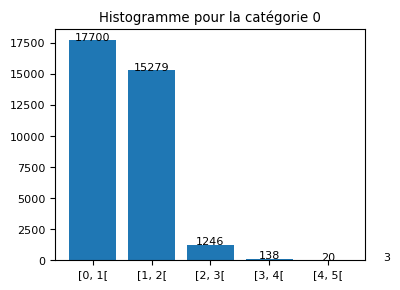

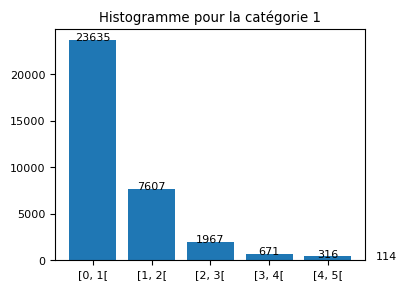

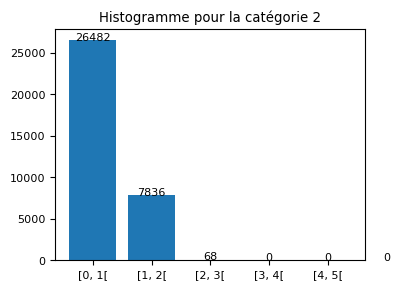

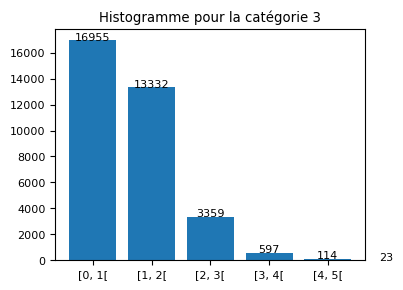

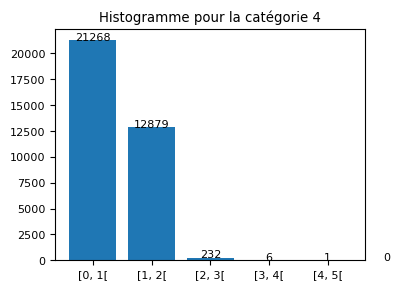

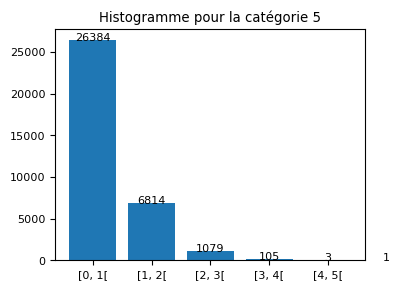

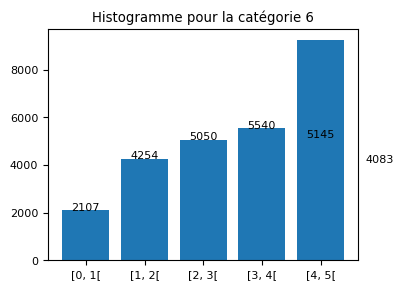

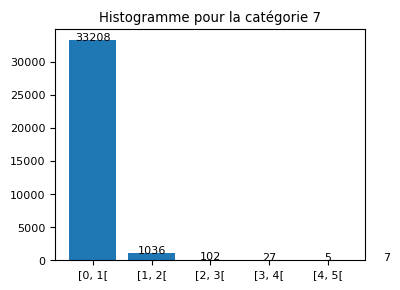

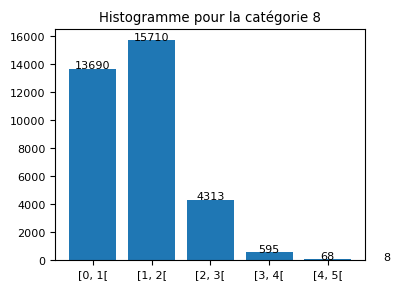

In [37]:
#Nombre d'aliments consommés par cluster, par repas 
 
import numpy as np
import matplotlib.pyplot as plt
plt.rc('font', size=8)

c=9
liste_rep_cluster

print("nombre de repas considérés:", len(liste_rep_cluster))

for i in range(c):
    plt.figure(figsize=(4, 3))
    n = 0
    m = []
    for liste in liste_rep_cluster:
        n += 1
        if i in liste:
            m.append(liste.count(i))
        else:
            m.append(0)
    cat = str(i)
    
    bin_edges = [0, 1, 2, 3, 4, 5]
    plt.hist(m, bins=bin_edges, align='left', rwidth=0.8)
    plt.title("Histogramme pour la catégorie " + cat)
    for j in bin_edges:
        plt.text(bin_edges[j], m.count(j), str(m.count(j)), ha='center')
   
    plt.xticks(bin_edges[:-1], [f"[{x}, {x+1}[" for x in bin_edges[:-1]])
    plt.show()
    

In [40]:
#  Conclusion cette clusterisation avec kmeans pour former des catégories de groupes d'aliments ne résout pas notre problème 
# d'hétérogénité des catégories. On abandonne cette approche basée sur l'apprentissage W2V des groupes. 

In [ ]:
# Nous allons constituer les catégories en fonction de la connaissance expert. 
# NOus souhaitons comprendre comment sont consommés les groupes d'aliments INCA (associations/exclusions de certains groupes) 
# avant de repasser à l'échelle des aliments 

# Etude des motifs fréquents des groupes d'aliments

In [41]:
# REP_alimfreqliste

In [48]:
!pip install mlxtend
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.preprocessing import OneHotEncoder
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules

# Créer un objet MultiLabelBinarizer
mlb = MultiLabelBinarizer()

# Transformer les catégories en une matrice binaire
categories_binary = mlb.fit_transform(REP_alimfreqliste)

# Créer un dataframe à partir de la matrice binaire
df = pd.DataFrame(categories_binary, columns=mlb.classes_)

# Afficher le dataframe
df.head()
# df.info()
new_df_0 = df[["1", "10", "11", "12", "13", "14", "15", "17", "18", "19"]].copy()
# new_df=df[["1", "20", "21", "22", "23", "24", "25", "26", "27", "28", "29"]].copy()
new_df=df[["6", "7", "1", "10", "11", "12", "13", "14", "15", "17", "18", "19", "20", "21", "22", "23", "24", "25", "26", "27", "28", "29"]].copy()
# new_df=df[["3", "30", "31", "32", "33", "34", "35", "36", "38", "39", "4", "41", "42", "43", "44", "6", "7", "8", "9"]].copy()
# new_df.head()


In [43]:
# Générer les itemsets fréquents
frequent_itemsets = apriori(new_df, min_support=0.0001, use_colnames=True)

# # Générer les règles d'association à partir des itemsets fréquents
rules_df = association_rules(frequent_itemsets, metric="support", min_threshold=0.0001)
rules_df = rules_df.sort_values(by="support", ascending=True)
rules_filtered = rules_df[(rules_df['antecedents'].apply(lambda x: len(x) == 1)) & (rules_df['consequents'].apply(lambda x: len(x) == 1))]

# Afficher les règles d'association
rules_new=rules_filtered[0:1000]
# rules_new.to_excel("rules_dej_EXCLUSIONS_44_groups.xlsx", index=False)


C:\Users\jacqueno\anaconda3\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


# Catégories crées par connaissance expert 

GROUPE 1 : % de repas avec i:  0.49
GROUPE 2 : % de repas avec i:  0.0
GROUPE 3 : % de repas avec i:  0.11
GROUPE 4 : % de repas avec i:  0.09
GROUPE 5 : % de repas avec i:  0.0
GROUPE 6 : % de repas avec i:  0.01
GROUPE 7 : % de repas avec i:  0.03
GROUPE 8 : % de repas avec i:  0.09
GROUPE 9 : % de repas avec i:  0.01
GROUPE 10 : % de repas avec i:  0.28
GROUPE 11 : % de repas avec i:  0.34
GROUPE 12 : % de repas avec i:  0.07
GROUPE 13 : % de repas avec i:  0.25
GROUPE 14 : % de repas avec i:  0.3
GROUPE 15 : % de repas avec i:  0.1
GROUPE 16 : % de repas avec i:  0.0
GROUPE 17 : % de repas avec i:  0.2
GROUPE 18 : % de repas avec i:  0.11
GROUPE 19 : % de repas avec i:  0.01
GROUPE 20 : % de repas avec i:  0.23
GROUPE 21 : % de repas avec i:  0.13
GROUPE 22 : % de repas avec i:  0.03
GROUPE 23 : % de repas avec i:  0.52
GROUPE 24 : % de repas avec i:  0.19
GROUPE 25 : % de repas avec i:  0.03
GROUPE 26 : % de repas avec i:  0.31
GROUPE 27 : % de repas avec i:  0.03
GROUPE 28 : % de

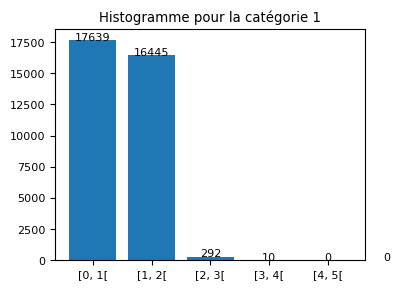

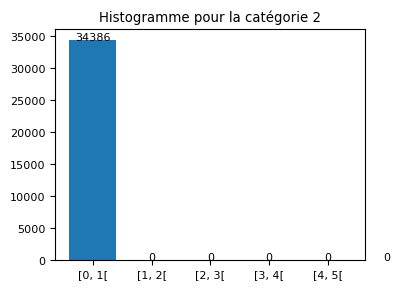

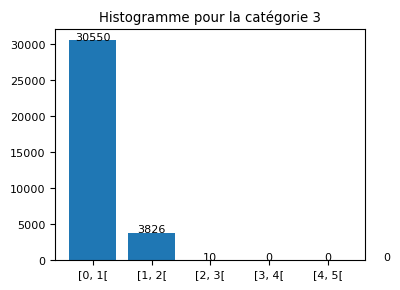

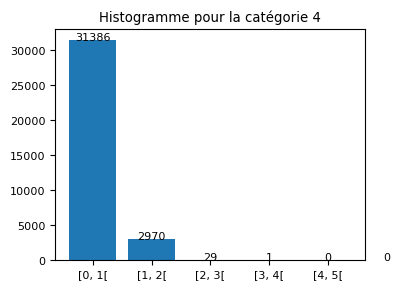

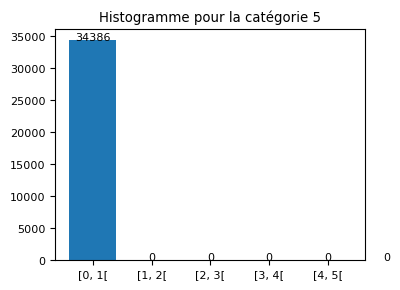

...

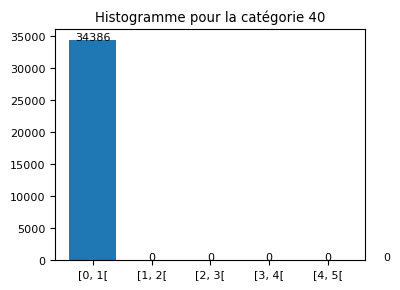

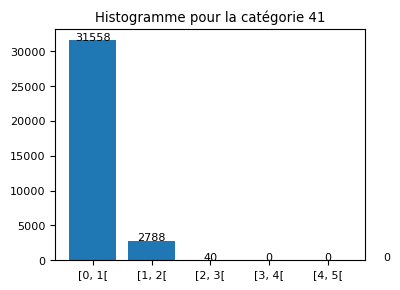

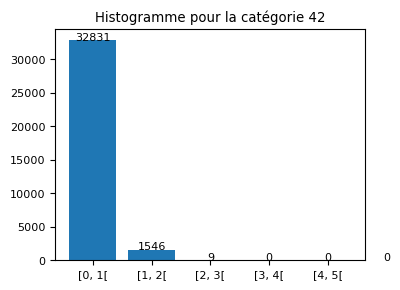

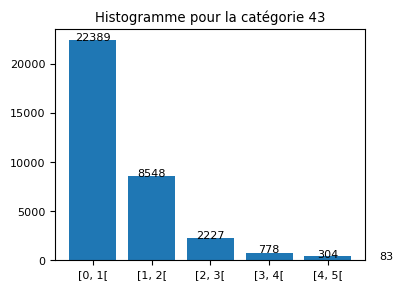

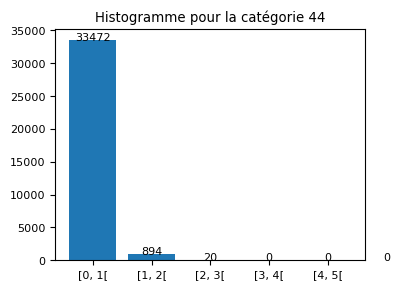

In [38]:
# frequence de consommation de chaque groupe INCA


for i in range(1,45):
    n=0
    for liste in REP_alimfreqliste:
        if (str(i) in liste):
            n+=1
    freq=n/len(REP_alimfreqliste)
    print("GROUPE", i, ": % de repas avec i: ", round(freq, 2))

for i in range(1,45):
    plt.figure(figsize=(4, 3))
    m=[] 
    for liste in REP_alimfreqliste:
        if str(i) in liste:
            m.append(liste.count(str(i)))
        else:
            m.append(0)
    cat = str(i)
    
    bin_edges = [0, 1, 2, 3, 4, 5]
    plt.hist(m, bins=bin_edges, align='left', rwidth=0.8)
    plt.title("Histogramme pour la catégorie " + cat)
    for j in bin_edges:
        plt.text(bin_edges[j], m.count(j), str(m.count(j)), ha='center')
   
    plt.xticks(bin_edges[:-1], [f"[{x}, {x+1}[" for x in bin_edges[:-1]])
    plt.show()
    
#     print(i, m, "\n")
#     print(i, np.mean(m))    

In [39]:
# On regroupe les catégories par connaissance expert (même moment de consommation, même role dans le repas, 
# et qui ne sont pas fréquemment associées ce qui laisse sous entendre qu'elles sont subsituables (jouent le même role dans
# le repas) et ce qui nous permet d'avoir un aliment de la catégorie consommé au repas (sauf certaines catégories comme légumes
# ou condiments sauces)
# on regroupe beurre huile margarine dans la même catégorie (même s'ils ne excluent pas)
# on met dans 1 cluster les groupes d'aliments apparaissant dans moins de 5% des repas 

c1=['2', '5', '6', '7', '9', '16', '19', '22', '25', '27', '28', '29', '35', '37', '40', '42', '44']
c2=['36', '3', '4', '39', '24']
c3=['10']
c4=['43']
c5=['17', '18', '21', '12']
c6=['11']
c7=['31', '32']
c8=['38']
c9=['23']
c10=['1']  
c11=['33']
c12=['34']
c13=['30']
c14=['41', '26', '8']
c15=['13']
c16=['14']
c17=['15']
c18=['20']

c=[c1, c2, c3, c4, c5, c6, c7, c8, c9, c10, c11, c12, c13, c14, c15, c16, c17, c18]
rep_cluster_fi={}

for key, value in d_new_indiv_nonnuls.items():
    for subkey, subvalue in value.items():
        for val, sublist in subvalue.items():         
            liste=[]
            for a in sublist:
                for i in c:
                    if a in i:
                        liste.append(i)
            if key not in rep_cluster_fi:
                rep_cluster_fi[key] = {}
            
            if subkey not in rep_cluster_fi[key]:
                rep_cluster_fi[key][subkey] = {}

            rep_cluster_fi[key][subkey][val] = liste

rep_cluster_fi[110006]


liste_rep_cluster_fi=[]

for key, value in rep_cluster_fi.items():
    for subkey, subvalue in value.items():
        for val, sublist in subvalue.items(): 
            sublist2=sorted(sublist)
            liste_rep_cluster_fi.append(sublist2)
        
print(liste_rep_cluster_fi[:10])     
    

[[['1'], ['10'], ['13'], ['15'], ['17', '18', '21', '12'], ['31', '32'], ['36', '3', '4', '39', '24'], ['41', '26', '8']], [['1'], ['13'], ['17', '18', '21', '12'], ['23'], ['31', '32'], ['41', '26', '8'], ['43']], [['1'], ['10'], ['17', '18', '21', '12'], ['31', '32'], ['36', '3', '4', '39', '24'], ['41', '26', '8']], [['1'], ['10'], ['20'], ['31', '32'], ['36', '3', '4', '39', '24'], ['36', '3', '4', '39', '24'], ['43']], [['1'], ['10'], ['13'], ['13'], ['17', '18', '21', '12'], ['23'], ['31', '32'], ['41', '26', '8']], [['1'], ['13'], ['20'], ['23'], ['31', '32'], ['41', '26', '8'], ['43']], [['1'], ['10'], ['13'], ['13'], ['14'], ['17', '18', '21', '12'], ['20'], ['23'], ['31', '32'], ['36', '3', '4', '39', '24'], ['43']], [['1'], ['17', '18', '21', '12'], ['20'], ['20'], ['23'], ['31', '32'], ['41', '26', '8'], ['43']], [['1'], ['10'], ['20'], ['31', '32']], [['1'], ['10'], ['2', '5', '6', '7', '9', '16', '19', '22', '25', '27', '28', '29', '35', '37', '40', '42', '44'], ['20'], [

nombre de repas considérés: 34386


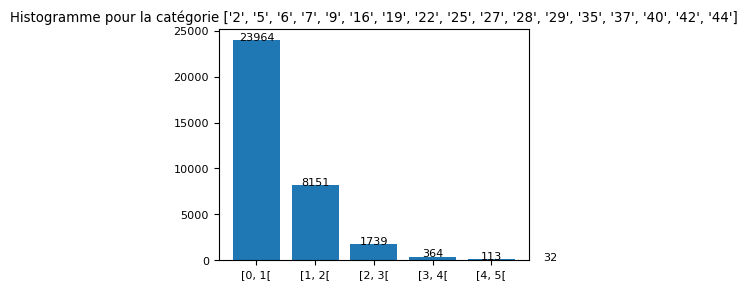

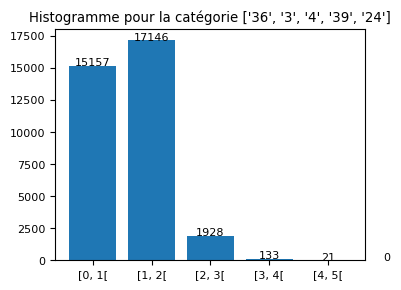

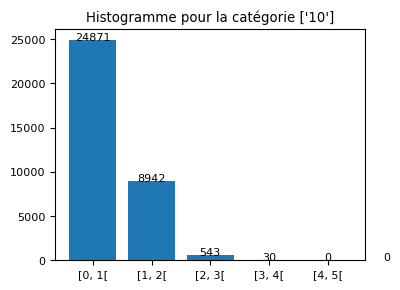

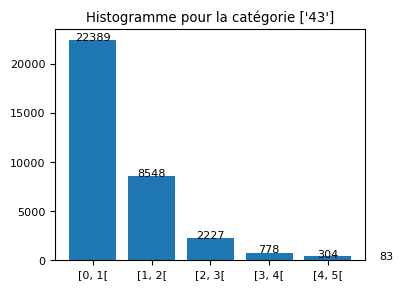

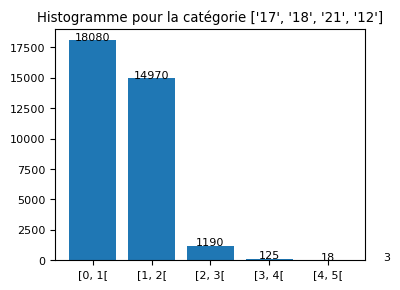

...

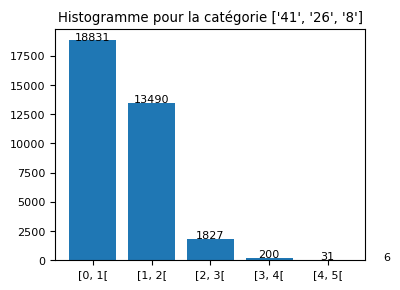

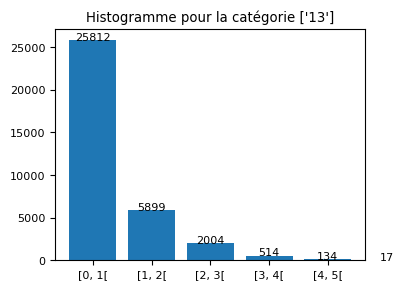

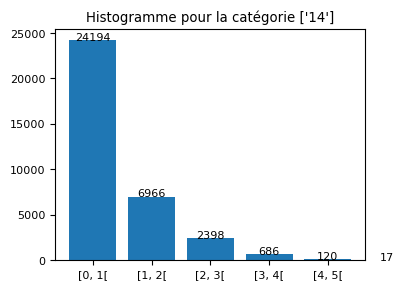

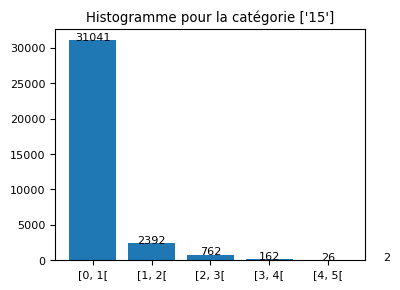

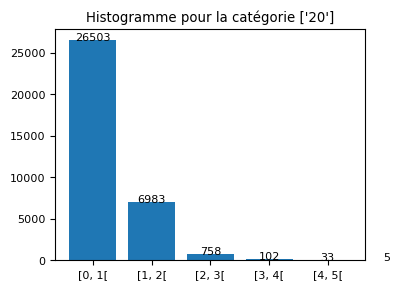

In [40]:
# Nombre d'aliments consommés par catégorie, par repas 
 
import numpy as np
import matplotlib.pyplot as plt
plt.rc('font', size=8)

c=[c1, c2, c3, c4, c5, c6, c7, c8, c9, c10, c11, c12, c13, c14, c15, c16, c17, c18]
liste_rep_cluster_fi

print("nombre de repas considérés:", len(liste_rep_cluster_fi))

for i in c:
    plt.figure(figsize=(4, 3))
    n = 0
    m = []
    for liste in liste_rep_cluster_fi:
        n += 1
        if i in liste:
            m.append(liste.count(i))
        else:
            m.append(0)
    cat = str(i)
    
    bin_edges = [0, 1, 2, 3, 4, 5]
    plt.hist(m, bins=bin_edges, align='left', rwidth=0.8)
    plt.title("Histogramme pour la catégorie " + cat)
    for j in bin_edges:
        plt.text(bin_edges[j], m.count(j), str(m.count(j)), ha='center')
   
    plt.xticks(bin_edges[:-1], [f"[{x}, {x+1}[" for x in bin_edges[:-1]])
    plt.show()
    


In [41]:
# On voudrait diviser en 2 sous groupes la catégorie 23 (légumes) pour comprendre ce que consomment les 
# individus qui consomment 2 légumes 
aliments_clusterdonne_repas={}


i=23
for key, value in d_al.items():
    for subkey, subvalue in value.items():
        for val, sublist in subvalue.items():         
            liste=[]
            for a in sublist:
                if dic_alim_group[int(a)]==i:
                    liste.append(a)
        if key not in aliments_clusterdonne_repas:
            aliments_clusterdonne_repas[key] = {}

        if subkey not in aliments_clusterdonne_repas[key]:
            aliments_clusterdonne_repas[key][subkey] = {}

        aliments_clusterdonne_repas[key][subkey][val] = liste

liste_alim_clusterdonne_repas=[]

for key, value in aliments_clusterdonne_repas.items():
    for subkey, subvalue in value.items():
        for val, sublist in subvalue.items(): 
            sublist2=sorted(sublist)
            liste_alim_clusterdonne_repas.append(sublist2)
        
# print(liste_alim_clusterdonne_repas)   

liste_alim_clusterdonne_repas2=[]
for liste in liste_alim_clusterdonne_repas:
    if (liste!=[] and len(liste)>1):       
        liste_alim_clusterdonne_repas2.append(liste)
liste_alim_clusterdonne_repas2



[['20009', '20011', '20099'],
 ['20008', '20033'],
 ['20008', '25604'],
 ['20011', '20071', '25018'],
 ['20097', '25604'],
 ['20007', '20172'],
 ['20035', '92044'],
 ['20035', '20062'],
 ['20035', '20048'],
 ['20035', '92044'],
 ['20035', '20048'],
 ['20003', '20047', '25604'],
 ['20003', '20009', '20047'],
 ['20035', '20066'],
 ['20006', '25604'],
 ['20035', '25604'],
 ['20009', '20171'],
 ['20017', '20031'],
 ['20008', '20035'],
 ['20172', '25604'],
 ['20009', '20031', '20047'],
 ['20031', '20047'],
 ['20026', '20051', '92044'],
 ['20006', '92044'],
 ['20030', '92044'],
 ['13004', '20047', '20210', '25604'],
 ['20009', '20021'],
 ['20013', '20026', '25604'],
 ['20006', '25604'],
 ['20021', '20495', '25604'],
 ['20003', '20047', '20066', '20210'],
 ['20011', '20037'],
 ['20210', '25616'],
 ['20051', '92044'],
 ['20002', '20014', '20099', '20210'],
 ['20008', '20047'],
 ['20030', '25604'],
 ['20011', '20047', '25604'],
 ['20021', '25604'],
 ['20017', '20047', '25617'],
 ['20047', '2021

In [53]:
# Créer un objet MultiLabelBinarizer
mlb = MultiLabelBinarizer()

# Transformer les catégories en une matrice binaire
categories_binary = mlb.fit_transform(liste_alim_clusterdonne_repas2)

# Créer un dataframe à partir de la matrice binaire
df = pd.DataFrame(categories_binary, columns=mlb.classes_)

# Afficher le dataframe
df.head()



,13004,20000,20001,20002,20003,20005,20006,20007,20008,20009,...,25004,25018,25600,25604,25605,25616,25617,25620,8296,92044
0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,1,0,...,0,0,0,1,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


In [54]:
# Générer les itemsets fréquents
frequent_itemsets = apriori(df, min_support=0.01, use_colnames=True)

# # Générer les règles d'association à partir des itemsets fréquents
rules_df = association_rules(frequent_itemsets, metric="support", min_threshold=0.01)
rules_filtered = rules_df[(rules_df['antecedents'].apply(lambda x: len(x) == 1)) & (rules_df['consequents'].apply(lambda x: len(x) == 1))]
rules_filtered = rules_filtered.sort_values(by="support", ascending=False)

# Afficher les règles d'association
rules_new=rules_filtered[0:3000]
print(rules_new)
# rules_new.to_excel("rules_dej_legumes.xlsx", index=False)



C:\Users\jacqueno\anaconda3\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


   antecedents consequents  antecedent support  consequent support   support  \
61     (25604)     (20047)            0.289577            0.364028  0.111677   
60     (20047)     (25604)            0.364028            0.289577  0.111677   
59     (20210)     (20047)            0.099922            0.364028  0.053292   
58     (20047)     (20210)            0.364028            0.099922  0.053292   
17     (20009)     (20047)            0.110893            0.364028  0.034091   
..         ...         ...                 ...                 ...       ...   
31     (20021)     (25604)            0.050157            0.289577  0.010580   
30     (25604)     (20021)            0.289577            0.050157  0.010580   
48     (20041)     (20047)            0.011755            0.364028  0.010580   
8      (20003)     (25604)            0.055251            0.289577  0.010188   
9      (25604)     (20003)            0.289577            0.055251  0.010188   

    confidence      lift  leverage  con

In [58]:
hd=rules_new.head(30)
for index, row in hd.iterrows():
    antecedent = list(row.antecedents)[0]
    consequent = list(row.consequents)[0]
    print(f"aliment1 : {dic_alim[int(antecedent)]}")
    print(f"aliment2 : {dic_alim[int(consequent)]}")
    print(f"support de l'association: {round(row.support, 3)}", "\n")
    
# Conclusion lorsque 2 légumes sont consommés, il s'agit le plus souvent de légumes crus 

aliment1 : salade verte sans assaisonnement sans précision
aliment2 : tomate crue
support de l'association: 0.112 

aliment1 : tomate crue
aliment2 : salade verte sans assaisonnement sans précision
support de l'association: 0.112 

aliment1 : concombre cru pulpe
aliment2 : tomate crue
support de l'association: 0.053 

aliment1 : tomate crue
aliment2 : concombre cru pulpe
support de l'association: 0.053 

aliment1 : carotte crue
aliment2 : tomate crue
support de l'association: 0.034 

aliment1 : tomate crue
aliment2 : carotte crue
support de l'association: 0.034 

aliment1 : maïs doux en conserve
aliment2 : tomate crue
support de l'association: 0.033 

aliment1 : tomate crue
aliment2 : maïs doux en conserve
support de l'association: 0.033 

aliment1 : tomate crue
aliment2 : haricot vert cuit
support de l'association: 0.024 

aliment1 : haricot vert cuit
aliment2 : tomate crue
support de l'association: 0.024 

aliment1 : laitue crue
aliment2 : tomate crue
support de l'association: 0.024 

In [59]:
# On voudrait diviser en 2 sous groupes la catégorie 20 (charcuterie) 

aliments_clusterdonne_repas={}

i=[20, 17, 18, 21, 12]
for key, value in d_al.items():
    for subkey, subvalue in value.items():
        for val, sublist in subvalue.items():         
            liste=[]
            for a in sublist:
                if dic_alim_group[int(a.replace("'",""))] in i:
                    liste.append(a)
        if key not in aliments_clusterdonne_repas:
            aliments_clusterdonne_repas[key] = {}

        if subkey not in aliments_clusterdonne_repas[key]:
            aliments_clusterdonne_repas[key][subkey] = {}

        aliments_clusterdonne_repas[key][subkey][val] = liste

liste_alim_clusterdonne_repas=[]



for key, value in aliments_clusterdonne_repas.items():
    for subkey, subvalue in value.items():
        for val, sublist in subvalue.items(): 
            sublist2=sorted(sublist)
            liste_alim_clusterdonne_repas.append(sublist2)
        
# print(liste_alim_clusterdonne_repas)   

liste_alim_clusterdonne_repas2=[]
for liste in liste_alim_clusterdonne_repas:
    if (liste!=[] and len(liste)>2):       
        liste_alim_clusterdonne_repas2.append(liste)
liste_alim_clusterdonne_repas2


[['25505', '30005', '30780'],
 ['26037', '26039', '6550', '8320'],
 ['26037', '28301', '30315'],
 ['28916', '8055', '8211'],
 ['26039', '28916', '92508'],
 ['28916', '8211', '8504'],
 ['28301', '8211', '8504'],
 ['28504', '30746', '34002'],
 ['28916', '30300', '8320'],
 ['22010', '6902', '8320'],
 ['26037', '26046', '30746'],
 ['22010', '28916', '8211'],
 ['22010', '26071', '36004'],
 ['26037', '36018', '8211'],
 ['28504', '28916', '30742'],
 ['26037', '26039', '6210'],
 ['26037', '36302', '8800'],
 ['26037', '26039', '26046', '28301', '6210'],
 ['28727', '28801', '28916', '30304'],
 ['26037', '34500', '36102'],
 ['6255', '8211', '90119'],
 ['30300', '8305', '8800'],
 ['30780', '36205', '8320'],
 ['28800', '30300', '30700'],
 ['28504', '30108', '30742'],
 ['26046', '28802', '30789'],
 ['28727', '28802', '28916', '30304', '8211'],
 ['28802', '28916', '30304'],
 ['28850', '28916', '30304'],
 ['26039', '28101', '8211'],
 ['28800', '28916', '8211'],
 ['28916', '6200', '6999'],
 ['28802', '

In [60]:
# Créer un objet MultiLabelBinarizer
mlb = MultiLabelBinarizer()

# Transformer les catégories en une matrice binaire
categories_binary = mlb.fit_transform(liste_alim_clusterdonne_repas2)

# Créer un dataframe à partir de la matrice binaire
df = pd.DataFrame(categories_binary, columns=mlb.classes_)

# Afficher le dataframe
df.head()

,14000,14003,21501,21503,22009,22010,22014,22500,22501,22502,...,8551,8704,8800,90119,91038,91047,92040,92042,92508,92509
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


In [61]:
# Générer les itemsets fréquents
frequent_itemsets = apriori(df, min_support=0.0001, use_colnames=True)

# # Générer les règles d'association à partir des itemsets fréquents
rules_df = association_rules(frequent_itemsets, metric="support", min_threshold=0.0001)
rules_filtered=rules_df
# rules_filtered = rules_df[(rules_df['antecedents'].apply(lambda x: len(x) == 1)) & (rules_df['consequents'].apply(lambda x: len(x) == 1))]
rules_filtered = rules_filtered.sort_values(by="support", ascending=False)

# Afficher les règles d'association
rules_new=rules_filtered[0:3000]
print(rules_new)
# rules_new.to_excel("rules_dej_charcuterie.xlsx", index=False)

C:\Users\jacqueno\anaconda3\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


         antecedents           consequents  antecedent support  \
878          (28800)               (28916)            0.146789   
879          (28916)               (28800)            0.220183   
992          (30300)               (28916)            0.162080   
993          (28916)               (30300)            0.220183   
85           (26039)               (22010)            0.103976   
...              ...                   ...                 ...   
6617         (26037)   (36302, 6520, 6220)            0.134557   
6678    (6210, 8320)         (8291, 26038)            0.015291   
6616          (6220)  (36302, 6520, 26037)            0.024465   
6599  (36202, 26037)          (6520, 6220)            0.003058   
6600          (6520)  (6220, 36202, 26037)            0.027523   

      consequent support   support  confidence       lift  leverage  \
878             0.220183  0.070336    0.479167   2.176215  0.038016   
879             0.146789  0.070336    0.319444   2.176215  0.0380

In [62]:
hd=rules_new.head(30)
for index, row in hd.iterrows():
    antecedent1 = list(row.antecedents)[0]
    print(f"aliment1 : {dic_alim[int(antecedent1)]}")
    if len(row.antecedents)==2:
        antecedent2 = list(row.antecedents)[1]
        print(f"aliment2 : {dic_alim[int(antecedent2)]}")
    if len(row.antecedents)==3:     
        antecedent3 = list(row.antecedents)[2]
        print(f"aliment3 : {dic_alim[int(antecedent3)]}")
    consequent1 = list(row.consequents)[0]
    print(f"aliment4 : {dic_alim[int(consequent1)]}")
    if len(row.consequents)==2:
        consequent2 = list(row.consequents)[1]
        print(f"aliment5 : {dic_alim[int(consequent2)]}")
    if len(row.consequents)==3:
        consequent3 = list(row.consequents)[2]
        print(f"aliment6 : {dic_alim[int(consequent3)]}")

    print(f"support de l'association: {round(row.support, 3)}", "\n")
    
# Conclusion lorsque 2 portions de charcuteries ou oeufs ou poissons ou viande sont consommés:   
# voir ci dessous les plus fréquentes 

aliment1 : jambon cru
aliment4 : jambon cuit
support de l'association: 0.07 

aliment1 : jambon cuit
aliment4 : jambon cru
support de l'association: 0.07 

aliment1 : saucisson sec
aliment4 : jambon cuit
support de l'association: 0.061 

aliment1 : jambon cuit
aliment4 : saucisson sec
support de l'association: 0.061 

aliment1 : thon au naturel en conserve égoutté
aliment4 : oeuf dur
support de l'association: 0.052 

aliment1 : oeuf dur
aliment4 : thon au naturel en conserve égoutté
support de l'association: 0.052 

aliment1 : jambon cru
aliment4 : saucisson sec
support de l'association: 0.046 

aliment1 : saucisson sec
aliment4 : jambon cru
support de l'association: 0.046 

aliment1 : jambon cuit
aliment4 : bacon filet cuit
support de l'association: 0.043 

aliment1 : bacon filet cuit
aliment4 : jambon cuit
support de l'association: 0.043 

aliment1 : pâté de campagne
aliment4 : jambon cuit
support de l'association: 0.037 

aliment1 : jambon cuit
aliment4 : pâté de campagne
support de

# On repart sur l'apprentissage W2V des aliments (et non plus des groupes d'aliments)

In [94]:
#Créer un dictionnaire qui contient tous les aliments des repas des 7 jours  par individu 
d_indiv = {}
for index, row in conso_rep1.iterrows():
    d_indiv.setdefault(row.nomen, []).append(str(row.codal))
  
print(d_indiv)

{110006: ['28301', '9811', '7001', '18008', '19611', '13030', '16632', '81007', '20047', '11110', '22501', '39221', '18008', '7001', '81007', '25163', '9811', '19640', '18008', '7001', '13037', '8400', '25103', '9104', '7001', '19640', '18008', '11110', '36005', '20071', '7001', '18008', '19611', '13014', '81007', '81007', '28925', '20071', '11110', '7001', '18008', '39221', '81007', '36306', '20101', '4003', '17440', '28504', '11081', '7001', '19640', '18008', '81007', '81007', '30780', '30005', '25505', '7001', '92044', '11110', '18008', '39221', '28900', '7001', '19624', '18008', '8400', '20510', '7001', '19628', '18008', '11110', '26039', '11110', '7001', '19510', '31076', '18008', '9104', '20017', '20503', '20088', '20035', '20066', '25548', '92044', '7001', '18008', '19510', '31076', '18008', '6210', '20030', '7001', '23525', '18008', '26034', '25606', '11110', '7001', '23525', '18008'], 110007: ['28301', '20031', '12020', '7100', '76057', '5205', '13024', '81047', '81025', '2590

In [95]:
# Créer un dictionnaire qui contient le nombre d'individus qui ont consommé au moins une fois 
# l'aliment à un repas, pour chaque aliment du repas 

d_freq_alim={}

for e in liste_code_al_rep:
    d_freq_alim[e]=0
    for i in d_indiv.keys():
        if str(e) in d_indiv[i]:
            d_freq_alim[e]=d_freq_alim[e]+1
d_freq_alim

{28301: 500,
 9811: 1894,
 7001: 2013,
 18008: 865,
 19611: 93,
 13030: 160,
 16632: 151,
 81007: 242,
 20047: 1367,
 11110: 1013,
 22501: 369,
 39221: 103,
 25163: 89,
 19640: 172,
 13037: 454,
 8400: 109,
 25103: 206,
 9104: 1411,
 36005: 762,
 20071: 327,
 13014: 259,
 28925: 144,
 36306: 524,
 20101: 134,
 4003: 939,
 17440: 358,
 28504: 438,
 11081: 161,
 30780: 348,
 30005: 111,
 25505: 55,
 92044: 380,
 28900: 116,
 19624: 285,
 20510: 154,
 19628: 351,
 26039: 416,
 19510: 214,
 31076: 24,
 20017: 322,
 20503: 37,
 20088: 44,
 20035: 563,
 20066: 269,
 25548: 111,
 6210: 353,
 20030: 581,
 23525: 165,
 26034: 148,
 25606: 230,
 20031: 386,
 12020: 160,
 7100: 440,
 76057: 133,
 5205: 586,
 13024: 552,
 81047: 62,
 81025: 439,
 25902: 774,
 28916: 1343,
 13039: 1115,
 6200: 755,
 12740: 66,
 76050: 28,
 28801: 64,
 40053: 18,
 20021: 435,
 12009: 86,
 20098: 302,
 22010: 805,
 13038: 346,
 20506: 19,
 25900: 29,
 8800: 95,
 25604: 1474,
 39212: 120,
 7330: 11,
 7730: 23,
 26030:

In [96]:
#Identifier (et eliminer) les groupes d'aliments qui sont consommés dans moins de 5% des repas et les aliments correspondants, 
# ainsi que les aliments consommés par moins de 3% des individus
low_freq=[]
for i in range(1,45):
    n=0
    for liste in REP_alimfreqliste:
        if (str(i) in liste):
            n+=1
    freq=n/len(REP_alimfreqliste)
    if freq<0.05:
        low_freq.append(i)
        print("GROUPE", i, ": % de repas avec groupe i: ", round(freq, 3))

Alim_non_rare=[]
Alim_rare=[]

for e in liste_code_al_rep:
    if d_freq_alim[e]<79:   
        Alim_rare.append(e)
    for k in low_freq:
#         if dic_alim_group[e]==k:
        if (dic_alim_group[e]==k and d_freq_alim[e]>78):          
            Alim_rare.append(e)
            
for element in liste_code_al_rep:
    if element not in Alim_rare:
        Alim_non_rare.append(element)
        
print("Nb d'aliments fréquemment consommés:", len(Alim_non_rare))
print("Nb d'aliments rarement consommés:", len(Alim_rare))



GROUPE 2 : % de repas avec groupe i:  0.0
GROUPE 5 : % de repas avec groupe i:  0.0
GROUPE 6 : % de repas avec groupe i:  0.005
GROUPE 7 : % de repas avec groupe i:  0.033
GROUPE 9 : % de repas avec groupe i:  0.015
GROUPE 16 : % de repas avec groupe i:  0.0
GROUPE 19 : % de repas avec groupe i:  0.013
GROUPE 22 : % de repas avec groupe i:  0.034
GROUPE 25 : % de repas avec groupe i:  0.029
GROUPE 27 : % de repas avec groupe i:  0.027
GROUPE 28 : % de repas avec groupe i:  0.029
GROUPE 29 : % de repas avec groupe i:  0.041
GROUPE 35 : % de repas avec groupe i:  0.033
GROUPE 37 : % de repas avec groupe i:  0.045
GROUPE 40 : % de repas avec groupe i:  0.0
GROUPE 42 : % de repas avec groupe i:  0.045
GROUPE 44 : % de repas avec groupe i:  0.027
Nb d'aliments fréquemment consommés: 335
Nb d'aliments rarement consommés: 978


In [97]:
for i in Alim_non_rare:
    print(i, dic_alim[i])
    
# with open("Alim_non_rare_repas.pkl", "wb") as fichier:
#     # Utiliser pickle.dump pour enregistrer 
#     pickle.dump(Alim_non_rare, fichier)
    
# with open("Alim_non_rare_repas.pkl", "rb") as fichier:
#     # Utiliser pickle.load pour charger
#     Alim_non_rare = pickle.load(fichier)

28301 porc rôti cuit
9811 pâtes alimentaires cuites
7001 pain baguette
18008 eau de source
19611 yaourt aromatisé au lait entier sucré
13030 nectarine non pelée fraîche
16632 matière grasse allégée 60% m.g.
81007 beurre allégé ajouté à la cuisson
20047 tomate crue
11110 vinaigrette sans précision
22501 oeuf au plat salé
39221 dessert au lait gélifié aromatisé nappé de caramel type flanby
25163 buf boulettes cuites
19640 yaourt aromatisé au lait demi-écrémé sucré
13037 poire non pelée fraîche
8400 pâté de tête ou fromage de tête
25103 tomate farcie
9104 riz blanc cuit
36005 poulet rôti viande et peau
20071 haricot vert surgelé cuit
13014 fraise fraîche
28925 jambon cuit dd (découenné dégraissé)
36306 dinde ou autre volaille escalope sautée
20101 légumes mélangés surgelés
4003 pomme de terre cuite à l'eau
17440 huile de tournesol
28504 lardon nature cuit
11081 épices sans précision
30780 saucisse sans précision
30005 chipolata cuite
92044 autre salade sans assaisonnement
28900 jambon cu

In [98]:
for i in Alim_rare:
    print(i, dic_alim[i])
    
# with open("Alim_rare_repas.pkl", "wb") as fichier:
#     # Utiliser pickle.dump pour enregistrer 
#     pickle.dump(Alim_rare, fichier)
    
# with open("Alim_rare_repas.pkl", "rb") as fichier:
#     # Utiliser pickle.load pour charger
#     Alim_rare = pickle.load(fichier)

25505 brochette de buf
20510 lentille cuisinée en conserve
31076 sucre allégé type tutti free
20503 haricot rouge cuit
20088 poivron rouge cuit
81047 margarine type primevère 60% m.g. ajoutée à la cuisson
12740 mimolette fromage à pâte pressée non cuite 45% m.g.
76050 thonon eau plate
28801 jambon cru fumé
40053 cur de buf cuit
13038 compote de pomme en conserve
20506 pois cassé cuit
25900 soupe aux lentilles
7330 biscotte multicéréales type heudebert aux six céréales
7730 pain au chocolat feuilleté artisanal
19601 yaourt nature au lait entier
19524 fromage frais à tartiner 40-60% m.g
42 cocktail type punch planteur
38402 biscuit apéritif type cracker nature type tuc ou triangolini
36102 caille cuite viande et peau
23900 pâtisserie sans précision
90098 p'tit louis fromage fondu 65% m.g.
19851 spécialité laitière aux fruits à base de fromage blanc enrichie en crème type ge
90072 chaumes fromage à pâte molle à croûte lavée 50% m.g.
20018 cur de palmier en conserve
26033 roussette ou 

In [99]:
#Enlever les REPAS qui contiennent les aliments rares

dalim_new = {}
for key, value in d_al.items():
    valeur={}
    for subkey, sublist in value.items():
        new_value = {}
        for sous_cle, sous_liste in sublist.items():
            if not any(str(e) in sous_liste for e in Alim_rare):
                new_value[sous_cle] = sous_liste
        valeur[subkey]=new_value
    dalim_new[key] = valeur
    
print("longueur du dic:", len(dalim_new))
print(dalim_new)


longueur=0
for key in dalim_new.keys():
    for i in range(1,8):
        if i in dalim_new[key]:
            for j in [3,5]:
                if j in dalim_new[key][i]:
                    longueur+=1
print("nombre de repas remplis", longueur)


# Vérifier la cohérence des nombres de repas  
repas_manquant=0
jour_manquant=0
for key in dalim_new.keys():
    for i in range(1,8):
        if i not in dalim_new[key]:
            jour_manquant+=1
        elif i in dalim_new[key]:
            for j in [3,5]:
                if j not in dalim_new[key][i]:
                    repas_manquant+=1
print("nombre de repas manquants", repas_manquant)
print("nombre de jours manquants (les 2 repas)", jour_manquant)


longueur du dic: 2624
{110006: {1: {3: ['28301', '9811', '7001', '18008', '19611', '13030', '16632', '81007'], 5: ['20047', '11110', '22501', '39221', '18008', '7001', '81007']}, 2: {3: ['25163', '9811', '19640', '18008', '7001', '13037'], 5: ['8400', '25103', '9104', '7001', '19640', '18008', '11110']}, 3: {3: ['36005', '20071', '7001', '18008', '19611', '13014', '81007', '81007'], 5: ['28925', '20071', '11110', '7001', '18008', '39221', '81007']}, 4: {3: ['36306', '20101', '4003', '17440', '28504', '11081', '7001', '19640', '18008', '81007', '81007']}, 5: {3: ['28900', '7001', '19624', '18008']}, 6: {}, 7: {3: ['6210', '20030', '7001', '23525', '18008'], 5: ['26034', '25606', '11110', '7001', '23525', '18008']}}, 110007: {1: {5: ['25902', '28916', '76057', '19640', '13039', '7100']}, 2: {}, 3: {}, 4: {}, 5: {}, 6: {}, 7: {}}, 110020: {1: {}, 2: {}, 3: {}, 4: {3: ['9811', '13039', '19700', '76022', '11114']}, 5: {}, 6: {5: ['20009', '1007', '25902', '9811', '11114', '12114', '18009', 

In [100]:
#Sequences des REPAS qui ne contiennent pas les aliments rares

REP_vraisalimfreqliste=[]
for cle, valeur in dalim_new.items():
    for sous_cle, sous_valeur in valeur.items(): 
        for sous_liste in sous_valeur.values():
            REP_vraisalimfreqliste.append(sous_liste)

print(REP_vraisalimfreqliste)
print(len(REP_vraisalimfreqliste))


[['28301', '9811', '7001', '18008', '19611', '13030', '16632', '81007'], ['20047', '11110', '22501', '39221', '18008', '7001', '81007'], ['25163', '9811', '19640', '18008', '7001', '13037'], ['8400', '25103', '9104', '7001', '19640', '18008', '11110'], ['36005', '20071', '7001', '18008', '19611', '13014', '81007', '81007'], ['28925', '20071', '11110', '7001', '18008', '39221', '81007'], ['36306', '20101', '4003', '17440', '28504', '11081', '7001', '19640', '18008', '81007', '81007'], ['28900', '7001', '19624', '18008'], ['6210', '20030', '7001', '23525', '18008'], ['26034', '25606', '11110', '7001', '23525', '18008'], ['25902', '28916', '76057', '19640', '13039', '7100'], ['9811', '13039', '19700', '76022', '11114'], ['20009', '1007', '25902', '9811', '11114', '12114', '18009', '81061'], ['25902', '25103', '9104', '12114', '18008', '7001', '81029', '81009'], ['25906', '8400', '25606', '11110', '19700', '7001', '18008', '13037'], ['9811', '11107', '81022'], ['76061', '13034', '20051', '

In [101]:
for a in REP_vraisalimfreqliste[:20]:
    print("repas:")
    for e in a:
        print(dic_alim[int(e.replace("'",""))])

repas:
porc rôti cuit
pâtes alimentaires cuites
pain baguette
eau de source
yaourt aromatisé au lait entier sucré
nectarine non pelée fraîche
matière grasse allégée 60% m.g.
beurre allégé ajouté à la cuisson
repas:
tomate crue
vinaigrette sans précision
oeuf au plat salé
dessert au lait gélifié aromatisé nappé de caramel type flanby
eau de source
pain baguette
beurre allégé ajouté à la cuisson
repas:
buf boulettes cuites
pâtes alimentaires cuites
yaourt aromatisé au lait demi-écrémé sucré
eau de source
pain baguette
poire non pelée fraîche
repas:
pâté de tête ou fromage de tête
tomate farcie
riz blanc cuit
pain baguette
yaourt aromatisé au lait demi-écrémé sucré
eau de source
vinaigrette sans précision
repas:
poulet rôti viande et peau
haricot vert surgelé cuit
pain baguette
eau de source
yaourt aromatisé au lait entier sucré
fraise fraîche
beurre allégé ajouté à la cuisson
beurre allégé ajouté à la cuisson
repas:
jambon cuit dd (découenné dégraissé)
haricot vert surgelé cuit
vinaigre

In [102]:
nb_alim_rep=[]
for i in range(len(REP_vraisalimfreqliste)):
    nb_alim_rep.append(len(REP_vraisalimfreqliste[i]))
#Nombre d'aliments max consommées par un individu en 1 PDJ
print("nombre max:", max(nb_alim_rep))
#Nombre moyen d'aliments consommées par un individu en 1 PDJ
print("nombre moyen:", sum(nb_alim_rep)/len(nb_alim_rep))

nombre max: 24
nombre moyen: 5.91553557534365


In [87]:
# Créer un dictionnaire qui liste les aliments par catégorie, et identifier le nombre d'aliments par catégorie
import pickle

def trouver_cles_par_valeur(dictionnaire, valeur):
    cles_trouvees = []
    for cle, valeur_dans_dico in dictionnaire.items():
        if valeur_dans_dico == valeur:
                cles_trouvees.append(cle)
    return cles_trouvees

print(trouver_cles_par_valeur(dic_alim_group, 6))

dic_alim_cat={}
dic_alimnonrare_cat={}
for i in c:
    dic_alim_cat[tuple(i)]=[]
    dic_alimnonrare_cat[tuple(i)]=[]
    Nbre_alim=0
    Nbre_alimnonrare=0
    for e in i: 
        dic_alim_cat[tuple(i)].extend((trouver_cles_par_valeur(dic_alim_group, int(e))))
    for a in dic_alim_cat[tuple(i)]: 
        if a in Alim_non_rare:
            dic_alimnonrare_cat[tuple(i)].append(a)
    Nbre_alim+=len(dic_alim_cat[tuple(i)])
    Nbre_alimnonrare+=len(dic_alimnonrare_cat[tuple(i)])
    print("catégorie", i, len(i), " groupes, ", Nbre_alim, "aliments en tout")
    print("catégorie", i, len(i), " groupes, ", Nbre_alimnonrare, "aliments non rares")
    
dic_alimnonrare_cat_noms={}
for key, value in dic_alimnonrare_cat.items():
    dic_alimnonrare_cat_noms.setdefault(key, [])
    for e in value:
        dic_alimnonrare_cat_noms[key].append(dic_alim[e])
dic_alimnonrare_cat_noms


# with open("dic_alimnonrare_cat_repas.pkl", "wb") as fichier:
#     # Utiliser pickle.dump pour enregistrer 
#     pickle.dump(dic_alim_cat, fichier)

# with open("dic_alimnonrare_cat_noms_repas.pkl", "wb") as fichier:
#     # Utiliser pickle.dump pour enregistrer 
#     pickle.dump(dic_alimnonrare_cat_noms, fichier)   
    
c_new=copy.deepcopy(c)
c_new.remove(c1)

[7601, 7615, 7620, 7650, 7710, 7720, 7730, 7740, 7741, 23480, 24660, 92510]
catégorie ['2', '5', '6', '7', '9', '16', '19', '22', '25', '27', '28', '29', '35', '37', '40', '42', '44'] 17  groupes,  268 aliments en tout
catégorie ['2', '5', '6', '7', '9', '16', '19', '22', '25', '27', '28', '29', '35', '37', '40', '42', '44'] 17  groupes,  0 aliments non rares
catégorie ['36', '3', '4', '39', '24'] 5  groupes,  121 aliments en tout
catégorie ['36', '3', '4', '39', '24'] 5  groupes,  41 aliments non rares
catégorie ['10'] 1  groupes,  61 aliments en tout
catégorie ['10'] 1  groupes,  22 aliments non rares
catégorie ['43'] 1  groupes,  63 aliments en tout
catégorie ['43'] 1  groupes,  29 aliments non rares
catégorie ['17', '18', '21', '12'] 4  groupes,  147 aliments en tout
catégorie ['17', '18', '21', '12'] 4  groupes,  39 aliments non rares
catégorie ['11'] 1  groupes,  105 aliments en tout
catégorie ['11'] 1  groupes,  23 aliments non rares
catégorie ['31', '32'] 2  groupes,  116 alime

In [88]:
dic_alimnonrare_cat

{('2',
  '5',
  '6',
  '7',
  '9',
  '16',
  '19',
  '22',
  '25',
  '27',
  '28',
  '29',
  '35',
  '37',
  '40',
  '42',
  '44'): [],
 ('36', '3', '4', '39', '24'): [25435,
  25515,
  25516,
  25548,
  92051,
  25405,
  9811,
  9822,
  9081,
  9683,
  9104,
  25001,
  25002,
  25003,
  25013,
  25031,
  25033,
  25127,
  25009,
  25019,
  25056,
  25081,
  25606,
  25410,
  25420,
  25512,
  25089,
  25103,
  25524,
  25088,
  25608,
  4002,
  4003,
  4005,
  4006,
  4010,
  4013,
  4018,
  4019,
  4021,
  4027],
 ('10',): [19402,
  19420,
  19430,
  81000,
  81002,
  19600,
  19602,
  19606,
  19609,
  19611,
  19624,
  19628,
  19640,
  19700,
  19730,
  19760,
  19765,
  19800,
  19850,
  90057,
  19501,
  19510],
 ('43',): [11054,
  11107,
  11108,
  11109,
  11110,
  11113,
  11114,
  11158,
  11159,
  11161,
  11164,
  81061,
  81063,
  92507,
  11003,
  11014,
  11033,
  11080,
  11015,
  11017,
  11030,
  11081,
  11004,
  11008,
  11013,
  13033,
  11000,
  11018,
  20068],


In [53]:
# with open("REP_vraisalimfreqliste.pkl", "wb") as fichier:
#     # Utiliser pickle.dump pour enregistrer 
#     pickle.dump(REP_vraisalimfreqliste, fichier)

In [54]:
pip install tqdm

Note: you may need to restart the kernel to use updated packages.


In [396]:
# w2v_cbow_rep_freq_Rappgroups= gensim.models.word2vec.Word2Vec(sentences=REP_vraisalimfreqliste,
#                                 vector_size=10, window=24,     ### here we train a cbow model 
#                                 min_count=5,                      
#                                 sample=0.001, workers=3,
#                                 sg=0, hs=0, negative=5,        ### set sg to 1 to train a sg model
#                                 cbow_mean=1, epochs=9000)

# w2v_cbow_rep_freq_Rappgroups.save("word2vec_rappfoodgroups_9000ep_sanscontrainte.model")

2023-07-10 15:12:23,064 : INFO : collecting all words and their counts
2023-07-10 15:12:23,065 : INFO : PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
2023-07-10 15:12:23,077 : INFO : PROGRESS: at sentence #10000, processed 59458 words, keeping 335 word types
2023-07-10 15:12:23,080 : INFO : collected 335 word types from a corpus of 68425 raw words and 11567 sentences
2023-07-10 15:12:23,081 : INFO : Creating a fresh vocabulary
2023-07-10 15:12:23,084 : INFO : Word2Vec lifecycle event {'msg': 'effective_min_count=5 retains 335 unique words (100.00% of original 335, drops 0)', 'datetime': '2023-07-10T15:12:23.084414', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'prepare_vocab'}
2023-07-10 15:12:23,085 : INFO : Word2Vec lifecycle event {'msg': 'effective_min_count=5 leaves 68425 word corpus (100.00% of original 68425, drops 0)', 'datetim

In [397]:
# L'objectif ici était de tester une alternance entre itération d'entrainement du modèle et rapprochement de paires 
# d'aliments de la même catégorie mais cette approche qui n'améliorait pas les performances du modèle a été abandonnée

# from tqdm import tqdm
# import random
# model=w2v_cbow_rep_freq_Rappgroups

# def rapprocher_vecteurs(a,b,eps):
#     diff=b-a
#     a+=eps*diff
#     b-=eps*diff
# #     a = a.tolist()
# #     b = b.tolist()
#     return a, b

# c_new=copy.deepcopy(c)
# c_new.remove(c1)
# for k in tqdm(range(9000)):
#     for i in c_new:
#         paire = random.sample(dic_alimnonrare_cat[tuple(i)], 2)        
#         if (str(paire[0]) in model.wv and str(paire[1]) in model.wv):
#             vector_index1 = model.wv.key_to_index[str(paire[0])]
#             vector_index2 = model.wv.key_to_index[str(paire[1])]                                         
#             model.wv.vectors[vector_index1], model.wv.vectors[vector_index2] = rapprocher_vecteurs(model.wv.vectors[vector_index1],
#                                                                                                    model.wv.vectors[vector_index2],0.3)
#     model.train(corpus_iterable=REP_vraisalimfreqliste, total_examples=model.corpus_count, epochs=1)
#     for i in c_new:
#         paire = random.sample(dic_alimnonrare_cat[tuple(i)], 2)        
#         if (str(paire[0]) in model.wv and str(paire[1]) in model.wv):
#             vector_index1 = model.wv.key_to_index[str(paire[0])]
#             vector_index2 = model.wv.key_to_index[str(paire[1])]                                         
#             model.wv.vectors[vector_index1], model.wv.vectors[vector_index2] = rapprocher_vecteurs(model.wv.vectors[vector_index1],
#                                                                                                    model.wv.vectors[vector_index2],0.3)
#     for i in c_new:
#         paire = random.sample(dic_alimnonrare_cat[tuple(i)], 2)        
#         if (str(paire[0]) in model.wv and str(paire[1]) in model.wv):
#             vector_index1 = model.wv.key_to_index[str(paire[0])]
#             vector_index2 = model.wv.key_to_index[str(paire[1])]                                         
#             model.wv.vectors[vector_index1], model.wv.vectors[vector_index2] = rapprocher_vecteurs(model.wv.vectors[vector_index1],
#                                                                                                    model.wv.vectors[vector_index2],0.3)
# # model.save("word2vec_rappfoodgroups_1ep_9000fois_rapp0-3_1ep.model")


  0%|          | 0/9000 [00:00<?, ?it/s]2023-07-10 15:12:30,987 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:30,988 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:30.988163', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:31,047 : INFO : EPOCH 0: training on 68425 raw words (42160 effective words) took 0.0s, 997730 effective words/s
2023-07-10 15:12:31,048 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42160 effective words) took 0.1s, 709725 effective words/s', 'datetime': '2023-07-10T15:12:31.048188', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.19

2023-07-10 15:12:31,476 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:31,480 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:31.480191', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:31,539 : INFO : EPOCH 0: training on 68425 raw words (42102 effective words) took 0.0s, 935660 effective words/s
2023-07-10 15:12:31,540 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42102 effective words) took 0.1s, 714692 effective words/s', 'datetime': '2023-07-10T15:12:31.540166', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

2023-07-10 15:12:31,993 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:31,994 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:31.994989', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:32,053 : INFO : EPOCH 0: training on 68425 raw words (42215 effective words) took 0.0s, 1152037 effective words/s
2023-07-10 15:12:32,054 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42215 effective words) took 0.1s, 709567 effective words/s', 'datetime': '2023-07-10T15:12:32.054733', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:12:32,477 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:32,479 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:32.479299', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:32,548 : INFO : EPOCH 0: training on 68425 raw words (42104 effective words) took 0.0s, 899187 effective words/s
2023-07-10 15:12:32,550 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42104 effective words) took 0.1s, 608665 effective words/s', 'datetime': '2023-07-10T15:12:32.550314', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

2023-07-10 15:12:32,966 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:32,968 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:32.968305', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:33,041 : INFO : EPOCH 0: training on 68425 raw words (42091 effective words) took 0.1s, 747733 effective words/s
2023-07-10 15:12:33,042 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42091 effective words) took 0.1s, 569233 effective words/s', 'datetime': '2023-07-10T15:12:33.042857', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

  0%|          | 40/9000 [00:02<09:50, 15.19it/s]2023-07-10 15:12:33,502 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:33,503 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:33.503144', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:33,552 : INFO : EPOCH 0: training on 68425 raw words (42047 effective words) took 0.0s, 1361820 effective words/s
2023-07-10 15:12:33,553 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42047 effective words) took 0.0s, 865530 effective words/s', 'datetime': '2023-07-10T15:12:33.553175', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15)

2023-07-10 15:12:34,000 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:34,001 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:34.001429', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:34,063 : INFO : EPOCH 0: training on 68425 raw words (42137 effective words) took 0.0s, 1128931 effective words/s
2023-07-10 15:12:34,064 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42137 effective words) took 0.1s, 680836 effective words/s', 'datetime': '2023-07-10T15:12:34.064284', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:12:34,530 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:34,530 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:34.530968', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:34,592 : INFO : EPOCH 0: training on 68425 raw words (42285 effective words) took 0.0s, 1239332 effective words/s
2023-07-10 15:12:34,592 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42285 effective words) took 0.1s, 680447 effective words/s', 'datetime': '2023-07-10T15:12:34.592657', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:12:35,048 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:35,049 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:35.049790', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:35,097 : INFO : EPOCH 0: training on 68425 raw words (41928 effective words) took 0.0s, 1275163 effective words/s
2023-07-10 15:12:35,098 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (41928 effective words) took 0.0s, 908181 effective words/s', 'datetime': '2023-07-10T15:12:35.098582', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

  1%|          | 72/9000 [00:04<09:11, 16.19it/s]2023-07-10 15:12:35,507 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:35,507 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:35.507664', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:35,574 : INFO : EPOCH 0: training on 68425 raw words (42100 effective words) took 0.1s, 818396 effective words/s
2023-07-10 15:12:35,575 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42100 effective words) took 0.1s, 741537 effective words/s', 'datetime': '2023-07-10T15:12:35.575052', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) 

2023-07-10 15:12:35,990 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:35,991 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:35.991426', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:36,035 : INFO : EPOCH 0: training on 68425 raw words (42099 effective words) took 0.0s, 1323231 effective words/s
2023-07-10 15:12:36,036 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42099 effective words) took 0.0s, 962633 effective words/s', 'datetime': '2023-07-10T15:12:36.036461', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

  1%|          | 88/9000 [00:05<09:04, 16.38it/s]2023-07-10 15:12:36,458 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:36,458 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:36.458210', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:36,505 : INFO : EPOCH 0: training on 68425 raw words (42103 effective words) took 0.0s, 1259027 effective words/s
2023-07-10 15:12:36,506 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42103 effective words) took 0.0s, 914913 effective words/s', 'datetime': '2023-07-10T15:12:36.506322', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15)

2023-07-10 15:12:36,892 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:36,892 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:36.892075', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:36,940 : INFO : EPOCH 0: training on 68425 raw words (42158 effective words) took 0.0s, 2054984 effective words/s
2023-07-10 15:12:36,954 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42158 effective words) took 0.1s, 806619 effective words/s', 'datetime': '2023-07-10T15:12:36.954914', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:12:37,387 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:37,388 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:37.388566', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:37,438 : INFO : EPOCH 0: training on 68425 raw words (42126 effective words) took 0.0s, 1439678 effective words/s
2023-07-10 15:12:37,438 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42126 effective words) took 0.1s, 752509 effective words/s', 'datetime': '2023-07-10T15:12:37.438720', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

  1%|          | 112/9000 [00:06<08:38, 17.16it/s]2023-07-10 15:12:37,847 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:37,847 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:37.847166', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:37,910 : INFO : EPOCH 0: training on 68425 raw words (42096 effective words) took 0.0s, 1005520 effective words/s
2023-07-10 15:12:37,910 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42096 effective words) took 0.1s, 650713 effective words/s', 'datetime': '2023-07-10T15:12:37.910412', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

  1%|▏         | 120/9000 [00:07<09:49, 15.07it/s]2023-07-10 15:12:38,413 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:38,413 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:38.413905', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:38,461 : INFO : EPOCH 0: training on 68425 raw words (42153 effective words) took 0.0s, 1308202 effective words/s
2023-07-10 15:12:38,461 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42153 effective words) took 0.0s, 1100224 effective words/s', 'datetime': '2023-07-10T15:12:38.461491', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

  1%|▏         | 128/9000 [00:07<08:20, 17.71it/s]2023-07-10 15:12:38,825 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:38,825 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:38.825794', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:38,872 : INFO : EPOCH 0: training on 68425 raw words (42222 effective words) took 0.0s, 962165 effective words/s
2023-07-10 15:12:38,872 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42222 effective words) took 0.0s, 869567 effective words/s', 'datetime': '2023-07-10T15:12:38.872910', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15)

  2%|▏         | 136/9000 [00:08<10:21, 14.26it/s]2023-07-10 15:12:39,409 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:39,409 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:39.409233', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:39,472 : INFO : EPOCH 0: training on 68425 raw words (42216 effective words) took 0.0s, 874374 effective words/s
2023-07-10 15:12:39,487 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42216 effective words) took 0.1s, 626438 effective words/s', 'datetime': '2023-07-10T15:12:39.487645', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15)

  2%|▏         | 144/9000 [00:08<09:52, 14.94it/s]2023-07-10 15:12:39,978 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:39,979 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:39.979236', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:40,025 : INFO : EPOCH 0: training on 68425 raw words (42188 effective words) took 0.0s, 1638872 effective words/s
2023-07-10 15:12:40,025 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42188 effective words) took 0.0s, 902284 effective words/s', 'datetime': '2023-07-10T15:12:40.025833', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

  2%|▏         | 152/9000 [00:09<10:56, 13.48it/s]2023-07-10 15:12:40,561 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:40,576 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:40.576014', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:40,624 : INFO : EPOCH 0: training on 68425 raw words (42231 effective words) took 0.0s, 1114280 effective words/s
2023-07-10 15:12:40,624 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42231 effective words) took 0.1s, 757295 effective words/s', 'datetime': '2023-07-10T15:12:40.624386', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

  2%|▏         | 160/9000 [00:09<08:22, 17.60it/s]2023-07-10 15:12:40,977 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:40,977 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:40.977199', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:41,040 : INFO : EPOCH 0: training on 68425 raw words (42160 effective words) took 0.1s, 780400 effective words/s
2023-07-10 15:12:41,040 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42160 effective words) took 0.1s, 642589 effective words/s', 'datetime': '2023-07-10T15:12:41.040738', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15)

  2%|▏         | 168/9000 [00:10<10:04, 14.60it/s]2023-07-10 15:12:41,547 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:41,547 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:41.547367', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:41,625 : INFO : EPOCH 0: training on 68425 raw words (42192 effective words) took 0.1s, 641452 effective words/s
2023-07-10 15:12:41,625 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42192 effective words) took 0.1s, 546344 effective words/s', 'datetime': '2023-07-10T15:12:41.625970', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15)

2023-07-10 15:12:41,996 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:41,996 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:41.996883', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:42,055 : INFO : EPOCH 0: training on 68425 raw words (42285 effective words) took 0.0s, 1038431 effective words/s
2023-07-10 15:12:42,055 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42285 effective words) took 0.1s, 691042 effective words/s', 'datetime': '2023-07-10T15:12:42.055088', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:12:42,453 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:42,453 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:42.453551', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:42,497 : INFO : EPOCH 0: training on 68425 raw words (42095 effective words) took 0.0s, 1431321 effective words/s
2023-07-10 15:12:42,497 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42095 effective words) took 0.0s, 1009935 effective words/s', 'datetime': '2023-07-10T15:12:42.497398', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Wind

  2%|▏         | 192/9000 [00:12<09:36, 15.27it/s]2023-07-10 15:12:43,006 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:43,021 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:43.021968', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:43,069 : INFO : EPOCH 0: training on 68425 raw words (42071 effective words) took 0.0s, 1069227 effective words/s
2023-07-10 15:12:43,069 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42071 effective words) took 0.1s, 807282 effective words/s', 'datetime': '2023-07-10T15:12:43.069399', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

  2%|▏         | 200/9000 [00:12<08:26, 17.38it/s]2023-07-10 15:12:43,459 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:43,459 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:43.459126', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:43,522 : INFO : EPOCH 0: training on 68425 raw words (42139 effective words) took 0.1s, 839538 effective words/s
2023-07-10 15:12:43,522 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42139 effective words) took 0.1s, 673982 effective words/s', 'datetime': '2023-07-10T15:12:43.522038', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15)

  2%|▏         | 208/9000 [00:13<10:15, 14.29it/s]2023-07-10 15:12:44,026 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:44,026 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:44.026853', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:44,100 : INFO : EPOCH 0: training on 68425 raw words (42161 effective words) took 0.0s, 1031376 effective words/s
2023-07-10 15:12:44,105 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42161 effective words) took 0.1s, 596503 effective words/s', 'datetime': '2023-07-10T15:12:44.105396', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

2023-07-10 15:12:44,551 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:44,551 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:44.551317', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:44,582 : INFO : EPOCH 0: training on 68425 raw words (42250 effective words) took 0.0s, 1604896 effective words/s
2023-07-10 15:12:44,582 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42250 effective words) took 0.0s, 1075833 effective words/s', 'datetime': '2023-07-10T15:12:44.582477', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Wind

  2%|▏         | 224/9000 [00:14<08:46, 16.67it/s]2023-07-10 15:12:45,038 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:45,039 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:45.039651', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:45,070 : INFO : EPOCH 0: training on 68425 raw words (42028 effective words) took 0.0s, 1545068 effective words/s
2023-07-10 15:12:45,070 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42028 effective words) took 0.0s, 1071850 effective words/s', 'datetime': '2023-07-10T15:12:45.070292', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

2023-07-10 15:12:45,558 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:45,558 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:45.558043', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:45,605 : INFO : EPOCH 0: training on 68425 raw words (42130 effective words) took 0.0s, 1005823 effective words/s
2023-07-10 15:12:45,605 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42130 effective words) took 0.1s, 770720 effective words/s', 'datetime': '2023-07-10T15:12:45.605326', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:12:46,061 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:46,077 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:46.061664', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:46,110 : INFO : EPOCH 0: training on 68425 raw words (42263 effective words) took 0.0s, 1574487 effective words/s
2023-07-10 15:12:46,110 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42263 effective words) took 0.0s, 1091590 effective words/s', 'datetime': '2023-07-10T15:12:46.110102', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Wind

2023-07-10 15:12:46,499 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:46,500 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:46.500024', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:46,542 : INFO : EPOCH 0: training on 68425 raw words (42295 effective words) took 0.0s, 1584314 effective words/s
2023-07-10 15:12:46,542 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42295 effective words) took 0.0s, 1000431 effective words/s', 'datetime': '2023-07-10T15:12:46.542323', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Wind

2023-07-10 15:12:46,916 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:46,917 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:46.917945', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:46,972 : INFO : EPOCH 0: training on 68425 raw words (42095 effective words) took 0.0s, 1011770 effective words/s
2023-07-10 15:12:46,973 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42095 effective words) took 0.1s, 781620 effective words/s', 'datetime': '2023-07-10T15:12:46.973072', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

  3%|▎         | 264/9000 [00:16<08:55, 16.30it/s]2023-07-10 15:12:47,402 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:47,403 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:47.403580', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:47,446 : INFO : EPOCH 0: training on 68425 raw words (42061 effective words) took 0.0s, 1732089 effective words/s
2023-07-10 15:12:47,447 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42061 effective words) took 0.0s, 1044148 effective words/s', 'datetime': '2023-07-10T15:12:47.447497', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

  3%|▎         | 272/9000 [00:16<07:43, 18.81it/s]2023-07-10 15:12:47,794 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:47,795 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:47.795662', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:47,837 : INFO : EPOCH 0: training on 68425 raw words (42262 effective words) took 0.0s, 1623476 effective words/s
2023-07-10 15:12:47,838 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42262 effective words) took 0.0s, 1026173 effective words/s', 'datetime': '2023-07-10T15:12:47.838092', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

2023-07-10 15:12:48,236 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:48,238 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:48.238109', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:48,297 : INFO : EPOCH 0: training on 68425 raw words (42287 effective words) took 0.0s, 938533 effective words/s
2023-07-10 15:12:48,297 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42287 effective words) took 0.1s, 708423 effective words/s', 'datetime': '2023-07-10T15:12:48.297309', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

2023-07-10 15:12:48,684 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:48,685 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:48.685381', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:48,731 : INFO : EPOCH 0: training on 68425 raw words (42206 effective words) took 0.0s, 1306251 effective words/s
2023-07-10 15:12:48,732 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42206 effective words) took 0.0s, 909738 effective words/s', 'datetime': '2023-07-10T15:12:48.732855', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

  3%|▎         | 296/9000 [00:18<08:30, 17.07it/s]2023-07-10 15:12:49,176 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:49,177 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:49.177165', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:49,233 : INFO : EPOCH 0: training on 68425 raw words (42221 effective words) took 0.0s, 893158 effective words/s
2023-07-10 15:12:49,234 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42221 effective words) took 0.1s, 749568 effective words/s', 'datetime': '2023-07-10T15:12:49.234418', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15)

  3%|▎         | 304/9000 [00:18<08:00, 18.11it/s]2023-07-10 15:12:49,607 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:49,608 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:49.608641', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:49,652 : INFO : EPOCH 0: training on 68425 raw words (42179 effective words) took 0.0s, 2789377 effective words/s
2023-07-10 15:12:49,654 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42179 effective words) took 0.0s, 928019 effective words/s', 'datetime': '2023-07-10T15:12:49.654338', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

  3%|▎         | 312/9000 [00:19<08:42, 16.64it/s]2023-07-10 15:12:50,078 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:50,081 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:50.081688', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:50,144 : INFO : EPOCH 0: training on 68425 raw words (42203 effective words) took 0.0s, 954597 effective words/s
2023-07-10 15:12:50,144 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42203 effective words) took 0.1s, 637862 effective words/s', 'datetime': '2023-07-10T15:12:50.144829', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15)

2023-07-10 15:12:50,529 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:50,529 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:50.529908', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:50,573 : INFO : EPOCH 0: training on 68425 raw words (42219 effective words) took 0.0s, 1318824 effective words/s
2023-07-10 15:12:50,574 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42219 effective words) took 0.0s, 975039 effective words/s', 'datetime': '2023-07-10T15:12:50.574137', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:12:51,008 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:51,010 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:51.010258', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:51,052 : INFO : EPOCH 0: training on 68425 raw words (41969 effective words) took 0.0s, 2145984 effective words/s
2023-07-10 15:12:51,055 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (41969 effective words) took 0.0s, 945674 effective words/s', 'datetime': '2023-07-10T15:12:51.055442', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:12:51,476 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:51,484 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:51.484835', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:51,528 : INFO : EPOCH 0: training on 68425 raw words (42197 effective words) took 0.0s, 1534514 effective words/s
2023-07-10 15:12:51,529 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42197 effective words) took 0.0s, 961979 effective words/s', 'datetime': '2023-07-10T15:12:51.529070', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

  4%|▍         | 344/9000 [00:20<07:46, 18.57it/s]2023-07-10 15:12:51,896 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:51,897 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:51.897934', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:51,959 : INFO : EPOCH 0: training on 68425 raw words (42101 effective words) took 0.1s, 807377 effective words/s
2023-07-10 15:12:51,959 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42101 effective words) took 0.1s, 588551 effective words/s', 'datetime': '2023-07-10T15:12:51.959006', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15)

2023-07-10 15:12:52,407 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:52,408 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:52.408694', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:52,468 : INFO : EPOCH 0: training on 68425 raw words (42205 effective words) took 0.0s, 896207 effective words/s
2023-07-10 15:12:52,469 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42205 effective words) took 0.1s, 699247 effective words/s', 'datetime': '2023-07-10T15:12:52.469558', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

  4%|▍         | 360/9000 [00:21<08:27, 17.02it/s]2023-07-10 15:12:52,861 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:52,862 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:52.862164', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:52,925 : INFO : EPOCH 0: training on 68425 raw words (42276 effective words) took 0.0s, 934016 effective words/s
2023-07-10 15:12:52,925 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42276 effective words) took 0.1s, 644048 effective words/s', 'datetime': '2023-07-10T15:12:52.925805', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15)

  4%|▍         | 368/9000 [00:22<09:01, 15.94it/s]2023-07-10 15:12:53,384 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:53,384 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:53.384281', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:53,431 : INFO : EPOCH 0: training on 68425 raw words (42130 effective words) took 0.0s, 1356376 effective words/s
2023-07-10 15:12:53,432 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42130 effective words) took 0.0s, 902153 effective words/s', 'datetime': '2023-07-10T15:12:53.432395', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

2023-07-10 15:12:53,868 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:53,869 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:53.869123', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:53,914 : INFO : EPOCH 0: training on 68425 raw words (42324 effective words) took 0.0s, 1370152 effective words/s
2023-07-10 15:12:53,915 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42324 effective words) took 0.0s, 916953 effective words/s', 'datetime': '2023-07-10T15:12:53.915639', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:12:54,327 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:54,328 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:54.328664', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:54,363 : INFO : EPOCH 0: training on 68425 raw words (42107 effective words) took 0.0s, 1966505 effective words/s
2023-07-10 15:12:54,364 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42107 effective words) took 0.0s, 1209860 effective words/s', 'datetime': '2023-07-10T15:12:54.364307', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Wind

  4%|▍         | 392/9000 [00:23<07:52, 18.23it/s]2023-07-10 15:12:54,749 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:54,750 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:54.750600', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:54,793 : INFO : EPOCH 0: training on 68425 raw words (42128 effective words) took 0.0s, 1445978 effective words/s
2023-07-10 15:12:54,794 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42128 effective words) took 0.0s, 990082 effective words/s', 'datetime': '2023-07-10T15:12:54.794868', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

2023-07-10 15:12:55,187 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:55,188 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:55.188405', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:55,242 : INFO : EPOCH 0: training on 68425 raw words (42183 effective words) took 0.0s, 993654 effective words/s
2023-07-10 15:12:55,243 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42183 effective words) took 0.1s, 784330 effective words/s', 'datetime': '2023-07-10T15:12:55.243179', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

2023-07-10 15:12:55,630 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:55,632 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:55.632632', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:55,690 : INFO : EPOCH 0: training on 68425 raw words (42024 effective words) took 0.0s, 875746 effective words/s
2023-07-10 15:12:55,690 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42024 effective words) took 0.1s, 695236 effective words/s', 'datetime': '2023-07-10T15:12:55.690077', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

  5%|▍         | 416/9000 [00:25<08:12, 17.44it/s]2023-07-10 15:12:56,106 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:56,107 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:56.107131', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:56,156 : INFO : EPOCH 0: training on 68425 raw words (42198 effective words) took 0.0s, 1162457 effective words/s
2023-07-10 15:12:56,157 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42198 effective words) took 0.1s, 835303 effective words/s', 'datetime': '2023-07-10T15:12:56.157882', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

  5%|▍         | 424/9000 [00:25<08:39, 16.50it/s]2023-07-10 15:12:56,588 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:56,589 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:56.589787', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:56,642 : INFO : EPOCH 0: training on 68425 raw words (42336 effective words) took 0.0s, 1422781 effective words/s
2023-07-10 15:12:56,643 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42336 effective words) took 0.1s, 792750 effective words/s', 'datetime': '2023-07-10T15:12:56.643863', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

2023-07-10 15:12:57,012 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:57,013 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:57.013889', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:57,055 : INFO : EPOCH 0: training on 68425 raw words (41865 effective words) took 0.0s, 1458355 effective words/s
2023-07-10 15:12:57,056 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (41865 effective words) took 0.0s, 986847 effective words/s', 'datetime': '2023-07-10T15:12:57.056753', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:12:57,472 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:57,472 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:57.472075', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:57,533 : INFO : EPOCH 0: training on 68425 raw words (42075 effective words) took 0.0s, 1131657 effective words/s
2023-07-10 15:12:57,534 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42075 effective words) took 0.0s, 870327 effective words/s', 'datetime': '2023-07-10T15:12:57.534908', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

  5%|▍         | 448/9000 [00:26<08:27, 16.85it/s]2023-07-10 15:12:57,937 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:57,937 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:57.937382', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:58,004 : INFO : EPOCH 0: training on 68425 raw words (42092 effective words) took 0.0s, 1120216 effective words/s
2023-07-10 15:12:58,004 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42092 effective words) took 0.1s, 698179 effective words/s', 'datetime': '2023-07-10T15:12:58.004111', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

2023-07-10 15:12:58,357 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:58,358 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:58.358688', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:58,403 : INFO : EPOCH 0: training on 68425 raw words (42025 effective words) took 0.0s, 1215678 effective words/s
2023-07-10 15:12:58,404 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42025 effective words) took 0.0s, 915456 effective words/s', 'datetime': '2023-07-10T15:12:58.404681', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

  5%|▌         | 464/9000 [00:27<07:52, 18.05it/s]2023-07-10 15:12:58,817 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:58,817 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:58.817203', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:58,860 : INFO : EPOCH 0: training on 68425 raw words (42294 effective words) took 0.0s, 1277093 effective words/s
2023-07-10 15:12:58,861 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42294 effective words) took 0.0s, 965422 effective words/s', 'datetime': '2023-07-10T15:12:58.861589', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

  5%|▌         | 472/9000 [00:28<09:07, 15.57it/s]2023-07-10 15:12:59,351 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:59,352 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:59.352192', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:59,403 : INFO : EPOCH 0: training on 68425 raw words (42093 effective words) took 0.0s, 1014861 effective words/s
2023-07-10 15:12:59,403 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42093 effective words) took 0.1s, 700242 effective words/s', 'datetime': '2023-07-10T15:12:59.403616', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

  5%|▌         | 480/9000 [00:28<09:27, 15.01it/s]2023-07-10 15:12:59,911 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:12:59,913 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:12:59.913323', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:12:59,960 : INFO : EPOCH 0: training on 68425 raw words (42183 effective words) took 0.0s, 1258266 effective words/s
2023-07-10 15:12:59,961 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42183 effective words) took 0.0s, 884080 effective words/s', 'datetime': '2023-07-10T15:12:59.961333', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

  5%|▌         | 488/9000 [00:29<09:52, 14.38it/s]2023-07-10 15:13:00,436 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:00,443 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:00.443955', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:00,488 : INFO : EPOCH 0: training on 68425 raw words (42239 effective words) took 0.0s, 1606204 effective words/s
2023-07-10 15:13:00,488 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42239 effective words) took 0.0s, 938889 effective words/s', 'datetime': '2023-07-10T15:13:00.488766', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

  6%|▌         | 496/9000 [00:29<08:26, 16.80it/s]2023-07-10 15:13:00,886 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:00,895 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:00.894048', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:00,959 : INFO : EPOCH 0: training on 68425 raw words (42242 effective words) took 0.0s, 940427 effective words/s
2023-07-10 15:13:00,962 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42242 effective words) took 0.1s, 635505 effective words/s', 'datetime': '2023-07-10T15:13:00.962002', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15)

2023-07-10 15:13:01,368 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:01,369 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:01.369369', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:01,427 : INFO : EPOCH 0: training on 68425 raw words (42111 effective words) took 0.0s, 950231 effective words/s
2023-07-10 15:13:01,427 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42111 effective words) took 0.1s, 729911 effective words/s', 'datetime': '2023-07-10T15:13:01.427380', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

  6%|▌         | 512/9000 [00:30<07:13, 19.58it/s]2023-07-10 15:13:01,768 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:01,770 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:01.770054', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:01,821 : INFO : EPOCH 0: training on 68425 raw words (42294 effective words) took 0.0s, 1104043 effective words/s
2023-07-10 15:13:01,822 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42294 effective words) took 0.1s, 826629 effective words/s', 'datetime': '2023-07-10T15:13:01.822788', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

  6%|▌         | 520/9000 [00:31<07:42, 18.35it/s]2023-07-10 15:13:02,221 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:02,222 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:02.222592', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:02,262 : INFO : EPOCH 0: training on 68425 raw words (42025 effective words) took 0.0s, 1582618 effective words/s
2023-07-10 15:13:02,263 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42025 effective words) took 0.0s, 1026442 effective words/s', 'datetime': '2023-07-10T15:13:02.263715', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

2023-07-10 15:13:02,659 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:02,660 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:02.660784', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:02,696 : INFO : EPOCH 0: training on 68425 raw words (42449 effective words) took 0.0s, 1986606 effective words/s
2023-07-10 15:13:02,697 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42449 effective words) took 0.0s, 1189251 effective words/s', 'datetime': '2023-07-10T15:13:02.697565', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Wind

  6%|▌         | 536/9000 [00:32<08:02, 17.53it/s]2023-07-10 15:13:03,098 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:03,099 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:03.099510', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:03,143 : INFO : EPOCH 0: training on 68425 raw words (42056 effective words) took 0.0s, 1703817 effective words/s
2023-07-10 15:13:03,144 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42056 effective words) took 0.0s, 970739 effective words/s', 'datetime': '2023-07-10T15:13:03.144334', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

2023-07-10 15:13:03,524 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:03,526 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:03.526502', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:03,576 : INFO : EPOCH 0: training on 68425 raw words (42202 effective words) took 0.0s, 1239336 effective words/s
2023-07-10 15:13:03,577 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42202 effective words) took 0.0s, 856777 effective words/s', 'datetime': '2023-07-10T15:13:03.577196', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

  6%|▌         | 552/9000 [00:32<07:20, 19.18it/s]2023-07-10 15:13:03,934 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:03,935 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:03.935482', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:03,982 : INFO : EPOCH 0: training on 68425 raw words (42128 effective words) took 0.0s, 1600505 effective words/s
2023-07-10 15:13:03,984 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42128 effective words) took 0.0s, 876828 effective words/s', 'datetime': '2023-07-10T15:13:03.984868', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

  6%|▌         | 560/9000 [00:33<07:48, 18.01it/s]2023-07-10 15:13:04,389 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:04,390 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:04.390023', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:04,434 : INFO : EPOCH 0: training on 68425 raw words (42071 effective words) took 0.0s, 1510683 effective words/s
2023-07-10 15:13:04,434 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42071 effective words) took 0.0s, 952078 effective words/s', 'datetime': '2023-07-10T15:13:04.434301', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

  6%|▋         | 568/9000 [00:33<07:13, 19.45it/s]2023-07-10 15:13:04,786 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:04,786 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:04.786551', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:04,847 : INFO : EPOCH 0: training on 68425 raw words (42235 effective words) took 0.0s, 1152951 effective words/s
2023-07-10 15:13:04,848 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42235 effective words) took 0.1s, 703114 effective words/s', 'datetime': '2023-07-10T15:13:04.848001', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

2023-07-10 15:13:05,244 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:05,244 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:05.244902', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:05,297 : INFO : EPOCH 0: training on 68425 raw words (42047 effective words) took 0.0s, 1436964 effective words/s
2023-07-10 15:13:05,298 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42047 effective words) took 0.1s, 798777 effective words/s', 'datetime': '2023-07-10T15:13:05.298272', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

  6%|▋         | 584/9000 [00:34<07:38, 18.35it/s]2023-07-10 15:13:05,700 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:05,701 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:05.700821', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:05,748 : INFO : EPOCH 0: training on 68425 raw words (41988 effective words) took 0.0s, 1593200 effective words/s
2023-07-10 15:13:05,748 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (41988 effective words) took 0.0s, 895882 effective words/s', 'datetime': '2023-07-10T15:13:05.748894', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

2023-07-10 15:13:06,161 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:06,161 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:06.161591', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:06,214 : INFO : EPOCH 0: training on 68425 raw words (42267 effective words) took 0.0s, 996736 effective words/s
2023-07-10 15:13:06,214 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42267 effective words) took 0.1s, 790862 effective words/s', 'datetime': '2023-07-10T15:13:06.214132', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

  7%|▋         | 600/9000 [00:35<07:26, 18.80it/s]2023-07-10 15:13:06,590 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:06,590 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:06.590081', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:06,648 : INFO : EPOCH 0: training on 68425 raw words (42292 effective words) took 0.0s, 914372 effective words/s
2023-07-10 15:13:06,649 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42292 effective words) took 0.1s, 741134 effective words/s', 'datetime': '2023-07-10T15:13:06.649196', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15)

  7%|▋         | 608/9000 [00:36<08:19, 16.80it/s]2023-07-10 15:13:07,088 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:07,088 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:07.088482', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:07,145 : INFO : EPOCH 0: training on 68425 raw words (42196 effective words) took 0.0s, 1092397 effective words/s
2023-07-10 15:13:07,146 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42196 effective words) took 0.1s, 734080 effective words/s', 'datetime': '2023-07-10T15:13:07.146449', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

2023-07-10 15:13:07,549 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:07,550 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:07.550531', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:07,603 : INFO : EPOCH 0: training on 68425 raw words (42155 effective words) took 0.0s, 1123873 effective words/s
2023-07-10 15:13:07,604 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42155 effective words) took 0.1s, 799120 effective words/s', 'datetime': '2023-07-10T15:13:07.604507', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:13:07,946 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:07,952 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:07.952778', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:08,012 : INFO : EPOCH 0: training on 68425 raw words (42114 effective words) took 0.1s, 776049 effective words/s
2023-07-10 15:13:08,012 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42114 effective words) took 0.1s, 653244 effective words/s', 'datetime': '2023-07-10T15:13:08.012637', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

2023-07-10 15:13:08,389 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:08,390 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:08.390926', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:08,440 : INFO : EPOCH 0: training on 68425 raw words (42241 effective words) took 0.0s, 1129460 effective words/s
2023-07-10 15:13:08,441 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42241 effective words) took 0.1s, 838751 effective words/s', 'datetime': '2023-07-10T15:13:08.441403', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

  7%|▋         | 640/9000 [00:37<07:42, 18.08it/s]2023-07-10 15:13:08,862 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:08,864 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:08.864318', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:08,923 : INFO : EPOCH 0: training on 68425 raw words (42143 effective words) took 0.0s, 1147416 effective words/s
2023-07-10 15:13:08,924 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42143 effective words) took 0.1s, 709577 effective words/s', 'datetime': '2023-07-10T15:13:08.924417', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

  7%|▋         | 648/9000 [00:38<08:00, 17.37it/s]2023-07-10 15:13:09,320 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:09,321 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:09.321879', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:09,365 : INFO : EPOCH 0: training on 68425 raw words (42169 effective words) took 0.0s, 1479604 effective words/s
2023-07-10 15:13:09,367 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42169 effective words) took 0.0s, 1026817 effective words/s', 'datetime': '2023-07-10T15:13:09.367559', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

2023-07-10 15:13:09,766 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:09,767 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:09.766850', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:09,812 : INFO : EPOCH 0: training on 68425 raw words (42077 effective words) took 0.0s, 1772096 effective words/s
2023-07-10 15:13:09,813 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42077 effective words) took 0.0s, 931476 effective words/s', 'datetime': '2023-07-10T15:13:09.813373', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

  7%|▋         | 664/9000 [00:39<08:48, 15.78it/s]2023-07-10 15:13:10,277 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:10,277 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:10.277573', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:10,326 : INFO : EPOCH 0: training on 68425 raw words (42195 effective words) took 0.0s, 1922376 effective words/s
2023-07-10 15:13:10,327 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42195 effective words) took 0.0s, 931391 effective words/s', 'datetime': '2023-07-10T15:13:10.327984', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

2023-07-10 15:13:10,710 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:10,710 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:10.710383', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:10,773 : INFO : EPOCH 0: training on 68425 raw words (42234 effective words) took 0.0s, 895750 effective words/s
2023-07-10 15:13:10,774 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42234 effective words) took 0.1s, 676637 effective words/s', 'datetime': '2023-07-10T15:13:10.774830', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

2023-07-10 15:13:11,184 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:11,184 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:11.184582', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:11,244 : INFO : EPOCH 0: training on 68425 raw words (41964 effective words) took 0.0s, 1009609 effective words/s
2023-07-10 15:13:11,244 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (41964 effective words) took 0.1s, 688171 effective words/s', 'datetime': '2023-07-10T15:13:11.244460', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:13:11,660 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:11,661 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:11.661821', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:11,721 : INFO : EPOCH 0: training on 68425 raw words (42050 effective words) took 0.0s, 988898 effective words/s
2023-07-10 15:13:11,722 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42050 effective words) took 0.1s, 698328 effective words/s', 'datetime': '2023-07-10T15:13:11.722424', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

2023-07-10 15:13:12,133 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:12,134 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:12.134438', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:12,186 : INFO : EPOCH 0: training on 68425 raw words (41987 effective words) took 0.0s, 1028078 effective words/s
2023-07-10 15:13:12,187 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (41987 effective words) took 0.1s, 798502 effective words/s', 'datetime': '2023-07-10T15:13:12.187478', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:13:12,642 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:12,643 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:12.643476', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:12,689 : INFO : EPOCH 0: training on 68425 raw words (42216 effective words) took 0.0s, 1310063 effective words/s
2023-07-10 15:13:12,690 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42216 effective words) took 0.0s, 914568 effective words/s', 'datetime': '2023-07-10T15:13:12.690290', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

  8%|▊         | 712/9000 [00:42<07:20, 18.83it/s]2023-07-10 15:13:13,060 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:13,061 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:13.061498', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:13,121 : INFO : EPOCH 0: training on 68425 raw words (42143 effective words) took 0.0s, 910548 effective words/s
2023-07-10 15:13:13,122 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42143 effective words) took 0.1s, 700749 effective words/s', 'datetime': '2023-07-10T15:13:13.122667', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15)

  8%|▊         | 720/9000 [00:42<08:37, 16.01it/s]2023-07-10 15:13:13,576 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:13,577 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:13.577666', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:13,630 : INFO : EPOCH 0: training on 68425 raw words (42124 effective words) took 0.0s, 1035581 effective words/s
2023-07-10 15:13:13,631 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42124 effective words) took 0.1s, 794313 effective words/s', 'datetime': '2023-07-10T15:13:13.631428', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

  8%|▊         | 728/9000 [00:43<08:15, 16.68it/s]2023-07-10 15:13:14,041 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:14,052 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:14.052762', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:14,093 : INFO : EPOCH 0: training on 68425 raw words (42178 effective words) took 0.0s, 2377176 effective words/s
2023-07-10 15:13:14,093 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42178 effective words) took 0.0s, 1051176 effective words/s', 'datetime': '2023-07-10T15:13:14.093155', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

2023-07-10 15:13:14,497 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:14,497 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:14.497938', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:14,542 : INFO : EPOCH 0: training on 68425 raw words (41999 effective words) took 0.0s, 1497259 effective words/s
2023-07-10 15:13:14,543 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (41999 effective words) took 0.0s, 948266 effective words/s', 'datetime': '2023-07-10T15:13:14.543981', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

  8%|▊         | 744/9000 [00:43<08:02, 17.11it/s]2023-07-10 15:13:14,954 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:14,957 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:14.957035', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:15,006 : INFO : EPOCH 0: training on 68425 raw words (42240 effective words) took 0.0s, 1107690 effective words/s
2023-07-10 15:13:15,008 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42240 effective words) took 0.1s, 833006 effective words/s', 'datetime': '2023-07-10T15:13:15.008490', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

2023-07-10 15:13:15,388 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:15,389 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:15.389100', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:15,434 : INFO : EPOCH 0: training on 68425 raw words (42168 effective words) took 0.0s, 1279272 effective words/s
2023-07-10 15:13:15,435 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42168 effective words) took 0.0s, 948239 effective words/s', 'datetime': '2023-07-10T15:13:15.435323', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:13:15,838 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:15,840 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:15.840165', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:15,916 : INFO : EPOCH 0: training on 68425 raw words (42049 effective words) took 0.1s, 732635 effective words/s
2023-07-10 15:13:15,917 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42049 effective words) took 0.1s, 552729 effective words/s', 'datetime': '2023-07-10T15:13:15.917280', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

2023-07-10 15:13:16,327 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:16,328 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:16.328948', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:16,370 : INFO : EPOCH 0: training on 68425 raw words (42067 effective words) took 0.0s, 1685228 effective words/s
2023-07-10 15:13:16,371 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42067 effective words) took 0.0s, 1022150 effective words/s', 'datetime': '2023-07-10T15:13:16.371038', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Wind

  9%|▊         | 776/9000 [00:45<07:10, 19.11it/s]2023-07-10 15:13:16,736 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:16,736 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:16.736621', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:16,782 : INFO : EPOCH 0: training on 68425 raw words (42118 effective words) took 0.0s, 1191848 effective words/s
2023-07-10 15:13:16,783 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42118 effective words) took 0.0s, 900683 effective words/s', 'datetime': '2023-07-10T15:13:16.783993', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

  9%|▊         | 784/9000 [00:46<07:32, 18.14it/s]2023-07-10 15:13:17,172 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:17,172 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:17.172468', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:17,223 : INFO : EPOCH 0: training on 68425 raw words (42218 effective words) took 0.0s, 1491107 effective words/s
2023-07-10 15:13:17,224 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42218 effective words) took 0.0s, 1103093 effective words/s', 'datetime': '2023-07-10T15:13:17.224848', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

  9%|▉         | 792/9000 [00:46<07:52, 17.35it/s]2023-07-10 15:13:17,637 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:17,642 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:17.642488', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:17,691 : INFO : EPOCH 0: training on 68425 raw words (42113 effective words) took 0.0s, 1549257 effective words/s
2023-07-10 15:13:17,692 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42113 effective words) took 0.0s, 889054 effective words/s', 'datetime': '2023-07-10T15:13:17.692300', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

2023-07-10 15:13:18,096 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:18,097 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:18.097925', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:18,159 : INFO : EPOCH 0: training on 68425 raw words (42106 effective words) took 0.0s, 1074451 effective words/s
2023-07-10 15:13:18,160 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42106 effective words) took 0.1s, 689256 effective words/s', 'datetime': '2023-07-10T15:13:18.160363', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

  9%|▉         | 808/9000 [00:47<07:34, 18.01it/s]2023-07-10 15:13:18,538 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:18,540 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:18.540828', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:18,584 : INFO : EPOCH 0: training on 68425 raw words (42155 effective words) took 0.0s, 1354643 effective words/s
2023-07-10 15:13:18,585 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42155 effective words) took 0.0s, 938557 effective words/s', 'datetime': '2023-07-10T15:13:18.585528', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

  9%|▉         | 816/9000 [00:48<07:39, 17.82it/s]2023-07-10 15:13:18,986 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:18,986 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:18.986884', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:19,053 : INFO : EPOCH 0: training on 68425 raw words (42177 effective words) took 0.0s, 850500 effective words/s
2023-07-10 15:13:19,053 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42177 effective words) took 0.1s, 644623 effective words/s', 'datetime': '2023-07-10T15:13:19.053535', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15)

2023-07-10 15:13:19,450 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:19,451 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:19.451133', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:19,507 : INFO : EPOCH 0: training on 68425 raw words (42218 effective words) took 0.0s, 901468 effective words/s
2023-07-10 15:13:19,508 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42218 effective words) took 0.1s, 736957 effective words/s', 'datetime': '2023-07-10T15:13:19.508900', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

  9%|▉         | 832/9000 [00:48<08:08, 16.72it/s]2023-07-10 15:13:19,945 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:19,946 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:19.946627', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:20,003 : INFO : EPOCH 0: training on 68425 raw words (42118 effective words) took 0.0s, 960824 effective words/s
2023-07-10 15:13:20,003 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42118 effective words) took 0.1s, 670832 effective words/s', 'datetime': '2023-07-10T15:13:20.003394', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15)

2023-07-10 15:13:20,399 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:20,400 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:20.400759', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:20,435 : INFO : EPOCH 0: training on 68425 raw words (42321 effective words) took 0.0s, 2806321 effective words/s
2023-07-10 15:13:20,435 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42321 effective words) took 0.0s, 1209165 effective words/s', 'datetime': '2023-07-10T15:13:20.435779', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Wind

  9%|▉         | 848/9000 [00:49<07:28, 18.17it/s]2023-07-10 15:13:20,831 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:20,831 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:20.831180', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:20,876 : INFO : EPOCH 0: training on 68425 raw words (42261 effective words) took 0.0s, 1509898 effective words/s
2023-07-10 15:13:20,877 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42261 effective words) took 0.0s, 918352 effective words/s', 'datetime': '2023-07-10T15:13:20.877781', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

 10%|▉         | 856/9000 [00:50<07:39, 17.73it/s]2023-07-10 15:13:21,291 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:21,292 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:21.292429', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:21,343 : INFO : EPOCH 0: training on 68425 raw words (42101 effective words) took 0.0s, 1467261 effective words/s
2023-07-10 15:13:21,344 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42101 effective words) took 0.1s, 803539 effective words/s', 'datetime': '2023-07-10T15:13:21.344812', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

2023-07-10 15:13:21,752 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:21,753 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:21.753245', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:21,795 : INFO : EPOCH 0: training on 68425 raw words (42221 effective words) took 0.0s, 1431361 effective words/s
2023-07-10 15:13:21,795 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42221 effective words) took 0.0s, 1006995 effective words/s', 'datetime': '2023-07-10T15:13:21.795925', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Wind

 10%|▉         | 872/9000 [00:51<07:39, 17.69it/s]2023-07-10 15:13:22,196 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:22,196 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:22.196095', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:22,247 : INFO : EPOCH 0: training on 68425 raw words (42081 effective words) took 0.0s, 1672596 effective words/s
2023-07-10 15:13:22,248 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42081 effective words) took 0.1s, 832820 effective words/s', 'datetime': '2023-07-10T15:13:22.248401', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

2023-07-10 15:13:22,617 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:22,617 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:22.617680', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:22,677 : INFO : EPOCH 0: training on 68425 raw words (42207 effective words) took 0.0s, 1021311 effective words/s
2023-07-10 15:13:22,678 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42207 effective words) took 0.1s, 713167 effective words/s', 'datetime': '2023-07-10T15:13:22.678094', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:13:23,053 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:23,053 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:23.053791', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:23,113 : INFO : EPOCH 0: training on 68425 raw words (42180 effective words) took 0.0s, 936649 effective words/s
2023-07-10 15:13:23,115 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42180 effective words) took 0.1s, 700683 effective words/s', 'datetime': '2023-07-10T15:13:23.115498', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

2023-07-10 15:13:23,524 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:23,525 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:23.525487', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:23,596 : INFO : EPOCH 0: training on 68425 raw words (42171 effective words) took 0.0s, 870769 effective words/s
2023-07-10 15:13:23,598 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42171 effective words) took 0.1s, 586570 effective words/s', 'datetime': '2023-07-10T15:13:23.598467', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

2023-07-10 15:13:23,993 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:23,995 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:23.995732', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:24,043 : INFO : EPOCH 0: training on 68425 raw words (42361 effective words) took 0.0s, 1202317 effective words/s
2023-07-10 15:13:24,045 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42361 effective words) took 0.0s, 881614 effective words/s', 'datetime': '2023-07-10T15:13:24.044783', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:13:24,444 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:24,445 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:24.445143', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:24,493 : INFO : EPOCH 0: training on 68425 raw words (42046 effective words) took 0.0s, 1220224 effective words/s
2023-07-10 15:13:24,494 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42046 effective words) took 0.0s, 858877 effective words/s', 'datetime': '2023-07-10T15:13:24.494335', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:13:24,830 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:24,831 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:24.831042', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:24,877 : INFO : EPOCH 0: training on 68425 raw words (42121 effective words) took 0.0s, 1199219 effective words/s
2023-07-10 15:13:24,877 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42121 effective words) took 0.0s, 906795 effective words/s', 'datetime': '2023-07-10T15:13:24.877510', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:13:25,371 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:25,373 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:25.373037', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:25,419 : INFO : EPOCH 0: training on 68425 raw words (42164 effective words) took 0.0s, 1511515 effective words/s
2023-07-10 15:13:25,420 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42164 effective words) took 0.0s, 915981 effective words/s', 'datetime': '2023-07-10T15:13:25.420518', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:13:25,773 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:25,774 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:25.774843', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:25,847 : INFO : EPOCH 0: training on 68425 raw words (42178 effective words) took 0.1s, 677281 effective words/s
2023-07-10 15:13:25,847 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42178 effective words) took 0.1s, 553714 effective words/s', 'datetime': '2023-07-10T15:13:25.847718', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

 10%|█         | 944/9000 [00:55<07:51, 17.09it/s]2023-07-10 15:13:26,276 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:26,277 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:26.277805', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:26,331 : INFO : EPOCH 0: training on 68425 raw words (42172 effective words) took 0.0s, 1018783 effective words/s
2023-07-10 15:13:26,332 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42172 effective words) took 0.1s, 788023 effective words/s', 'datetime': '2023-07-10T15:13:26.332376', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

 11%|█         | 952/9000 [00:55<07:26, 18.01it/s]2023-07-10 15:13:26,718 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:26,719 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:26.719103', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:26,773 : INFO : EPOCH 0: training on 68425 raw words (42226 effective words) took 0.0s, 960446 effective words/s
2023-07-10 15:13:26,777 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42226 effective words) took 0.1s, 738237 effective words/s', 'datetime': '2023-07-10T15:13:26.776388', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15)

 11%|█         | 960/9000 [00:56<07:17, 18.39it/s]2023-07-10 15:13:27,161 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:27,162 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:27.162924', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:27,223 : INFO : EPOCH 0: training on 68425 raw words (42272 effective words) took 0.1s, 830057 effective words/s
2023-07-10 15:13:27,225 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42272 effective words) took 0.1s, 679526 effective words/s', 'datetime': '2023-07-10T15:13:27.225720', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15)

 11%|█         | 968/9000 [00:56<07:33, 17.73it/s]2023-07-10 15:13:27,626 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:27,626 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:27.626788', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:27,681 : INFO : EPOCH 0: training on 68425 raw words (42123 effective words) took 0.0s, 971035 effective words/s
2023-07-10 15:13:27,682 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42123 effective words) took 0.1s, 763718 effective words/s', 'datetime': '2023-07-10T15:13:27.682996', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15)

2023-07-10 15:13:28,060 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:28,060 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:28.060512', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:28,109 : INFO : EPOCH 0: training on 68425 raw words (42153 effective words) took 0.0s, 1107038 effective words/s
2023-07-10 15:13:28,110 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42153 effective words) took 0.1s, 841817 effective words/s', 'datetime': '2023-07-10T15:13:28.110940', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

 11%|█         | 984/9000 [00:57<07:34, 17.63it/s]2023-07-10 15:13:28,523 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:28,524 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:28.524031', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:28,573 : INFO : EPOCH 0: training on 68425 raw words (42195 effective words) took 0.0s, 1289145 effective words/s
2023-07-10 15:13:28,574 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42195 effective words) took 0.0s, 867291 effective words/s', 'datetime': '2023-07-10T15:13:28.574153', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

2023-07-10 15:13:28,974 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:28,975 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:28.975984', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:29,013 : INFO : EPOCH 0: training on 68425 raw words (42066 effective words) took 0.0s, 1581571 effective words/s
2023-07-10 15:13:29,013 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42066 effective words) took 0.0s, 1110102 effective words/s', 'datetime': '2023-07-10T15:13:29.013909', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Wind

2023-07-10 15:13:29,436 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:29,438 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:29.438905', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:29,483 : INFO : EPOCH 0: training on 68425 raw words (42373 effective words) took 0.0s, 2160862 effective words/s
2023-07-10 15:13:29,484 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42373 effective words) took 0.0s, 946732 effective words/s', 'datetime': '2023-07-10T15:13:29.484337', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:13:29,878 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:29,880 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:29.880358', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:29,923 : INFO : EPOCH 0: training on 68425 raw words (41986 effective words) took 0.0s, 1583278 effective words/s
2023-07-10 15:13:29,924 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (41986 effective words) took 0.0s, 979306 effective words/s', 'datetime': '2023-07-10T15:13:29.924289', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:13:30,277 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:30,277 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:30.277696', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:30,332 : INFO : EPOCH 0: training on 68425 raw words (42250 effective words) took 0.0s, 1292836 effective words/s
2023-07-10 15:13:30,333 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42250 effective words) took 0.1s, 780474 effective words/s', 'datetime': '2023-07-10T15:13:30.333125', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:13:30,794 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:30,794 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:30.794699', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:30,863 : INFO : EPOCH 0: training on 68425 raw words (42336 effective words) took 0.1s, 690752 effective words/s
2023-07-10 15:13:30,863 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42336 effective words) took 0.1s, 633606 effective words/s', 'datetime': '2023-07-10T15:13:30.863656', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

2023-07-10 15:13:31,341 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:31,342 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:31.342869', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:31,387 : INFO : EPOCH 0: training on 68425 raw words (42084 effective words) took 0.0s, 1235795 effective words/s
2023-07-10 15:13:31,388 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42084 effective words) took 0.0s, 931140 effective words/s', 'datetime': '2023-07-10T15:13:31.388651', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:13:31,843 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:31,848 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:31.848815', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:31,909 : INFO : EPOCH 0: training on 68425 raw words (41942 effective words) took 0.0s, 949094 effective words/s
2023-07-10 15:13:31,909 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (41942 effective words) took 0.1s, 648741 effective words/s', 'datetime': '2023-07-10T15:13:31.909848', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

2023-07-10 15:13:32,391 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:32,392 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:32.392475', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:32,444 : INFO : EPOCH 0: training on 68425 raw words (42308 effective words) took 0.0s, 1288833 effective words/s
2023-07-10 15:13:32,445 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42308 effective words) took 0.1s, 797196 effective words/s', 'datetime': '2023-07-10T15:13:32.445852', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:13:32,859 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:32,862 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:32.862981', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:32,909 : INFO : EPOCH 0: training on 68425 raw words (42207 effective words) took 0.0s, 1346247 effective words/s
2023-07-10 15:13:32,909 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42207 effective words) took 0.1s, 823119 effective words/s', 'datetime': '2023-07-10T15:13:32.909133', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:13:33,340 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:33,341 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:33.341115', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:33,402 : INFO : EPOCH 0: training on 68425 raw words (42068 effective words) took 0.0s, 874336 effective words/s
2023-07-10 15:13:33,404 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42068 effective words) took 0.1s, 677743 effective words/s', 'datetime': '2023-07-10T15:13:33.404426', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

2023-07-10 15:13:33,789 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:33,790 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:33.790796', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:33,836 : INFO : EPOCH 0: training on 68425 raw words (42271 effective words) took 0.0s, 1208630 effective words/s
2023-07-10 15:13:33,837 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42271 effective words) took 0.0s, 920590 effective words/s', 'datetime': '2023-07-10T15:13:33.837684', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:13:34,266 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:34,267 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:34.267096', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:34,324 : INFO : EPOCH 0: training on 68425 raw words (42103 effective words) took 0.0s, 1059816 effective words/s
2023-07-10 15:13:34,324 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42103 effective words) took 0.1s, 720065 effective words/s', 'datetime': '2023-07-10T15:13:34.324612', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:13:34,662 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:34,663 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:34.663575', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:34,706 : INFO : EPOCH 0: training on 68425 raw words (42197 effective words) took 0.0s, 1577670 effective words/s
2023-07-10 15:13:34,707 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42197 effective words) took 0.0s, 1010537 effective words/s', 'datetime': '2023-07-10T15:13:34.707557', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Wind

 12%|█▏        | 1096/9000 [01:04<07:17, 18.05it/s]2023-07-10 15:13:35,110 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:35,111 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:35.111678', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:35,168 : INFO : EPOCH 0: training on 68425 raw words (42065 effective words) took 0.0s, 1166192 effective words/s
2023-07-10 15:13:35,169 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42065 effective words) took 0.1s, 748086 effective words/s', 'datetime': '2023-07-10T15:13:35.168343', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

2023-07-10 15:13:35,547 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:35,549 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:35.549435', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:35,607 : INFO : EPOCH 0: training on 68425 raw words (42006 effective words) took 0.1s, 768061 effective words/s
2023-07-10 15:13:35,607 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42006 effective words) took 0.1s, 608661 effective words/s', 'datetime': '2023-07-10T15:13:35.607555', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

2023-07-10 15:13:36,007 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:36,022 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:36.022926', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:36,090 : INFO : EPOCH 0: training on 68425 raw words (42175 effective words) took 0.1s, 741935 effective words/s
2023-07-10 15:13:36,090 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42175 effective words) took 0.1s, 617535 effective words/s', 'datetime': '2023-07-10T15:13:36.090200', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

 12%|█▏        | 1120/9000 [01:05<07:44, 16.96it/s]2023-07-10 15:13:36,489 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:36,490 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:36.490569', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:36,536 : INFO : EPOCH 0: training on 68425 raw words (42320 effective words) took 0.0s, 1352582 effective words/s
2023-07-10 15:13:36,537 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42320 effective words) took 0.0s, 915597 effective words/s', 'datetime': '2023-07-10T15:13:36.537579', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

2023-07-10 15:13:36,923 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:36,924 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:36.924451', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:36,978 : INFO : EPOCH 0: training on 68425 raw words (42011 effective words) took 0.0s, 1204862 effective words/s
2023-07-10 15:13:36,979 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42011 effective words) took 0.1s, 755291 effective words/s', 'datetime': '2023-07-10T15:13:36.979897', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:13:37,573 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:37,583 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:37.583457', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:37,642 : INFO : EPOCH 0: training on 68425 raw words (42260 effective words) took 0.0s, 986620 effective words/s
2023-07-10 15:13:37,644 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42260 effective words) took 0.1s, 709584 effective words/s', 'datetime': '2023-07-10T15:13:37.644283', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

2023-07-10 15:13:38,179 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:38,180 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:38.180206', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:38,238 : INFO : EPOCH 0: training on 68425 raw words (42244 effective words) took 0.0s, 883964 effective words/s
2023-07-10 15:13:38,238 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42244 effective words) took 0.1s, 668650 effective words/s', 'datetime': '2023-07-10T15:13:38.238045', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

 13%|█▎        | 1152/9000 [01:07<07:39, 17.08it/s]2023-07-10 15:13:38,594 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:38,595 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:38.595456', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:38,640 : INFO : EPOCH 0: training on 68425 raw words (42152 effective words) took 0.0s, 1340572 effective words/s
2023-07-10 15:13:38,643 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42152 effective words) took 0.0s, 898085 effective words/s', 'datetime': '2023-07-10T15:13:38.643769', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

2023-07-10 15:13:39,023 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:39,025 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:39.025563', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:39,087 : INFO : EPOCH 0: training on 68425 raw words (42150 effective words) took 0.1s, 778357 effective words/s
2023-07-10 15:13:39,087 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42150 effective words) took 0.1s, 648836 effective words/s', 'datetime': '2023-07-10T15:13:39.087085', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

 13%|█▎        | 1168/9000 [01:08<07:08, 18.29it/s]2023-07-10 15:13:39,465 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:39,466 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:39.466990', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:39,520 : INFO : EPOCH 0: training on 68425 raw words (42125 effective words) took 0.0s, 962386 effective words/s
2023-07-10 15:13:39,520 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42125 effective words) took 0.1s, 718167 effective words/s', 'datetime': '2023-07-10T15:13:39.520849', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

 13%|█▎        | 1176/9000 [01:08<07:20, 17.77it/s]2023-07-10 15:13:39,919 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:39,920 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:39.920759', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:39,982 : INFO : EPOCH 0: training on 68425 raw words (42109 effective words) took 0.0s, 1081976 effective words/s
2023-07-10 15:13:39,982 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42109 effective words) took 0.1s, 696308 effective words/s', 'datetime': '2023-07-10T15:13:39.982119', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

2023-07-10 15:13:40,445 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:40,446 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:40.446822', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:40,501 : INFO : EPOCH 0: training on 68425 raw words (42111 effective words) took 0.0s, 1278928 effective words/s
2023-07-10 15:13:40,502 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42111 effective words) took 0.1s, 769972 effective words/s', 'datetime': '2023-07-10T15:13:40.502632', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

 13%|█▎        | 1192/9000 [01:09<07:10, 18.12it/s]2023-07-10 15:13:40,869 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:40,870 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:40.870934', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:40,911 : INFO : EPOCH 0: training on 68425 raw words (42076 effective words) took 0.0s, 1627553 effective words/s
2023-07-10 15:13:40,912 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42076 effective words) took 0.0s, 1026006 effective words/s', 'datetime': '2023-07-10T15:13:40.912470', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:

2023-07-10 15:13:41,344 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:41,344 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:41.344951', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:41,391 : INFO : EPOCH 0: training on 68425 raw words (42052 effective words) took 0.0s, 1449239 effective words/s
2023-07-10 15:13:41,391 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42052 effective words) took 0.0s, 918148 effective words/s', 'datetime': '2023-07-10T15:13:41.391468', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

 13%|█▎        | 1208/9000 [01:10<06:56, 18.73it/s]2023-07-10 15:13:41,758 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:41,759 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:41.759205', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:41,800 : INFO : EPOCH 0: training on 68425 raw words (41984 effective words) took 0.0s, 2359924 effective words/s
2023-07-10 15:13:41,801 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (41984 effective words) took 0.0s, 1046578 effective words/s', 'datetime': '2023-07-10T15:13:41.801323', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:

2023-07-10 15:13:42,191 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:42,192 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:42.192407', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:42,266 : INFO : EPOCH 0: training on 68425 raw words (42201 effective words) took 0.1s, 648103 effective words/s
2023-07-10 15:13:42,266 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42201 effective words) took 0.1s, 534107 effective words/s', 'datetime': '2023-07-10T15:13:42.266971', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

 14%|█▎        | 1224/9000 [01:11<06:58, 18.57it/s]2023-07-10 15:13:42,641 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:42,641 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:42.641382', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:42,689 : INFO : EPOCH 0: training on 68425 raw words (42309 effective words) took 0.0s, 1071385 effective words/s
2023-07-10 15:13:42,690 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42309 effective words) took 0.0s, 866798 effective words/s', 'datetime': '2023-07-10T15:13:42.690722', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

 14%|█▎        | 1232/9000 [01:12<06:33, 19.72it/s]2023-07-10 15:13:43,044 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:43,045 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:43.045801', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:43,089 : INFO : EPOCH 0: training on 68425 raw words (42283 effective words) took 0.0s, 1354404 effective words/s
2023-07-10 15:13:43,089 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42283 effective words) took 0.0s, 969484 effective words/s', 'datetime': '2023-07-10T15:13:43.089933', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

2023-07-10 15:13:43,406 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:43,407 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:43.407117', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:43,460 : INFO : EPOCH 0: training on 68425 raw words (42179 effective words) took 0.0s, 1196730 effective words/s
2023-07-10 15:13:43,462 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42179 effective words) took 0.1s, 788732 effective words/s', 'datetime': '2023-07-10T15:13:43.461436', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

 14%|█▍        | 1248/9000 [01:12<07:19, 17.64it/s]2023-07-10 15:13:43,888 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:43,889 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:43.889707', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:43,940 : INFO : EPOCH 0: training on 68425 raw words (42012 effective words) took 0.0s, 1009945 effective words/s
2023-07-10 15:13:43,941 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42012 effective words) took 0.1s, 822378 effective words/s', 'datetime': '2023-07-10T15:13:43.941733', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

2023-07-10 15:13:44,331 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:44,332 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:44.332750', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:44,377 : INFO : EPOCH 0: training on 68425 raw words (42081 effective words) took 0.0s, 1413570 effective words/s
2023-07-10 15:13:44,378 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42081 effective words) took 0.0s, 935510 effective words/s', 'datetime': '2023-07-10T15:13:44.378424', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:13:44,819 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:44,820 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:44.820257', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:44,865 : INFO : EPOCH 0: training on 68425 raw words (42229 effective words) took 0.0s, 1195162 effective words/s
2023-07-10 15:13:44,866 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42229 effective words) took 0.0s, 925289 effective words/s', 'datetime': '2023-07-10T15:13:44.866872', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

 14%|█▍        | 1272/9000 [01:14<07:47, 16.54it/s]2023-07-10 15:13:45,282 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:45,282 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:45.282860', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:45,364 : INFO : EPOCH 0: training on 68425 raw words (42206 effective words) took 0.1s, 601902 effective words/s
2023-07-10 15:13:45,364 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42206 effective words) took 0.1s, 536917 effective words/s', 'datetime': '2023-07-10T15:13:45.364886', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

 14%|█▍        | 1280/9000 [01:14<07:54, 16.25it/s]2023-07-10 15:13:45,785 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:45,786 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:45.786420', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:45,844 : INFO : EPOCH 0: training on 68425 raw words (42078 effective words) took 0.0s, 958481 effective words/s
2023-07-10 15:13:45,846 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42078 effective words) took 0.1s, 705565 effective words/s', 'datetime': '2023-07-10T15:13:45.846877', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

2023-07-10 15:13:46,249 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:46,249 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:46.249204', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:46,299 : INFO : EPOCH 0: training on 68425 raw words (42173 effective words) took 0.0s, 1410888 effective words/s
2023-07-10 15:13:46,299 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42173 effective words) took 0.0s, 850394 effective words/s', 'datetime': '2023-07-10T15:13:46.299033', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:13:46,689 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:46,691 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:46.691411', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:46,739 : INFO : EPOCH 0: training on 68425 raw words (42301 effective words) took 0.0s, 1142390 effective words/s
2023-07-10 15:13:46,740 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42301 effective words) took 0.0s, 866243 effective words/s', 'datetime': '2023-07-10T15:13:46.740240', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

 14%|█▍        | 1304/9000 [01:16<07:21, 17.42it/s]2023-07-10 15:13:47,150 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:47,152 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:47.152807', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:47,195 : INFO : EPOCH 0: training on 68425 raw words (42091 effective words) took 0.0s, 2693876 effective words/s
2023-07-10 15:13:47,196 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42091 effective words) took 0.0s, 985652 effective words/s', 'datetime': '2023-07-10T15:13:47.196111', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

2023-07-10 15:13:47,597 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:47,597 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:47.597632', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:47,643 : INFO : EPOCH 0: training on 68425 raw words (42161 effective words) took 0.0s, 1421482 effective words/s
2023-07-10 15:13:47,644 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42161 effective words) took 0.0s, 924006 effective words/s', 'datetime': '2023-07-10T15:13:47.644123', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

 15%|█▍        | 1320/9000 [01:17<07:24, 17.27it/s]2023-07-10 15:13:48,032 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:48,033 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:48.033848', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:48,096 : INFO : EPOCH 0: training on 68425 raw words (42071 effective words) took 0.1s, 703859 effective words/s
2023-07-10 15:13:48,096 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42071 effective words) took 0.1s, 571285 effective words/s', 'datetime': '2023-07-10T15:13:48.096623', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

2023-07-10 15:13:48,502 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:48,503 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:48.503271', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:48,555 : INFO : EPOCH 0: training on 68425 raw words (42169 effective words) took 0.0s, 1176328 effective words/s
2023-07-10 15:13:48,557 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42169 effective words) took 0.1s, 801494 effective words/s', 'datetime': '2023-07-10T15:13:48.557637', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

 15%|█▍        | 1336/9000 [01:17<06:56, 18.40it/s]2023-07-10 15:13:48,932 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:48,934 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:48.934018', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:48,996 : INFO : EPOCH 0: training on 68425 raw words (42085 effective words) took 0.1s, 833099 effective words/s
2023-07-10 15:13:48,997 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42085 effective words) took 0.1s, 670683 effective words/s', 'datetime': '2023-07-10T15:13:48.997493', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

2023-07-10 15:13:49,416 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:49,417 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:49.417972', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:49,465 : INFO : EPOCH 0: training on 68425 raw words (42112 effective words) took 0.0s, 1466428 effective words/s
2023-07-10 15:13:49,466 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42112 effective words) took 0.0s, 880868 effective words/s', 'datetime': '2023-07-10T15:13:49.466309', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:13:49,846 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:49,848 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:49.848956', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:49,891 : INFO : EPOCH 0: training on 68425 raw words (42170 effective words) took 0.0s, 1301306 effective words/s
2023-07-10 15:13:49,891 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42170 effective words) took 0.0s, 982972 effective words/s', 'datetime': '2023-07-10T15:13:49.891772', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:13:50,290 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:50,292 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:50.292261', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:50,336 : INFO : EPOCH 0: training on 68425 raw words (41963 effective words) took 0.0s, 1287679 effective words/s
2023-07-10 15:13:50,336 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (41963 effective words) took 0.0s, 967123 effective words/s', 'datetime': '2023-07-10T15:13:50.336177', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

 15%|█▌        | 1368/9000 [01:19<07:21, 17.28it/s]2023-07-10 15:13:50,748 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:50,748 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:50.748865', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:50,794 : INFO : EPOCH 0: training on 68425 raw words (42235 effective words) took 0.0s, 2164965 effective words/s
2023-07-10 15:13:50,795 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42235 effective words) took 0.0s, 913292 effective words/s', 'datetime': '2023-07-10T15:13:50.795902', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

 15%|█▌        | 1376/9000 [01:20<07:31, 16.89it/s]2023-07-10 15:13:51,212 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:51,213 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:51.213904', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:51,268 : INFO : EPOCH 0: training on 68425 raw words (42117 effective words) took 0.0s, 1034549 effective words/s
2023-07-10 15:13:51,270 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42117 effective words) took 0.1s, 758880 effective words/s', 'datetime': '2023-07-10T15:13:51.270085', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

 15%|█▌        | 1384/9000 [01:20<06:58, 18.21it/s]2023-07-10 15:13:51,653 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:51,654 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:51.654754', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:51,718 : INFO : EPOCH 0: training on 68425 raw words (42122 effective words) took 0.0s, 1118303 effective words/s
2023-07-10 15:13:51,719 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42122 effective words) took 0.1s, 667635 effective words/s', 'datetime': '2023-07-10T15:13:51.719375', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

2023-07-10 15:13:52,154 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:52,154 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:52.154700', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:52,195 : INFO : EPOCH 0: training on 68425 raw words (42041 effective words) took 0.0s, 1433804 effective words/s
2023-07-10 15:13:52,197 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42041 effective words) took 0.0s, 1011729 effective words/s', 'datetime': '2023-07-10T15:13:52.196719', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Wind

2023-07-10 15:13:52,606 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:52,607 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:52.607605', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:52,664 : INFO : EPOCH 0: training on 68425 raw words (42109 effective words) took 0.0s, 896260 effective words/s
2023-07-10 15:13:52,665 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42109 effective words) took 0.1s, 729582 effective words/s', 'datetime': '2023-07-10T15:13:52.665512', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

2023-07-10 15:13:53,078 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:53,079 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:53.079635', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:53,135 : INFO : EPOCH 0: training on 68425 raw words (42109 effective words) took 0.0s, 1403895 effective words/s
2023-07-10 15:13:53,136 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42109 effective words) took 0.1s, 756091 effective words/s', 'datetime': '2023-07-10T15:13:53.136060', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:13:53,540 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:53,541 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:53.541242', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:53,584 : INFO : EPOCH 0: training on 68425 raw words (42145 effective words) took 0.0s, 1676666 effective words/s
2023-07-10 15:13:53,585 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42145 effective words) took 0.0s, 982905 effective words/s', 'datetime': '2023-07-10T15:13:53.585363', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:13:53,979 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:53,980 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:53.980667', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:54,043 : INFO : EPOCH 0: training on 68425 raw words (42249 effective words) took 0.1s, 833536 effective words/s
2023-07-10 15:13:54,043 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42249 effective words) took 0.1s, 640474 effective words/s', 'datetime': '2023-07-10T15:13:54.043201', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

2023-07-10 15:13:54,497 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:54,499 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:54.499464', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:54,544 : INFO : EPOCH 0: training on 68425 raw words (42318 effective words) took 0.0s, 1360847 effective words/s
2023-07-10 15:13:54,545 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42318 effective words) took 0.0s, 930712 effective words/s', 'datetime': '2023-07-10T15:13:54.545711', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:13:54,893 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:54,894 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:54.894154', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:54,941 : INFO : EPOCH 0: training on 68425 raw words (42232 effective words) took 0.0s, 1238264 effective words/s
2023-07-10 15:13:54,942 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42232 effective words) took 0.0s, 898653 effective words/s', 'datetime': '2023-07-10T15:13:54.942150', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

 16%|█▌        | 1448/9000 [01:24<06:53, 18.28it/s]2023-07-10 15:13:55,346 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:55,347 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:55.347577', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:55,390 : INFO : EPOCH 0: training on 68425 raw words (42277 effective words) took 0.0s, 1591814 effective words/s
2023-07-10 15:13:55,391 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42277 effective words) took 0.0s, 1003325 effective words/s', 'datetime': '2023-07-10T15:13:55.391023', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:

 16%|█▌        | 1456/9000 [01:24<06:38, 18.93it/s]2023-07-10 15:13:55,757 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:55,758 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:55.758410', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:55,805 : INFO : EPOCH 0: training on 68425 raw words (42176 effective words) took 0.0s, 1551381 effective words/s
2023-07-10 15:13:55,806 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42176 effective words) took 0.0s, 898143 effective words/s', 'datetime': '2023-07-10T15:13:55.806867', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

2023-07-10 15:13:56,251 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:56,252 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:56.252253', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:56,324 : INFO : EPOCH 0: training on 68425 raw words (42068 effective words) took 0.1s, 729397 effective words/s
2023-07-10 15:13:56,324 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42068 effective words) took 0.1s, 583056 effective words/s', 'datetime': '2023-07-10T15:13:56.324363', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

2023-07-10 15:13:56,756 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:56,756 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:56.756055', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:56,805 : INFO : EPOCH 0: training on 68425 raw words (42044 effective words) took 0.0s, 1320278 effective words/s
2023-07-10 15:13:56,806 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42044 effective words) took 0.0s, 976895 effective words/s', 'datetime': '2023-07-10T15:13:56.806630', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:13:57,208 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:57,209 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:57.209918', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:57,251 : INFO : EPOCH 0: training on 68425 raw words (42018 effective words) took 0.0s, 1547755 effective words/s
2023-07-10 15:13:57,252 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42018 effective words) took 0.0s, 1013471 effective words/s', 'datetime': '2023-07-10T15:13:57.252865', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Wind

2023-07-10 15:13:57,648 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:57,650 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:57.649725', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:57,706 : INFO : EPOCH 0: training on 68425 raw words (42035 effective words) took 0.1s, 823421 effective words/s
2023-07-10 15:13:57,706 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42035 effective words) took 0.1s, 621215 effective words/s', 'datetime': '2023-07-10T15:13:57.706520', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

2023-07-10 15:13:58,149 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:58,149 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:58.149515', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:58,206 : INFO : EPOCH 0: training on 68425 raw words (42110 effective words) took 0.0s, 1245615 effective words/s
2023-07-10 15:13:58,207 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42110 effective words) took 0.1s, 732976 effective words/s', 'datetime': '2023-07-10T15:13:58.207679', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:13:58,580 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:58,581 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:58.581944', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:58,630 : INFO : EPOCH 0: training on 68425 raw words (42259 effective words) took 0.0s, 1186651 effective words/s
2023-07-10 15:13:58,632 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42259 effective words) took 0.0s, 856244 effective words/s', 'datetime': '2023-07-10T15:13:58.632136', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

 17%|█▋        | 1512/9000 [01:28<06:33, 19.02it/s]2023-07-10 15:13:59,017 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:59,018 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:59.018726', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:59,061 : INFO : EPOCH 0: training on 68425 raw words (42155 effective words) took 0.0s, 1347895 effective words/s
2023-07-10 15:13:59,063 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42155 effective words) took 0.0s, 968798 effective words/s', 'datetime': '2023-07-10T15:13:59.062009', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

2023-07-10 15:13:59,518 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:13:59,519 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:13:59.519174', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:13:59,576 : INFO : EPOCH 0: training on 68425 raw words (41994 effective words) took 0.0s, 922909 effective words/s
2023-07-10 15:13:59,577 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (41994 effective words) took 0.1s, 729316 effective words/s', 'datetime': '2023-07-10T15:13:59.577647', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

 17%|█▋        | 1528/9000 [01:29<07:16, 17.11it/s]2023-07-10 15:14:00,003 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:00,004 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:00.004498', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:00,046 : INFO : EPOCH 0: training on 68425 raw words (42091 effective words) took 0.0s, 1723148 effective words/s
2023-07-10 15:14:00,047 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42091 effective words) took 0.0s, 980632 effective words/s', 'datetime': '2023-07-10T15:14:00.047856', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

 17%|█▋        | 1536/9000 [01:29<06:39, 18.66it/s]2023-07-10 15:14:00,400 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:00,401 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:00.401163', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:00,457 : INFO : EPOCH 0: training on 68425 raw words (41987 effective words) took 0.0s, 902038 effective words/s
2023-07-10 15:14:00,459 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (41987 effective words) took 0.1s, 745124 effective words/s', 'datetime': '2023-07-10T15:14:00.459185', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

 17%|█▋        | 1544/9000 [01:29<07:09, 17.34it/s]2023-07-10 15:14:00,864 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:00,864 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:00.864096', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:00,919 : INFO : EPOCH 0: training on 68425 raw words (42136 effective words) took 0.0s, 1136063 effective words/s
2023-07-10 15:14:00,919 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42136 effective words) took 0.1s, 782428 effective words/s', 'datetime': '2023-07-10T15:14:00.919211', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

2023-07-10 15:14:01,291 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:01,292 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:01.292189', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:01,348 : INFO : EPOCH 0: training on 68425 raw words (42088 effective words) took 0.0s, 1235792 effective words/s
2023-07-10 15:14:01,349 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42088 effective words) took 0.1s, 748753 effective words/s', 'datetime': '2023-07-10T15:14:01.349613', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

 17%|█▋        | 1560/9000 [01:30<07:13, 17.15it/s]2023-07-10 15:14:01,786 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:01,788 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:01.788915', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:01,836 : INFO : EPOCH 0: training on 68425 raw words (42280 effective words) took 0.0s, 1679591 effective words/s
2023-07-10 15:14:01,837 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42280 effective words) took 0.0s, 903371 effective words/s', 'datetime': '2023-07-10T15:14:01.837300', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

2023-07-10 15:14:02,233 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:02,234 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:02.234090', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:02,300 : INFO : EPOCH 0: training on 68425 raw words (42051 effective words) took 0.1s, 758043 effective words/s
2023-07-10 15:14:02,302 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42051 effective words) took 0.1s, 620892 effective words/s', 'datetime': '2023-07-10T15:14:02.302345', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

2023-07-10 15:14:02,712 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:02,714 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:02.714202', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:02,762 : INFO : EPOCH 0: training on 68425 raw words (42089 effective words) took 0.0s, 1442842 effective words/s
2023-07-10 15:14:02,763 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42089 effective words) took 0.0s, 881255 effective words/s', 'datetime': '2023-07-10T15:14:02.763036', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:14:03,234 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:03,238 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:03.238538', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:03,300 : INFO : EPOCH 0: training on 68425 raw words (42175 effective words) took 0.1s, 792175 effective words/s
2023-07-10 15:14:03,300 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42175 effective words) took 0.1s, 647629 effective words/s', 'datetime': '2023-07-10T15:14:03.300640', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

2023-07-10 15:14:03,694 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:03,695 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:03.695991', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:03,749 : INFO : EPOCH 0: training on 68425 raw words (42243 effective words) took 0.0s, 1307250 effective words/s
2023-07-10 15:14:03,751 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42243 effective words) took 0.1s, 774114 effective words/s', 'datetime': '2023-07-10T15:14:03.751604', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:14:04,230 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:04,231 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:04.231327', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:04,299 : INFO : EPOCH 0: training on 68425 raw words (41998 effective words) took 0.1s, 704303 effective words/s
2023-07-10 15:14:04,299 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (41998 effective words) took 0.1s, 599719 effective words/s', 'datetime': '2023-07-10T15:14:04.299933', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

 18%|█▊        | 1608/9000 [01:33<07:08, 17.27it/s]2023-07-10 15:14:04,687 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:04,689 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:04.689059', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:04,737 : INFO : EPOCH 0: training on 68425 raw words (42228 effective words) took 0.0s, 1328551 effective words/s
2023-07-10 15:14:04,739 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42228 effective words) took 0.0s, 850622 effective words/s', 'datetime': '2023-07-10T15:14:04.739222', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

2023-07-10 15:14:05,147 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:05,148 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:05.148962', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:05,217 : INFO : EPOCH 0: training on 68425 raw words (42091 effective words) took 0.1s, 817188 effective words/s
2023-07-10 15:14:05,217 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42091 effective words) took 0.1s, 573570 effective words/s', 'datetime': '2023-07-10T15:14:05.217322', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

 18%|█▊        | 1624/9000 [01:34<06:45, 18.19it/s]2023-07-10 15:14:05,585 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:05,586 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:05.586246', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:05,624 : INFO : EPOCH 0: training on 68425 raw words (42131 effective words) took 0.0s, 1604025 effective words/s
2023-07-10 15:14:05,625 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42131 effective words) took 0.0s, 1101614 effective words/s', 'datetime': '2023-07-10T15:14:05.624424', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:

 18%|█▊        | 1632/9000 [01:34<06:21, 19.34it/s]2023-07-10 15:14:05,982 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:05,984 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:05.984091', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:06,044 : INFO : EPOCH 0: training on 68425 raw words (42233 effective words) took 0.0s, 1002971 effective words/s
2023-07-10 15:14:06,047 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42233 effective words) took 0.1s, 691642 effective words/s', 'datetime': '2023-07-10T15:14:06.047085', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

 18%|█▊        | 1640/9000 [01:35<07:10, 17.08it/s]2023-07-10 15:14:06,501 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:06,501 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:06.501692', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:06,565 : INFO : EPOCH 0: training on 68425 raw words (42250 effective words) took 0.0s, 885687 effective words/s
2023-07-10 15:14:06,565 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42250 effective words) took 0.1s, 654333 effective words/s', 'datetime': '2023-07-10T15:14:06.565058', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

2023-07-10 15:14:06,920 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:06,920 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:06.920162', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:06,977 : INFO : EPOCH 0: training on 68425 raw words (42116 effective words) took 0.0s, 1187637 effective words/s
2023-07-10 15:14:06,979 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42116 effective words) took 0.1s, 732512 effective words/s', 'datetime': '2023-07-10T15:14:06.978678', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:14:07,418 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:07,418 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:07.418999', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:07,478 : INFO : EPOCH 0: training on 68425 raw words (42090 effective words) took 0.0s, 926544 effective words/s
2023-07-10 15:14:07,480 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42090 effective words) took 0.1s, 696561 effective words/s', 'datetime': '2023-07-10T15:14:07.480235', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

 18%|█▊        | 1664/9000 [01:36<06:36, 18.52it/s]2023-07-10 15:14:07,839 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:07,840 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:07.840503', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:07,883 : INFO : EPOCH 0: training on 68425 raw words (42171 effective words) took 0.0s, 1956038 effective words/s
2023-07-10 15:14:07,884 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42171 effective words) took 0.0s, 968611 effective words/s', 'datetime': '2023-07-10T15:14:07.884535', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

 19%|█▊        | 1672/9000 [01:37<06:59, 17.48it/s]2023-07-10 15:14:08,314 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:08,315 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:08.315514', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:08,366 : INFO : EPOCH 0: training on 68425 raw words (42199 effective words) took 0.0s, 1321788 effective words/s
2023-07-10 15:14:08,367 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42199 effective words) took 0.1s, 838921 effective words/s', 'datetime': '2023-07-10T15:14:08.367400', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

 19%|█▊        | 1680/9000 [01:37<07:10, 17.00it/s]2023-07-10 15:14:08,780 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:08,780 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:08.780242', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:08,846 : INFO : EPOCH 0: training on 68425 raw words (42284 effective words) took 0.0s, 1018698 effective words/s
2023-07-10 15:14:08,847 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42284 effective words) took 0.1s, 775098 effective words/s', 'datetime': '2023-07-10T15:14:08.847329', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

 19%|█▉        | 1688/9000 [01:38<07:15, 16.80it/s]2023-07-10 15:14:09,246 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:09,260 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:09.260546', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:09,320 : INFO : EPOCH 0: training on 68425 raw words (42179 effective words) took 0.0s, 1155912 effective words/s
2023-07-10 15:14:09,322 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42179 effective words) took 0.1s, 693409 effective words/s', 'datetime': '2023-07-10T15:14:09.322378', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

2023-07-10 15:14:09,724 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:09,724 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:09.724790', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:09,774 : INFO : EPOCH 0: training on 68425 raw words (42052 effective words) took 0.0s, 1118708 effective words/s
2023-07-10 15:14:09,776 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42052 effective words) took 0.1s, 823779 effective words/s', 'datetime': '2023-07-10T15:14:09.776808', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:14:10,209 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:10,210 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:10.210907', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:10,257 : INFO : EPOCH 0: training on 68425 raw words (41980 effective words) took 0.0s, 1189185 effective words/s
2023-07-10 15:14:10,259 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (41980 effective words) took 0.0s, 871414 effective words/s', 'datetime': '2023-07-10T15:14:10.259849', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:14:10,689 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:10,690 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:10.690203', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:10,744 : INFO : EPOCH 0: training on 68425 raw words (42179 effective words) took 0.0s, 959885 effective words/s
2023-07-10 15:14:10,744 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42179 effective words) took 0.1s, 721462 effective words/s', 'datetime': '2023-07-10T15:14:10.744917', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

2023-07-10 15:14:11,160 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:11,160 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:11.160687', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:11,227 : INFO : EPOCH 0: training on 68425 raw words (42175 effective words) took 0.0s, 858194 effective words/s
2023-07-10 15:14:11,227 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42175 effective words) took 0.1s, 679822 effective words/s', 'datetime': '2023-07-10T15:14:11.227702', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

2023-07-10 15:14:11,642 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:11,642 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:11.642754', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:11,710 : INFO : EPOCH 0: training on 68425 raw words (42236 effective words) took 0.1s, 824772 effective words/s
2023-07-10 15:14:11,710 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42236 effective words) took 0.1s, 614641 effective words/s', 'datetime': '2023-07-10T15:14:11.710734', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

2023-07-10 15:14:12,193 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:12,193 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:12.193319', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:12,259 : INFO : EPOCH 0: training on 68425 raw words (42087 effective words) took 0.0s, 847454 effective words/s
2023-07-10 15:14:12,260 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42087 effective words) took 0.1s, 683224 effective words/s', 'datetime': '2023-07-10T15:14:12.260698', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

2023-07-10 15:14:12,652 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:12,652 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:12.652795', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:12,696 : INFO : EPOCH 0: training on 68425 raw words (42152 effective words) took 0.0s, 1702018 effective words/s
2023-07-10 15:14:12,697 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42152 effective words) took 0.0s, 970640 effective words/s', 'datetime': '2023-07-10T15:14:12.697363', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

 19%|█▉        | 1752/9000 [01:42<07:15, 16.63it/s]2023-07-10 15:14:13,125 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:13,127 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:13.127016', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:13,186 : INFO : EPOCH 0: training on 68425 raw words (42258 effective words) took 0.0s, 1150544 effective words/s
2023-07-10 15:14:13,186 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42258 effective words) took 0.1s, 714535 effective words/s', 'datetime': '2023-07-10T15:14:13.186933', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

2023-07-10 15:14:13,551 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:13,552 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:13.552006', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:13,603 : INFO : EPOCH 0: training on 68425 raw words (42305 effective words) took 0.0s, 1541947 effective words/s
2023-07-10 15:14:13,603 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42305 effective words) took 0.1s, 844047 effective words/s', 'datetime': '2023-07-10T15:14:13.603264', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

 20%|█▉        | 1768/9000 [01:42<06:30, 18.51it/s]2023-07-10 15:14:13,977 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:13,979 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:13.979328', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:14,041 : INFO : EPOCH 0: training on 68425 raw words (42157 effective words) took 0.1s, 799838 effective words/s
2023-07-10 15:14:14,042 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42157 effective words) took 0.1s, 672152 effective words/s', 'datetime': '2023-07-10T15:14:14.042336', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

2023-07-10 15:14:14,421 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:14,423 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:14.422277', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:14,469 : INFO : EPOCH 0: training on 68425 raw words (42052 effective words) took 0.0s, 1607621 effective words/s
2023-07-10 15:14:14,470 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42052 effective words) took 0.0s, 908176 effective words/s', 'datetime': '2023-07-10T15:14:14.470108', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

 20%|█▉        | 1784/9000 [01:43<07:07, 16.89it/s]2023-07-10 15:14:14,895 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:14,896 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:14.895886', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:14,942 : INFO : EPOCH 0: training on 68425 raw words (42269 effective words) took 0.0s, 1555689 effective words/s
2023-07-10 15:14:14,942 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42269 effective words) took 0.0s, 923779 effective words/s', 'datetime': '2023-07-10T15:14:14.942246', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

 20%|█▉        | 1792/9000 [01:44<06:09, 19.53it/s]2023-07-10 15:14:15,274 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:15,275 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:15.275293', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:15,340 : INFO : EPOCH 0: training on 68425 raw words (42032 effective words) took 0.1s, 820209 effective words/s
2023-07-10 15:14:15,340 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42032 effective words) took 0.1s, 609713 effective words/s', 'datetime': '2023-07-10T15:14:15.340602', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

2023-07-10 15:14:15,740 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:15,741 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:15.741581', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:15,786 : INFO : EPOCH 0: training on 68425 raw words (42159 effective words) took 0.0s, 1339295 effective words/s
2023-07-10 15:14:15,787 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42159 effective words) took 0.0s, 935061 effective words/s', 'datetime': '2023-07-10T15:14:15.787602', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:14:16,134 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:16,135 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:16.135812', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:16,175 : INFO : EPOCH 0: training on 68425 raw words (42121 effective words) took 0.0s, 1478744 effective words/s
2023-07-10 15:14:16,176 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42121 effective words) took 0.0s, 1048997 effective words/s', 'datetime': '2023-07-10T15:14:16.176283', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Wind

2023-07-10 15:14:16,519 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:16,520 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:16.520241', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:16,559 : INFO : EPOCH 0: training on 68425 raw words (42175 effective words) took 0.0s, 1508567 effective words/s
2023-07-10 15:14:16,560 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42175 effective words) took 0.0s, 1051465 effective words/s', 'datetime': '2023-07-10T15:14:16.560427', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Wind

 20%|██        | 1824/9000 [01:45<05:41, 21.01it/s]2023-07-10 15:14:16,897 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:16,897 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:16.897356', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:16,932 : INFO : EPOCH 0: training on 68425 raw words (42183 effective words) took 0.0s, 1598210 effective words/s
2023-07-10 15:14:16,932 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42183 effective words) took 0.0s, 1092920 effective words/s', 'datetime': '2023-07-10T15:14:16.932812', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:

2023-07-10 15:14:17,263 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:17,264 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:17.264210', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:17,327 : INFO : EPOCH 0: training on 68425 raw words (42259 effective words) took 0.1s, 825886 effective words/s
2023-07-10 15:14:17,327 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42259 effective words) took 0.1s, 649199 effective words/s', 'datetime': '2023-07-10T15:14:17.327119', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

 20%|██        | 1840/9000 [01:46<06:57, 17.17it/s]2023-07-10 15:14:17,788 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:17,789 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:17.789070', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:17,841 : INFO : EPOCH 0: training on 68425 raw words (42092 effective words) took 0.0s, 1069340 effective words/s
2023-07-10 15:14:17,842 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42092 effective words) took 0.1s, 809144 effective words/s', 'datetime': '2023-07-10T15:14:17.841185', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

 21%|██        | 1848/9000 [01:47<06:55, 17.20it/s]2023-07-10 15:14:18,252 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:18,253 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:18.253345', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:18,329 : INFO : EPOCH 0: training on 68425 raw words (42148 effective words) took 0.1s, 667951 effective words/s
2023-07-10 15:14:18,337 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42148 effective words) took 0.1s, 513371 effective words/s', 'datetime': '2023-07-10T15:14:18.337249', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

2023-07-10 15:14:18,675 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:18,676 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:18.676138', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:18,717 : INFO : EPOCH 0: training on 68425 raw words (42279 effective words) took 0.0s, 1429049 effective words/s
2023-07-10 15:14:18,718 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42279 effective words) took 0.0s, 997662 effective words/s', 'datetime': '2023-07-10T15:14:18.718970', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

 21%|██        | 1864/9000 [01:48<07:48, 15.22it/s]2023-07-10 15:14:19,212 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:19,213 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:19.213782', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:19,278 : INFO : EPOCH 0: training on 68425 raw words (42296 effective words) took 0.0s, 1018408 effective words/s
2023-07-10 15:14:19,279 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42296 effective words) took 0.1s, 661543 effective words/s', 'datetime': '2023-07-10T15:14:19.279605', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

 21%|██        | 1872/9000 [01:48<07:37, 15.58it/s]2023-07-10 15:14:19,718 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:19,719 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:19.719294', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:19,781 : INFO : EPOCH 0: training on 68425 raw words (42139 effective words) took 0.0s, 887834 effective words/s
2023-07-10 15:14:19,782 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42139 effective words) took 0.1s, 687629 effective words/s', 'datetime': '2023-07-10T15:14:19.782184', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

2023-07-10 15:14:20,221 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:20,227 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:20.227761', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:20,297 : INFO : EPOCH 0: training on 68425 raw words (42107 effective words) took 0.0s, 895604 effective words/s
2023-07-10 15:14:20,298 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42107 effective words) took 0.1s, 604711 effective words/s', 'datetime': '2023-07-10T15:14:20.298852', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

 21%|██        | 1888/9000 [01:49<06:44, 17.58it/s]2023-07-10 15:14:20,666 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:20,668 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:20.668905', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:20,722 : INFO : EPOCH 0: training on 68425 raw words (42104 effective words) took 0.0s, 1339250 effective words/s
2023-07-10 15:14:20,723 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42104 effective words) took 0.1s, 798480 effective words/s', 'datetime': '2023-07-10T15:14:20.723007', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

2023-07-10 15:14:21,111 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:21,111 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:21.111589', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:21,181 : INFO : EPOCH 0: training on 68425 raw words (42210 effective words) took 0.1s, 737843 effective words/s
2023-07-10 15:14:21,183 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42210 effective words) took 0.1s, 590094 effective words/s', 'datetime': '2023-07-10T15:14:21.183656', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

2023-07-10 15:14:21,597 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:21,597 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:21.597425', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:21,641 : INFO : EPOCH 0: training on 68425 raw words (42040 effective words) took 0.0s, 1302504 effective words/s
2023-07-10 15:14:21,642 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42040 effective words) took 0.0s, 945816 effective words/s', 'datetime': '2023-07-10T15:14:21.642475', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

 21%|██        | 1912/9000 [01:51<06:19, 18.68it/s]2023-07-10 15:14:22,008 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:22,010 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:22.010192', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:22,069 : INFO : EPOCH 0: training on 68425 raw words (41977 effective words) took 0.0s, 1176439 effective words/s
2023-07-10 15:14:22,070 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (41977 effective words) took 0.1s, 729338 effective words/s', 'datetime': '2023-07-10T15:14:22.070348', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

2023-07-10 15:14:22,478 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:22,479 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:22.479571', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:22,522 : INFO : EPOCH 0: training on 68425 raw words (42239 effective words) took 0.0s, 1372782 effective words/s
2023-07-10 15:14:22,522 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42239 effective words) took 0.0s, 997874 effective words/s', 'datetime': '2023-07-10T15:14:22.522086', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:14:22,950 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:22,950 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:22.950877', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:23,004 : INFO : EPOCH 0: training on 68425 raw words (41997 effective words) took 0.0s, 1136704 effective words/s
2023-07-10 15:14:23,005 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (41997 effective words) took 0.1s, 829985 effective words/s', 'datetime': '2023-07-10T15:14:23.005442', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:14:23,520 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:23,521 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:23.521713', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:23,574 : INFO : EPOCH 0: training on 68425 raw words (42170 effective words) took 0.0s, 1188959 effective words/s
2023-07-10 15:14:23,575 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42170 effective words) took 0.1s, 819702 effective words/s', 'datetime': '2023-07-10T15:14:23.575485', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:14:23,999 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:23,999 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:23.999773', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:24,064 : INFO : EPOCH 0: training on 68425 raw words (42014 effective words) took 0.0s, 944865 effective words/s
2023-07-10 15:14:24,066 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42014 effective words) took 0.1s, 645793 effective words/s', 'datetime': '2023-07-10T15:14:24.066251', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

2023-07-10 15:14:24,520 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:24,521 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:24.521472', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:24,570 : INFO : EPOCH 0: training on 68425 raw words (42283 effective words) took 0.0s, 1114599 effective words/s
2023-07-10 15:14:24,571 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42283 effective words) took 0.0s, 862903 effective words/s', 'datetime': '2023-07-10T15:14:24.571710', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:14:24,925 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:24,926 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:24.926033', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:24,964 : INFO : EPOCH 0: training on 68425 raw words (42234 effective words) took 0.0s, 1638755 effective words/s
2023-07-10 15:14:24,966 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42234 effective words) took 0.0s, 1062680 effective words/s', 'datetime': '2023-07-10T15:14:24.966995', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Wind

2023-07-10 15:14:25,364 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:25,364 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:25.364153', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:25,407 : INFO : EPOCH 0: training on 68425 raw words (42023 effective words) took 0.0s, 2056061 effective words/s
2023-07-10 15:14:25,407 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42023 effective words) took 0.0s, 998162 effective words/s', 'datetime': '2023-07-10T15:14:25.407007', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:14:25,840 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:25,840 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:25.840023', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:25,886 : INFO : EPOCH 0: training on 68425 raw words (42076 effective words) took 0.0s, 1186774 effective words/s
2023-07-10 15:14:25,888 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42076 effective words) took 0.0s, 877303 effective words/s', 'datetime': '2023-07-10T15:14:25.888881', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

 22%|██▏       | 1984/9000 [01:55<06:53, 16.98it/s]2023-07-10 15:14:26,311 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:26,312 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:26.312255', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:26,368 : INFO : EPOCH 0: training on 68425 raw words (42363 effective words) took 0.0s, 1008638 effective words/s
2023-07-10 15:14:26,368 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42363 effective words) took 0.1s, 759101 effective words/s', 'datetime': '2023-07-10T15:14:26.368907', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:1

2023-07-10 15:14:26,742 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:26,742 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:26.742986', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:26,804 : INFO : EPOCH 0: training on 68425 raw words (42019 effective words) took 0.0s, 1292526 effective words/s
2023-07-10 15:14:26,805 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42019 effective words) took 0.1s, 718925 effective words/s', 'datetime': '2023-07-10T15:14:26.805197', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:14:27,209 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:27,210 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:27.210922', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:27,264 : INFO : EPOCH 0: training on 68425 raw words (42156 effective words) took 0.0s, 1032911 effective words/s
2023-07-10 15:14:27,265 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42156 effective words) took 0.1s, 786412 effective words/s', 'datetime': '2023-07-10T15:14:27.265598', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

 22%|██▏       | 2008/9000 [01:56<06:21, 18.33it/s]2023-07-10 15:14:27,648 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:27,648 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:27.648324', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:27,688 : INFO : EPOCH 0: training on 68425 raw words (42241 effective words) took 0.0s, 1576986 effective words/s
2023-07-10 15:14:27,689 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42241 effective words) took 0.0s, 1044277 effective words/s', 'datetime': '2023-07-10T15:14:27.689381', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:

 22%|██▏       | 2016/9000 [01:57<06:38, 17.51it/s]2023-07-10 15:14:28,097 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:28,097 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:28.097083', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:28,163 : INFO : EPOCH 0: training on 68425 raw words (42187 effective words) took 0.1s, 699795 effective words/s
2023-07-10 15:14:28,163 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42187 effective words) took 0.1s, 595838 effective words/s', 'datetime': '2023-07-10T15:14:28.163793', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

2023-07-10 15:14:28,596 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:28,596 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:28.596757', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:28,663 : INFO : EPOCH 0: training on 68425 raw words (42044 effective words) took 0.1s, 809791 effective words/s
2023-07-10 15:14:28,663 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42044 effective words) took 0.1s, 587249 effective words/s', 'datetime': '2023-07-10T15:14:28.663531', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

2023-07-10 15:14:29,080 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:29,081 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:29.081475', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:29,145 : INFO : EPOCH 0: training on 68425 raw words (42128 effective words) took 0.0s, 1047827 effective words/s
2023-07-10 15:14:29,146 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42128 effective words) took 0.1s, 648491 effective words/s', 'datetime': '2023-07-10T15:14:29.146584', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:14:29,550 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:29,551 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:29.551696', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:29,587 : INFO : EPOCH 0: training on 68425 raw words (42081 effective words) took 0.0s, 2328210 effective words/s
2023-07-10 15:14:29,588 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42081 effective words) took 0.0s, 1168618 effective words/s', 'datetime': '2023-07-10T15:14:29.588141', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Wind

2023-07-10 15:14:29,959 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:29,960 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:29.960775', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:30,030 : INFO : EPOCH 0: training on 68425 raw words (42247 effective words) took 0.1s, 707558 effective words/s
2023-07-10 15:14:30,030 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42247 effective words) took 0.1s, 596067 effective words/s', 'datetime': '2023-07-10T15:14:30.030382', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

2023-07-10 15:14:30,487 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:30,487 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:30.487693', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:30,537 : INFO : EPOCH 0: training on 68425 raw words (42107 effective words) took 0.0s, 1275293 effective words/s
2023-07-10 15:14:30,540 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42107 effective words) took 0.1s, 814650 effective words/s', 'datetime': '2023-07-10T15:14:30.540568', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:14:30,940 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:30,942 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:30.942311', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:30,982 : INFO : EPOCH 0: training on 68425 raw words (42048 effective words) took 0.0s, 1409947 effective words/s
2023-07-10 15:14:30,983 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42048 effective words) took 0.0s, 1029007 effective words/s', 'datetime': '2023-07-10T15:14:30.983707', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Wind

2023-07-10 15:14:31,373 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:31,375 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:31.375735', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:31,427 : INFO : EPOCH 0: training on 68425 raw words (42110 effective words) took 0.0s, 1071771 effective words/s
2023-07-10 15:14:31,428 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42110 effective words) took 0.1s, 815891 effective words/s', 'datetime': '2023-07-10T15:14:31.428884', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:14:31,877 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:31,877 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:31.877352', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:31,918 : INFO : EPOCH 0: training on 68425 raw words (42222 effective words) took 0.0s, 1493690 effective words/s
2023-07-10 15:14:31,919 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42222 effective words) took 0.0s, 1029207 effective words/s', 'datetime': '2023-07-10T15:14:31.919581', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Wind

 23%|██▎       | 2088/9000 [02:01<06:28, 17.80it/s]2023-07-10 15:14:32,294 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:32,297 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:32.297202', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:32,352 : INFO : EPOCH 0: training on 68425 raw words (42160 effective words) took 0.0s, 981753 effective words/s
2023-07-10 15:14:32,353 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42160 effective words) took 0.1s, 759523 effective words/s', 'datetime': '2023-07-10T15:14:32.353314', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15

2023-07-10 15:14:32,776 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:32,779 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:32.779024', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:32,837 : INFO : EPOCH 0: training on 68425 raw words (42113 effective words) took 0.0s, 963982 effective words/s
2023-07-10 15:14:32,838 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42113 effective words) took 0.1s, 715417 effective words/s', 'datetime': '2023-07-10T15:14:32.838690', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Window

2023-07-10 15:14:33,235 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:33,236 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:33.236393', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:33,280 : INFO : EPOCH 0: training on 68425 raw words (42053 effective words) took 0.0s, 1391359 effective words/s
2023-07-10 15:14:33,281 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42053 effective words) took 0.0s, 962897 effective words/s', 'datetime': '2023-07-10T15:14:33.281181', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

2023-07-10 15:14:33,742 : WARNING : Effective 'alpha' higher than previous training cycles
2023-07-10 15:14:33,743 : INFO : Word2Vec lifecycle event {'msg': 'training model with 3 workers on 335 vocabulary and 10 features, using sg=0 hs=0 sample=0.001 negative=5 window=24 shrink_windows=True', 'datetime': '2023-07-10T15:14:33.743478', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'train'}
2023-07-10 15:14:33,791 : INFO : EPOCH 0: training on 68425 raw words (42134 effective words) took 0.0s, 1451340 effective words/s
2023-07-10 15:14:33,792 : INFO : Word2Vec lifecycle event {'msg': 'training on 68425 raw words (42134 effective words) took 0.0s, 877426 effective words/s', 'datetime': '2023-07-10T15:14:33.792463', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windo

In [365]:
# for i in c_new:
#     print(dic_alim_cat[tuple(i)])

In [54]:
# On garde le modèle où l'apprentissage est fait de manière standard 
# (sans rapprochement des paires d'aliments de la même catégorie)

w2v_cbow_rep_freq_Rappgroups = gensim.models.Word2Vec.load("word2vec_rappfoodgroups_9000ep_sanscontrainte.model")
# w2v_cbow_rep_freq_Rappgroups = gensim.models.Word2Vec.load("word2vec_rappfoodgroups_1ep_9000fois_rapp0-3_1ep.model")

2023-08-17 09:41:07,644 : INFO : loading Word2Vec object from word2vec_rappfoodgroups_9000ep_sanscontrainte.model
2023-08-17 09:41:07,653 : INFO : loading wv recursively from word2vec_rappfoodgroups_9000ep_sanscontrainte.model.wv.* with mmap=None
2023-08-17 09:41:07,653 : INFO : setting ignored attribute cum_table to None
2023-08-17 09:41:07,656 : INFO : Word2Vec lifecycle event {'fname': 'word2vec_rappfoodgroups_9000ep_sanscontrainte.model', 'datetime': '2023-08-17T09:41:07.656344', 'gensim': '4.3.0', 'python': '3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'loaded'}


In [55]:
# On génère des combinaisons de 2 élements parmi les aliments et groupes d'aliments
import random
import pickle
randoo_liste=[]
    
numbers = Alim_non_rare
for i in (range(len(numbers))):
    random_numbers = random.sample(numbers, 2)
    randoo_liste.append(random_numbers)
    
print(len(numbers))
# print(randoo_liste)

# with open('ma_random_alim_clustersmain_liste.pickle', 'wb') as fichier:
#     pickle.dump(randoo_liste, fichier)

335


In [51]:
with open('ma_random_alim_clustersmain_liste.pickle', 'rb') as fichier:
    rand_liste = pickle.load(fichier)
    
# on crée un dataframe vide avec comme colonnes le code et le nom des aliments et des groupes d'aliments, 
# et la distance entre les aliments/groupes d'aliments dans W2V, 
D_alim= pd.DataFrame(columns=['Code_A1','Code_A2','Nom_A1_inca','Nom_A2_inca','GA1', 'GA2', 'Dist_inca'], index = range(len(rand_liste)))

pd.set_option('display.max_rows', None)

D_alim 

#préciser le modèle W2V appris sur INCA 
model=w2v_cbow_rep_freq_Rappgroups
for i in range(len(rand_liste)):
    D_alim.Code_A1[i]=rand_liste[i][0]
    D_alim.Code_A2[i]=rand_liste[i][1]
    e=D_alim.Code_A1[i]
    f=D_alim.Code_A2[i]
    if e in dic_alim:
        D_alim.Nom_A1_inca[i]=dic_alim[e]  
    if e in dic_alim_group:
        D_alim.GA1[i]=dic_alim_group[e]
    if f in dic_alim:
        D_alim.Nom_A2_inca[i]=dic_alim[f]  
    if f in dic_alim_group:
        D_alim.GA2[i]=dic_alim_group[f]
    if (str(D_alim.Code_A1[i]) in model.wv) and (str(D_alim.Code_A2[i]) in model.wv):
        D_alim.Dist_inca[i]=round(model.wv.similarity(str(D_alim.Code_A1[i]), str(D_alim.Code_A2[i])),2)

D_alim_sorted=D_alim.sort_values('Dist_inca', ascending=False)
                                 
distmin=D_alim["Dist_inca"].min()
distmax=D_alim["Dist_inca"].max()
print("similarité min:", distmin, "\n", "similarité max:", distmax)

D_alim_sorted
# D_alim_sorted.to_excel('distance_apprent_alim_repas_AVECcontrainte_eps0-1.xlsx', index=False)

similarité min: -0.82 
 similarité max: 0.97


,Code_A1,Code_A2,Nom_A1_inca,Nom_A2_inca,GA1,GA2,Dist_inca
207,20093,20062,petits pois et carottes en conserve,haricot vert en conserve égoutté,23,23,0.97
50,28101,6255,porc côtelette grillée,steak haché 15% m.g. cuit,17,17,0.96
72,19606,19501,yaourt nature 0% m.g. type taillefine nature 0...,fromage blanc sans précision,10,10,0.93
29,17270,17700,huile d'olive vierge,huile mélangée équilibrée type isio 4,14,14,0.92
163,13014,23499,fraise fraîche,tarte ou tartelette aux fruits,26,8,0.92
92,25103,28925,tomate farcie,jambon cuit dd (découenné dégraissé),39,20,0.89
291,4027,4018,pomme de terre rissolée surgelée,purée de pomme de terre avec lait et beurre no...,24,24,0.88
245,13002,18071,ananas frais,café expresso non sucré,26,34,0.86
235,28900,26023,jambon cuit supérieur,cabillaud cuit au four,20,21,0.84
295,7012,5207,pain courant français boule à la levure,champagne,1,33,0.82


In [398]:
import pickle
pair_liste=[]
for i in c_new:
    k=0
    while k<11:
        paire=random.sample(dic_alimnonrare_cat[tuple(i)], 2) 
        pair_liste.append(paire)
        k+=1
# with open('my_pair_list.pkl', 'wb') as file:
#     pickle.dump(pair_liste, file)
    
with open('my_pair_list.pkl', 'rb') as file:
    pair_liste = pickle.load(file)   
    
D_Paires= pd.DataFrame(columns=['Code_A1','Code_A2','Nom_A1_inca',
                                'Nom_A2_inca','GA1', 'GA2', 'Dist_inca'], index = range(len(pair_liste)))

pd.set_option('display.max_rows', None)
model=w2v_cbow_rep_freq_Rappgroups
D_Paires
    
model=w2v_cbow_rep_freq_Rappgroups
for i in range(len(pair_liste)):
    D_Paires.Code_A1[i]=pair_liste[i][0]
    D_Paires.Code_A2[i]=pair_liste[i][1]
    e=D_Paires.Code_A1[i]
    f=D_Paires.Code_A2[i]
    if e in dic_alim:
        D_Paires.Nom_A1_inca[i]=dic_alim[e]  
    if e in dic_alim_group:
        D_Paires.GA1[i]=dic_alim_group[e]
    if f in dic_alim:
        D_Paires.Nom_A2_inca[i]=dic_alim[f]  
    if f in dic_alim_group:
        D_Paires.GA2[i]=dic_alim_group[f]
    if (str(D_Paires.Code_A1[i]) in model.wv) and (str(D_Paires.Code_A2[i]) in model.wv):
        D_Paires.Dist_inca[i]=round(model.wv.similarity(str(D_Paires.Code_A1[i]), str(D_Paires.Code_A2[i])),2)

D_Paires
# D_Paires.to_excel('distance_apprent_alimmemecluster_AVECcontrainte_3000fois_eps0-3_1epoc.xlsx', index=False)

,Code_A1,Code_A2,Nom_A1_inca,Nom_A2_inca,GA1,GA2,Dist_inca
0,4027,92051,pomme de terre rissolée surgelée,autre pizza,24,36,0.3
1,25405,9822,quiche lorraine,pâtes alimentaires aux oeufs cuites,36,3,0.28
2,4013,4005,pomme noisette précuite surgelée,pomme de terre frite non salée,24,24,0.95
3,25013,25002,pot-au-feu,cassoulet en conserve,39,39,0.95
4,25548,4003,pizza royale (jambon fromage champignon),pomme de terre cuite à l'eau,36,24,0.09
5,25608,9683,taboulé ou salade de couscous,couscous (graine seule) semoule cuite,39,4,0.49
6,25127,25002,couscous royal à la viande,cassoulet en conserve,39,39,0.89
7,92051,25089,autre pizza,cordon bleu de volaille type père dodu ou le g...,36,39,0.48
8,9683,25081,couscous (graine seule) semoule cuite,lasagnes à la bolognaise,4,39,0.45
9,25512,4005,nugget de volaille,pomme de terre frite non salée,39,24,-0.14


In [52]:
# Comparer les rangs
long=0
for key, value in dic_alimnonrare_cat.items():
    long+=len(value)
print(long)

D_rangs_alim= pd.DataFrame(columns=['Code_cat','Code_A1','Rangs_alim','Nom_A1_inca',
                                'Noms_rangs_alim','GA1'], index = range(1000))

pd.set_option('display.max_rows', None)
model=w2v_cbow_rep_freq_Rappgroups

D_rangs_alim
        

n=0
for i in c_new:
    k=0
    while k<len(dic_alimnonrare_cat[tuple(i)]):
        for a in dic_alimnonrare_cat[tuple(i)]:     
            D_rangs_alim.Code_cat[n]=i
            D_rangs_alim.Code_A1[n]=dic_alimnonrare_cat[tuple(i)][k]
            D_rangs_alim.Rangs_alim[n]=model.wv.most_similar(positive=str(D_rangs_alim.Code_A1[n]), topn=30)
            e=D_rangs_alim.Code_A1[n]
            f= D_rangs_alim.Rangs_alim[n]
            nom=[]
            if e in dic_alim:
                D_rangs_alim.Nom_A1_inca[n]=dic_alim[e]  
            if e in dic_alim_group:
                D_rangs_alim.GA1[n]=dic_alim_group[e]
            for g in f:
                if int(g[0]) in dic_alim:
                    nom.append(dic_alim[int(g[0])])
                    D_rangs_alim.Noms_rangs_alim[n]=nom
            n+=1
            k+=1

D_rangs_alim
# D_rangs_alim.to_excel('rang_aliments_vs_A1_9000ep_sanscontrainte.xlsx', index=False)

335


,Code_cat,Code_A1,Rangs_alim,Nom_A1_inca,Noms_rangs_alim,GA1
0,"[36, 3, 4, 39, 24]",25435,"[(92051, 0.9419307112693787), (25548, 0.921058...",pizza jambon fromage,"[autre pizza, pizza royale (jambon fromage cha...",36
1,"[36, 3, 4, 39, 24]",25515,"[(92051, 0.9127947688102722), (25548, 0.910676...",pizza spéciale,"[autre pizza, pizza royale (jambon fromage cha...",36
2,"[36, 3, 4, 39, 24]",25516,"[(25031, 0.9523168206214905), (25081, 0.943407...",pizza sans précision,"[paella, lasagnes à la bolognaise, pot-au-feu,...",36
3,"[36, 3, 4, 39, 24]",25548,"[(25435, 0.9210585951805115), (92051, 0.915589...",pizza royale (jambon fromage champignon),"[pizza jambon fromage, autre pizza, pizza spéc...",36
4,"[36, 3, 4, 39, 24]",92051,"[(25435, 0.9419305920600891), (25548, 0.915589...",autre pizza,"[pizza jambon fromage, pizza royale (jambon fr...",36
5,"[36, 3, 4, 39, 24]",25405,"[(25081, 0.9436796307563782), (25009, 0.934845...",quiche lorraine,"[lasagnes à la bolognaise, hachis parmentier, ...",36
6,"[36, 3, 4, 39, 24]",9811,"[(20036, 0.9102272987365723), (4018, 0.8918810...",pâtes alimentaires cuites,"[petit pois en conserve, purée de pomme de ter...",3
7,"[36, 3, 4, 39, 24]",9822,"[(9683, 0.8981664776802063), (4006, 0.89014536...",pâtes alimentaires aux oeufs cuites,"[couscous (graine seule) semoule cuite, pomme ...",3
8,"[36, 3, 4, 39, 24]",9081,"[(20006, 0.7945758104324341), (4006, 0.7853316...",blé dur précuit nature type ebly,"[brocoli cuit, pomme de terre cuite à la vapeu...",4
9,"[36, 3, 4, 39, 24]",9683,"[(9822, 0.8981665968894958), (20062, 0.8743318...",couscous (graine seule) semoule cuite,"[pâtes alimentaires aux oeufs cuites, haricot ...",4


In [210]:
# Comparer les rangs AU SEIN DE LA MEME CATEGORIE

# Comparer les rangs
long=0
for key, value in dic_alimnonrare_cat.items():
    long+=len(value)
print(long)

D_rangs_alim= pd.DataFrame(columns=['Code_cat','Code_A1','Rangs_alim','Nom_A1_inca',
                                'Noms_rangs_alim','GA1'], index = range(1000))

pd.set_option('display.max_rows', None)
model=w2v_cbow_rep_freq_Rappgroups

D_rangs_alim
        

n=0
for i in c_new:
    k=0
    while k<len(dic_alimnonrare_cat[tuple(i)]):
        for a in dic_alimnonrare_cat[tuple(i)]:     
            D_rangs_alim.Code_cat[n]=i
            D_rangs_alim.Code_A1[n]=dic_alimnonrare_cat[tuple(i)][k]
            D_rangs_alim.Rangs_alim[n]=model.wv.most_similar(positive=str(D_rangs_alim.Code_A1[n]), topn=100)
            e=D_rangs_alim.Code_A1[n]
            f= D_rangs_alim.Rangs_alim[n]
            nom=[]
            if e in dic_alim:
                D_rangs_alim.Nom_A1_inca[n]=dic_alim[e]  
            if e in dic_alim_group:
                D_rangs_alim.GA1[n]=dic_alim_group[e]
            for g in f:
                if (int(g[0]) in dic_alimnonrare_cat[tuple(i)]) and (int(g[0]) in dic_alim):
                    nom.append(dic_alim[int(g[0])])
                    D_rangs_alim.Noms_rangs_alim[n]=nom
            n+=1
            k+=1

D_rangs_alim
# D_rangs_alim.to_excel('rang_aliments_MEMECAT_vs_A1_1ep_9000fois_rapp0-5_1ep.xlsx', index=False)


335


,Code_cat,Code_A1,Rangs_alim,Nom_A1_inca,Noms_rangs_alim,GA1
0,"[36, 3, 4, 39, 24]",25435,"[(92051, 0.9419307112693787), (25548, 0.921058...",pizza jambon fromage,"[autre pizza, pizza royale (jambon fromage cha...",36
1,"[36, 3, 4, 39, 24]",25515,"[(92051, 0.9127947688102722), (25548, 0.910676...",pizza spéciale,"[autre pizza, pizza royale (jambon fromage cha...",36
2,"[36, 3, 4, 39, 24]",25516,"[(25031, 0.9523168206214905), (25081, 0.943407...",pizza sans précision,"[paella, lasagnes à la bolognaise, pot-au-feu,...",36
3,"[36, 3, 4, 39, 24]",25548,"[(25435, 0.9210585951805115), (92051, 0.915589...",pizza royale (jambon fromage champignon),"[pizza jambon fromage, autre pizza, pizza spéc...",36
4,"[36, 3, 4, 39, 24]",92051,"[(25435, 0.9419305920600891), (25548, 0.915589...",autre pizza,"[pizza jambon fromage, pizza royale (jambon fr...",36
5,"[36, 3, 4, 39, 24]",25405,"[(25081, 0.9436796307563782), (25009, 0.934845...",quiche lorraine,"[lasagnes à la bolognaise, hachis parmentier, ...",36
6,"[36, 3, 4, 39, 24]",9811,"[(20036, 0.9102272987365723), (4018, 0.8918810...",pâtes alimentaires cuites,[purée de pomme de terre avec lait et beurre n...,3
7,"[36, 3, 4, 39, 24]",9822,"[(9683, 0.8981664776802063), (4006, 0.89014536...",pâtes alimentaires aux oeufs cuites,"[couscous (graine seule) semoule cuite, pomme ...",3
8,"[36, 3, 4, 39, 24]",9081,"[(20006, 0.7945758104324341), (4006, 0.7853316...",blé dur précuit nature type ebly,"[pomme de terre cuite à la vapeur, pâtes alime...",4
9,"[36, 3, 4, 39, 24]",9683,"[(9822, 0.8981665968894958), (20062, 0.8743318...",couscous (graine seule) semoule cuite,"[pâtes alimentaires aux oeufs cuites, purée de...",4


In [80]:
#Tableau des catégories, groupes INCA et aliments

D_tabalim= pd.DataFrame(columns=['Categorie', 'Code_cat','Nom_groupes_INCA', 'Noms_alim', "Nbre_alim"], index = range(len(c_new)))

pd.set_option('display.max_rows', None)
model=w2v_cbow_rep_freq_Rappgroups

n=0 
for i in c_new:
    D_tabalim.Categorie[n]=n
    D_tabalim.Code_cat[n]=i
    nom_groupe=[]
    nom_alim=[]
    for a in i:
        nom_groupe.append(dic_group[int(a.replace("'",""))])
        for e in get_keys_by_value(dic_alim_group,int(a.replace("'",""))):
            if any(e in values for values in dic_alimnonrare_cat.values()):
                nom_alim.append(dic_alim[e])
    D_tabalim.Nom_groupes_INCA[n]=nom_groupe
    D_tabalim.Noms_alim[n]=nom_alim   
    D_tabalim.Nbre_alim[n]=len(nom_alim)
    n+=1
    
D_tabalim
# D_tabalim.to_excel('Tab_alim_groupes_cat_repas_NONRARE.xlsx', index=True)

,Categorie,Code_cat,Nom_groupes_INCA,Noms_alim,Nbre_alim
0,0,"[36, 3, 4, 39, 24]","[pizzas, quiches et pâtisseries salées, pâtes,...","[pizza jambon fromage, pizza spéciale, pizza s...",41
1,1,[10],[ultra-frais laitier],[crème fraîche ou crème de lait sans précision...,22
2,2,[43],[condiments et sauces],"[mayonnaise, sauce tomate sans viande, vinaigr...",29
3,3,"[17, 18, 21, 12]","[viande, volaille et gibier, poissons, oeufs e...","[agneau côtelette grillée, agneau gigot rôti, ...",39
4,4,[11],[fromages],[camembert fromage à pâte molle à croûte fleur...,23
5,5,"[31, 32]","[eaux, boissons fraîches sans alcool]","[contrex eau plate, évian eau plate, hépar eau...",15
6,6,[38],[soupes et bouillons],"[soupe aux légumes type fait maison, soupe aux...",7
7,7,[23],[légumes (hors pommes de terre)],"[betterave rouge cuite, carotte cuite, carotte...",47
8,8,[1],[pain et panification sèche],"[pain baguette, pain grillé maison, pain coura...",8
9,9,[33],[boissons alcoolisées],"[vin blanc 11°, vin rouge 10°, vin rouge 11°, ...",14


# Séparer les jours de recueil et le jour caché pour chaque individu

In [57]:
#pour validation, créer un dictionnaire qui ne contient les jours de recueil moins 1, que l'on essaiera de prédire
# print(dalim_new)
d_6j={}
d_1j={}

listevide={}
for key, value in dalim_new.items():
    listevide.setdefault(key, 0)
    for subkey, subvalue in value.items():
        if subvalue=={}:
            listevide[key]+=1
    lon=len(dalim_new[key])-listevide[key]
    k=1
    if lon>1:
        for i in range(1,8):
            if i in dalim_new[key]:
                if k<lon and dalim_new[key][i]!={}:
                    d_6j.setdefault(key, {})[i]=dalim_new[key][i]
                    k+=1
                if k==lon and dalim_new[key][i]!={}:
                    d_1j.setdefault(key, {})[0]=dalim_new[key][i]
print(d_6j)
# print(d_1j)

# with open("d_1j_rep.pkl", "wb") as fichier:
#     # Utiliser pickle.dump pour enregistrer le dictionnaire dans le fichier
#     pickle.dump(d_1j, fichier)

{110006: {1: {3: ['28301', '9811', '7001', '18008', '19611', '13030', '16632', '81007'], 5: ['20047', '11110', '22501', '39221', '18008', '7001', '81007']}, 2: {3: ['25163', '9811', '19640', '18008', '7001', '13037'], 5: ['8400', '25103', '9104', '7001', '19640', '18008', '11110']}, 3: {3: ['36005', '20071', '7001', '18008', '19611', '13014', '81007', '81007'], 5: ['28925', '20071', '11110', '7001', '18008', '39221', '81007']}, 4: {3: ['36306', '20101', '4003', '17440', '28504', '11081', '7001', '19640', '18008', '81007', '81007']}, 5: {3: ['28900', '7001', '19624', '18008']}}, 110020: {4: {3: ['9811', '13039', '19700', '76022', '11114']}}, 110021: {2: {5: ['25902', '25103', '9104', '12114', '18008', '7001', '81029', '81009']}}, 110025: {2: {5: ['9811', '11107', '81022']}, 6: {3: ['76061', '13034', '20051', '36005', '81024', '81061']}}, 110034: {1: {5: ['25902', '7110', '90068', '13021']}, 3: {3: ['22500', '17700', '4027', '90068', '13037'], 5: ['25902', '12114', '13005']}, 4: {3: ['30

In [58]:
# dalim_new
print(len(d_6j))
print(len(d_1j))

2076
2076


In [83]:
# dic_alimnonrare_cat

In [59]:
import pickle

d_indiv_alimfreq_6j={}
for key in d_6j.keys():
    d_indiv_alimfreq_6j.setdefault(key, [])
    
for key, value in d_6j.items():
    for sk, sv in value.items():
        for ssk, ssv in sv.items():
            for e in ssv:
                d_indiv_alimfreq_6j[key].append(e)
d_indiv_alimfreq_6j[110006]

# with open("d_indiv_alimfreq_6j.pkl", "wb") as fichier:
#     # Utiliser pickle.dump pour enregistrer le dictionnaire dans le fichier
#     pickle.dump(d_indiv_alimfreq_6j, fichier)
    
# with open("d_indiv_alimfreq_6j.pkl", "rb") as fichier:
#     # Utiliser pickle.load pour charger le dictionnaire à partir du fichier
#     d_indiv_alimfreq_6j = pickle.load(fichier)

# Afficher le dictionnaire chargé
print(d_indiv_alimfreq_6j[110006])

['28301', '9811', '7001', '18008', '19611', '13030', '16632', '81007', '20047', '11110', '22501', '39221', '18008', '7001', '81007', '25163', '9811', '19640', '18008', '7001', '13037', '8400', '25103', '9104', '7001', '19640', '18008', '11110', '36005', '20071', '7001', '18008', '19611', '13014', '81007', '81007', '28925', '20071', '11110', '7001', '18008', '39221', '81007', '36306', '20101', '4003', '17440', '28504', '11081', '7001', '19640', '18008', '81007', '81007', '28900', '7001', '19624', '18008']


In [60]:
# Créer un dictionnaire qui donne pour chaque individu et chaque repas la séquence de ses clusters 
# consommés (pour les jours de recueil moins 1)
d_cluster_parepas_6j={}
for key, value in d_6j.items():
    for subkey, subvalue in value.items():
        for sskey, ssvalue in subvalue.items():
            d_cluster_parepas_6j.setdefault(key, {}).setdefault(subkey, {}).setdefault(sskey, [])
            for e in d_6j[key][subkey][sskey]:
                for k in dic_alimnonrare_cat:
                    if int(e.replace("'","")) in dic_alimnonrare_cat[k]:
                        d_cluster_parepas_6j[key][subkey][sskey].append(k)
print(len(d_cluster_parepas_6j))

2076


In [61]:
#Créer une liste de séquences par individu
dico_liste_seq_cluster_indiv_6j={}
for key, value in d_cluster_parepas_6j.items():
    dico_liste_seq_cluster_indiv_6j.setdefault(key, [])
    for subkey, subvalue in value.items():
        for sskey, ssvalue in subvalue.items():
            dico_liste_seq_cluster_indiv_6j[key].append(ssvalue)
dico_liste_seq_cluster_indiv_6j        

{110006: [[('17', '18', '21', '12'),
   ('36', '3', '4', '39', '24'),
   ('1',),
   ('31', '32'),
   ('10',),
   ('41', '26', '8'),
   ('15',),
   ('13',)],
  [('23',),
   ('43',),
   ('17', '18', '21', '12'),
   ('41', '26', '8'),
   ('31', '32'),
   ('1',),
   ('13',)],
  [('17', '18', '21', '12'),
   ('36', '3', '4', '39', '24'),
   ('10',),
   ('31', '32'),
   ('1',),
   ('41', '26', '8')],
  [('20',),
   ('36', '3', '4', '39', '24'),
   ('36', '3', '4', '39', '24'),
   ('1',),
   ('10',),
   ('31', '32'),
   ('43',)],
  [('17', '18', '21', '12'),
   ('23',),
   ('1',),
   ('31', '32'),
   ('10',),
   ('41', '26', '8'),
   ('13',),
   ('13',)],
  [('20',),
   ('23',),
   ('43',),
   ('1',),
   ('31', '32'),
   ('41', '26', '8'),
   ('13',)],
  [('17', '18', '21', '12'),
   ('23',),
   ('36', '3', '4', '39', '24'),
   ('14',),
   ('20',),
   ('43',),
   ('1',),
   ('10',),
   ('31', '32'),
   ('13',),
   ('13',)],
  [('20',), ('1',), ('10',), ('31', '32')]],
 110020: [[('36', '3', '

In [115]:
# dalim_new[110025]

In [62]:
# Créer un dictionnaire qui contient pour chaque individu par cluster 
# les aliments du cluster qu'ils a consommés sur les jours de recueil -1
# attention il reste des repas vides (repas du déjeuner ou diner) dans ce dictionnaire

d_indiv_cluster_6j={}
d_indiv_cluster_names_6j={}

for key, value in d_6j.items():
        for i in range(1,8):
             for j in [3,5]:
                for k in c_new:
                    d_indiv_cluster_6j.setdefault(key, {}).setdefault(i, {}).setdefault(j, {})[tuple(k)] = []
                    d_indiv_cluster_names_6j.setdefault(key, {}).setdefault(i, {}).setdefault(j, {})[tuple(k)] = []


for key, value in d_6j.items():
    for k in c_new:
        for subkey, subvalue in value.items():
            for subsubkey, subsubvalue in subvalue.items():
                for v in subsubvalue:
                    if int(v.replace("'","")) in dic_alimnonrare_cat[tuple(k)]:
                        d_indiv_cluster_6j[key][subkey][subsubkey][tuple(k)].append(v)

for key, value in d_6j.items():
        for k in c_new:
            for subkey, subvalue in value.items():
                for subsubkey, subsubvalue in subvalue.items():
                    for v in subsubvalue:
                        if int(v.replace("'","")) in dic_alimnonrare_cat[tuple(k)]:
                            d_indiv_cluster_names_6j[key][subkey][subsubkey][tuple(k)].append(dic_alim[int(v.replace("'",""))])  
  
d_indiv_cluster_6j
d_indiv_cluster_names_6j

# Créer un dictionnaire qui contient pour chaque individu par cluster les aliments du cluster 
# qu'ils a consommés sur le jour caché 
# attention il reste des repas vides (repas du déjeuner ou diner) dans ce dictionnaire

d_indiv_cluster_1j={}
d_indiv_cluster_names_1j={}

for key, value in d_1j.items():
    for j in [3,5]:
        for k in c_new:    
            d_indiv_cluster_1j.setdefault(key, {}).setdefault(0, {}).setdefault(j, {})[tuple(k)] = []
            d_indiv_cluster_names_1j.setdefault(key, {}).setdefault(0, {}).setdefault(j, {})[tuple(k)] = []


for key, value in d_1j.items():
    for k in c_new:
        for subkey, subvalue in value.items():
            for subsubkey, subsubvalue in subvalue.items():
                for v in subsubvalue:
                    if int(v.replace("'","")) in dic_alimnonrare_cat[tuple(k)]:
                        d_indiv_cluster_1j[key][subkey][subsubkey][tuple(k)].append(v)

                        
for key, value in d_1j.items():
        for k in c_new:
            for subkey, subvalue in value.items():
                for subsubkey, subsubvalue in subvalue.items():
                    for v in subsubvalue:
                        if int(v.replace("'","")) in dic_alimnonrare_cat[tuple(k)]:
                            d_indiv_cluster_names_1j[key][subkey][subsubkey][tuple(k)].append(dic_alim[int(v.replace("'",""))])  
 
    
# d_indiv_cluster_1j
d_indiv_cluster_names_1j



{110006: {0: {3: {('36', '3', '4', '39', '24'): [],
    ('10',): [],
    ('43',): [],
    ('17', '18', '21', '12'): ['b\x9cuf rosbif rôti'],
    ('11',): [],
    ('31', '32'): ['eau de source'],
    ('38',): [],
    ('23',): ['haricot vert cuit'],
    ('1',): ['pain baguette'],
    ('33',): [],
    ('34',): [],
    ('30',): [],
    ('41', '26', '8'): ['flan pâtissier aux \x9cufs ou à la parisienne'],
    ('13',): [],
    ('14',): [],
    ('15',): [],
    ('20',): []},
   5: {('36', '3', '4', '39', '24'): ['salade de pommes de terre'],
    ('10',): [],
    ('43',): ['vinaigrette sans précision'],
    ('17', '18', '21', '12'): ["sardine à l'huile en conserve égouttée"],
    ('11',): [],
    ('31', '32'): ['eau de source'],
    ('38',): [],
    ('23',): [],
    ('1',): ['pain baguette'],
    ('33',): [],
    ('34',): [],
    ('30',): [],
    ('41', '26', '8'): ['flan pâtissier aux \x9cufs ou à la parisienne'],
    ('13',): [],
    ('14',): [],
    ('15',): [],
    ('20',): []}}},
 110020:

In [63]:
dalim_new[110007]

{1: {5: ['25902', '28916', '76057', '19640', '13039', '7100']},
 2: {},
 3: {},
 4: {},
 5: {},
 6: {},
 7: {}}

In [64]:
# Moyenne pour chacun des clusters PAR INDIVIDU SUR LES JOURS DE RECUEIL MOINS 1
# MOYENNE : dictionnaire qui contient pour chaque individu : pour chaque cluster la moyenne de cet individu pour ce cluster 
# SUR LES JOURS DE RECUEIL -1

# on crée d'abord un dictionnaire qui liste par individu pour chaque cluster la liste des aliments 
# mangés sur les jours de recueil moins 1

model=w2v_cbow_rep_freq_Rappgroups

mean_indiv_clust_6j={}
for key, value in d_indiv_cluster_6j.items():
    for subkey, subvalue in value.items():
        for subsubkey, subsubvalue in subvalue.items():
            for k in subsubvalue:
                mean_indiv_clust_6j[(key,k)]=np.zeros(10)
# print(mean_indiv_clust_6j[(110006, ('10',))])   

d_alparcluster_6j={}

liste_indiv_6j=list(d_indiv_cluster_6j.keys())

for key, value in d_indiv_cluster_6j.items():
    for subkey, subvalue in value.items():
        for subsubkey, subsubvalue in subvalue.items():
            for ssskey, sssvalue in subsubvalue.items():
                d_alparcluster_6j.setdefault(key, {}).setdefault(tuple(ssskey), [])
                for e in sssvalue:
                    d_alparcluster_6j[key][ssskey].append(e)

d_alparcluster_6j

for key, value in d_alparcluster_6j.items():
    for subkey, subvalue in value.items():
        coord_al=[]
        for e in subvalue:
            coord_al.append(model.wv[e])
        if len(subvalue)!=0:
            coord_al=(np.array(coord_al)).T
#             print(coord_al.shape)
            moy= np.mean(coord_al, axis=1)
#             print(moy)
        elif len(sublist)==0:
            moy=np.full((10,), np.nan)     
        mean_indiv_clust_6j[(key,subkey)]=moy           

for i in liste_indiv_6j[:20]:
    print("MOYENNE sur les jours de recueil -1 pour le cluster ('10') de l'individu", i, mean_indiv_clust_6j[(i,('10',))])
    

MOYENNE sur les jours de recueil -1 pour le cluster ('10') de l'individu 110006 [-4.220239   -1.443521    0.6301935   0.81893045 10.442605    0.67892456
  8.221397   -3.5122497   1.9441568   0.6039503 ]
MOYENNE sur les jours de recueil -1 pour le cluster ('10') de l'individu 110020 [-4.1149626  -1.0429128  -1.6374614   0.61858445 13.060691    0.40268767
 12.275577   -7.5104914   1.7204808  -0.11793348]
MOYENNE sur les jours de recueil -1 pour le cluster ('10') de l'individu 110021 [-1.7773339   2.2158551  -2.915676    5.088835   -6.008196    1.8059647
 -4.3579893  -2.1982014   0.13136554  1.6135983 ]
MOYENNE sur les jours de recueil -1 pour le cluster ('10') de l'individu 110025 [-4.3527975 -6.0688    -8.685793   1.2292651 -1.954362   9.070732
 -7.9184647 -8.398188  -3.145629   3.8953254]
MOYENNE sur les jours de recueil -1 pour le cluster ('10') de l'individu 110034 [ 3.8874073  -0.41584587 -4.7687397   4.7744465  -1.7347211   7.1661897
 -6.873172   -7.285555   -6.577902    6.7330284 

In [90]:
# Moyenne de chacun des clusters 

model=w2v_cbow_rep_freq_Rappgroups
moy_clusters={}
for i in c_new:
    moy_clusters[tuple(i)]=np.zeros(10)         

for i in c_new:
    coord_al=[]
    for e in dic_alimnonrare_cat[tuple(i)]:
        coord_al.append(model.wv[str(e)])    
    if len(dic_alimnonrare_cat[tuple(i)])!=0:
        coord_al=(np.array(coord_al)).T
        moy = np.mean(coord_al, axis=1)
    elif len(dic_alimnonrare_cat[tuple(i)])==0:
        moy=np.full((10,), np.nan)          
    moy_clusters[tuple(i)]=moy  
       
    
print("moyenne pour le cluster ('36', '3', '4', '39', '24'):", moy_clusters[('36', '3', '4', '39', '24')])

#Noms des aliments du cluster
print("codes des aliments dans le cluster ('36', '3', '4', '39', '24')", dic_alimnonrare_cat_noms[('36', '3', '4', '39', '24')])
      

moyenne pour le cluster ('36', '3', '4', '39', '24'): [ 0.27770296  2.5437949  -0.5808643   1.2085599  -6.941231    2.7994168
 -5.0257483  -3.3403738  -4.713894    4.0447707 ]
codes des aliments dans le cluster ('36', '3', '4', '39', '24') ['pizza jambon fromage', 'pizza spéciale', 'pizza sans précision', 'pizza royale (jambon fromage champignon)', 'autre pizza', 'quiche lorraine', 'pâtes alimentaires cuites', 'pâtes alimentaires aux oeufs cuites', 'blé dur précuit nature type ebly', 'couscous (graine seule) semoule cuite', 'riz blanc cuit', 'blanquette de veau', 'cassoulet en conserve', 'choucroute garnie en conserve', 'pot-au-feu', 'paella', 'b\x9cuf bourguignon', 'couscous royal à la viande', 'hachis parmentier', 'raviolis à la viande à la sauce tomate en conserve', 'gratin dauphinois', 'lasagnes à la bolognaise', 'salade de pommes de terre', 'crêpe fourrée béchamel jambon fromage', 'nem ou pâté impérial', 'nugget de volaille', 'cordon bleu de volaille type père dodu ou le gaulois',

In [65]:
dic_alimnonrare_cat

{('2',
  '5',
  '6',
  '7',
  '9',
  '16',
  '19',
  '22',
  '25',
  '27',
  '28',
  '29',
  '35',
  '37',
  '40',
  '42',
  '44'): [],
 ('36', '3', '4', '39', '24'): [25435,
  25515,
  25516,
  25548,
  92051,
  25405,
  9811,
  9822,
  9081,
  9683,
  9104,
  25001,
  25002,
  25003,
  25013,
  25031,
  25033,
  25127,
  25009,
  25019,
  25056,
  25081,
  25606,
  25410,
  25420,
  25512,
  25089,
  25103,
  25524,
  25088,
  25608,
  4002,
  4003,
  4005,
  4006,
  4010,
  4013,
  4018,
  4019,
  4021,
  4027],
 ('10',): [19402,
  19420,
  19430,
  81000,
  81002,
  19600,
  19602,
  19606,
  19609,
  19611,
  19624,
  19628,
  19640,
  19700,
  19730,
  19760,
  19765,
  19800,
  19850,
  90057,
  19501,
  19510],
 ('43',): [11054,
  11107,
  11108,
  11109,
  11110,
  11113,
  11114,
  11158,
  11159,
  11161,
  11164,
  81061,
  81063,
  92507,
  11003,
  11014,
  11033,
  11080,
  11015,
  11017,
  11030,
  11081,
  11004,
  11008,
  11013,
  13033,
  11000,
  11018,
  20068],


In [92]:
# on crée un dictionnaire qui liste par individu pour chaque cluster la liste des aliments 
# mangés sur le repas caché (jour caché : repas tiré aléatoirement entre déj et diner)

import random
model=w2v_cbow_rep_freq_Rappgroups
from itertools import islice

first_10_elements = dict(islice(d_indiv_cluster_1j.items(), 20))
# print(first_10_elements) 

d_alparcluster_1j={}

# liste_indiv_1j=list(d_indiv_cluster_1j.keys())

for key, value in d_indiv_cluster_1j.items():
    liste_repas_full=[]
    for subkey, subvalue in value.items():
        for subsubkey, subsubvalue in subvalue.items():
            for ssskey, sssvalue in subsubvalue.items():
                d_alparcluster_1j.setdefault(key, {}).setdefault(tuple(ssskey), [])
                if d_indiv_cluster_1j[key][subkey][subsubkey][ssskey]!=[]:
                    liste_repas_full.append(subsubkey) 
    print(liste_repas_full)
    if 3 not in liste_repas_full:
        for subkey, subvalue in value.items():
            for subsubkey, subsubvalue in subvalue.items():
                for ssskey, sssvalue in subsubvalue.items():
                    if int(subsubkey)==5:
                        d_alparcluster_1j[key][ssskey]=sssvalue            
    elif 5 not in liste_repas_full:
        for subkey, subvalue in value.items():
            for subsubkey, subsubvalue in subvalue.items():
                for ssskey, sssvalue in subsubvalue.items():        
                    if int(subsubkey)==3:
                        d_alparcluster_1j[key][ssskey]=sssvalue            
    elif ((3 in liste_repas_full) and (5 in liste_repas_full)):
        nombre_aleatoire = random.choice([3,5])   
        for subkey, subvalue in value.items():
            for subsubkey, subsubvalue in subvalue.items():
                for ssskey, sssvalue in subsubvalue.items():   
                    if int(subsubkey)==nombre_aleatoire:
                        d_alparcluster_1j[key][ssskey]=sssvalue 
                    


first_10_elements_alim1j = dict(islice(d_alparcluster_1j.items(), 20))
first_10_elements_alim1j

# with open("d_alparcluster_1j.pkl", "wb") as fichier:
#     # Utiliser pickle.dump pour enregistrer le dictionnaire dans le fichier
#     pickle.dump( d_alparcluster_1j, fichier)
    


[3, 3, 3, 3, 3, 5, 5, 5, 5, 5, 5]
[5, 5, 5, 5, 5, 5, 5]
[5, 5, 5, 5, 5, 5, 5, 5]
[5, 5, 5, 5]
[3, 3, 3, 3, 3]
[3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 5, 5, 5, 5, 5, 5, 5]
[3, 3, 3, 3]
[3, 3, 3, 3]
[3, 3, 3, 3, 3]
[3, 3, 3, 3, 3, 3]
[5, 5, 5, 5, 5, 5]
[3, 3, 3, 3, 3]
[5, 5, 5, 5]
[3, 3, 3, 3, 3, 3]
[3, 3, 3, 3, 3, 3]
[3, 3, 3, 3]
[5, 5, 5, 5, 5, 5, 5]
[3, 3, 3, 3, 3, 5, 5, 5, 5]
[5, 5, 5, 5, 5, 5, 5]
[3, 3, 3, 3, 3]
[3, 3, 3, 3, 3]
[3, 3, 3, 3, 3, 3, 3, 3]
[3, 3, 3, 3]
[3, 3, 3, 3, 3, 3, 3]
[3, 3]
[5, 5, 5]
[3, 3, 3, 5, 5, 5, 5]
[3, 3, 3, 3, 3, 3, 3, 5, 5, 5, 5, 5, 5]
[3, 3, 3, 3]
[5, 5, 5, 5, 5, 5, 5, 5]
[5, 5, 5, 5, 5, 5]
[5, 5, 5, 5, 5]
[3, 3, 3, 3]
[3, 3, 3, 3]
[3, 3, 3, 3, 3, 3, 3, 5, 5, 5, 5, 5]
[3, 3, 3, 3, 3, 3, 3]
[5, 5, 5, 5]
[5, 5, 5, 5]
[3, 3, 5, 5]
[3, 3, 3]
[5, 5, 5, 5, 5, 5]
[5, 5, 5, 5, 5, 5, 5, 5, 5]
[5, 5, 5, 5, 5, 5, 5, 5, 5]
[5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
[3, 3, 3]
[3, 3, 3, 3]
[5, 5, 5, 5, 5, 5, 5, 5]
[5, 5, 5, 5]
[5, 5, 5, 5, 5, 5, 5]
[3, 3, 3, 3, 3, 3, 5, 5, 5, 5, 5]

{110006: {('36', '3', '4', '39', '24'): [],
  ('10',): [],
  ('43',): [],
  ('17', '18', '21', '12'): ['6210'],
  ('11',): [],
  ('31', '32'): ['18008'],
  ('38',): [],
  ('23',): ['20030'],
  ('1',): ['7001'],
  ('33',): [],
  ('34',): [],
  ('30',): [],
  ('41', '26', '8'): ['23525'],
  ('13',): [],
  ('14',): [],
  ('15',): [],
  ('20',): []},
 110020: {('36', '3', '4', '39', '24'): ['9811'],
  ('10',): [],
  ('43',): ['11114', '81061'],
  ('17', '18', '21', '12'): [],
  ('11',): ['12114'],
  ('31', '32'): ['18009'],
  ('38',): ['25902'],
  ('23',): ['20009'],
  ('1',): [],
  ('33',): ['1007'],
  ('34',): [],
  ('30',): [],
  ('41', '26', '8'): [],
  ('13',): [],
  ('14',): [],
  ('15',): [],
  ('20',): []},
 110021: {('36', '3', '4', '39', '24'): ['25606'],
  ('10',): ['19700'],
  ('43',): ['11110'],
  ('17', '18', '21', '12'): [],
  ('11',): [],
  ('31', '32'): ['18008'],
  ('38',): ['25906'],
  ('23',): [],
  ('1',): ['7001'],
  ('33',): [],
  ('34',): [],
  ('30',): [],
  ('41',

In [85]:
# d_indiv_cluster_1j[110352]

# Exemple de recommandation pour un individu (basée sur historique des 6 jours de recueil, sans le jour caché)

In [93]:
#Exemple de recommandation pour un individu, basé sur les jours de recueil moins 1:
# Attention dans ce modèle on a enlevé beta 
# ici on tire toutes les catégories consommées dans le passé


from numpy import dot
from numpy.linalg import norm
ind=110025 
model=w2v_cbow_rep_freq_Rappgroups  
alpha=1 

reco_rep=[]

for i in c_new:
    print("consommations reelles de la catégorie:", i, d_alparcluster_6j[ind][tuple(i)])
    
similarities = {}
proba={}
for i in c_new:
    if d_alparcluster_6j[ind][tuple(i)]!=[]:
        p=[]
        p_normalized=[]
        for e in dic_alimnonrare_cat[tuple(i)]:
            similarities[e] = dot(mean_indiv_clust_6j[(ind,tuple(i))], model.wv[str(e)]) / (norm(mean_indiv_clust_6j[(ind,tuple(i))]) 
                                                                                * norm(model.wv[str(e)]))
            proba[e] = np.exp(alpha*similarities[e])
            p.append(proba[e])            
        p=np.array(p)
        p_normalized = p / np.sum(p)
        print(i, "\n, proba normalisée:", p_normalized)
        tirage = np.random.multinomial(1, p_normalized)
        for a in range(len(dic_alimnonrare_cat[tuple(i)])):
            if tirage[a]==1:
                reco_rep.append(dic_alimnonrare_cat[tuple(i)][a]) 
                print("\t => pour la catégorie", i, "l'aliment recommandé est", dic_alim[dic_alimnonrare_cat[tuple(i)][a]], "\n")                  
                    
print("\t =>la liste des codes des aliments recommandés est", reco_rep, "\n")

# Consommations réelles de l'individu sur le jour masqué: 
print("consommations reelles de la catégorie le jour masqué:")
for subkey, subvalue in d_alparcluster_1j[ind].items():
    print(subkey)
    for e in subvalue:
        print(dic_alim[int(e.replace("'",""))])

consommations reelles de la catégorie: ['36', '3', '4', '39', '24'] ['9811']
consommations reelles de la catégorie: ['10'] []
consommations reelles de la catégorie: ['43'] ['11107', '81061']
consommations reelles de la catégorie: ['17', '18', '21', '12'] ['36005']
consommations reelles de la catégorie: ['11'] []
consommations reelles de la catégorie: ['31', '32'] ['76061']
consommations reelles de la catégorie: ['38'] []
consommations reelles de la catégorie: ['23'] ['20051']
consommations reelles de la catégorie: ['1'] []
consommations reelles de la catégorie: ['33'] []
consommations reelles de la catégorie: ['34'] []
consommations reelles de la catégorie: ['30'] []
consommations reelles de la catégorie: ['41', '26', '8'] ['13034']
consommations reelles de la catégorie: ['13'] []
consommations reelles de la catégorie: ['14'] ['81022', '81024']
consommations reelles de la catégorie: ['15'] []
consommations reelles de la catégorie: ['20'] []
['36', '3', '4', '39', '24'] 
, proba normali

In [123]:
#Exemple de recommandation pour un individu, basé sur les jours de recueil moins 1:
#Attention dans ce modèle on a enlevé beta 
# ici on tire une séquence de catégories consommée dans le passé

from numpy import dot
from numpy.linalg import norm
ind=110025 
model=w2v_cbow_rep_freq_Rappgroups  
alpha=1 

reco_rep=[]

for i in c_new:
    print("consommations reelles de la catégorie:", i, d_alparcluster_6j[ind][tuple(i)])
    
similarities = {}
proba={}
seq=random.choice(dico_liste_seq_cluster_indiv_6j[ind])
print("séquence de clusters tirée aléatoirement", seq)
for i in seq:
    p=[]
    p_normalized=[]
    for e in dic_alimnonrare_cat[tuple(i)]:
        similarities[e] = dot(mean_indiv_clust_6j[(ind,tuple(i))], model.wv[str(e)]) / (norm(mean_indiv_clust_6j[(ind,tuple(i))]) 
                                                                            * norm(model.wv[str(e)]))
        proba[e] = np.exp(alpha*similarities[e])
        p.append(proba[e])            
    p=np.array(p)
    p_normalized = p / np.sum(p)
    print(i, "\n, proba normalisée:", p_normalized)
    tirage = np.random.multinomial(1, p_normalized)
    for a in range(len(dic_alimnonrare_cat[tuple(i)])):
        if tirage[a]==1:
            reco_rep.append(dic_alimnonrare_cat[tuple(i)][a]) 
            print("\t => pour la catégorie", i, "l'aliment recommandé est", dic_alim[dic_alimnonrare_cat[tuple(i)][a]], "\n")                  
                    
print("\t =>la liste des codes des aliments recommandés est", reco_rep, "\n")

# Consommations réelles de l'individu sur le jour masqué: 
print("consommations reelles de la catégorie le jour masqué:")
for subkey, subvalue in d_alparcluster_1j[ind].items():
    if subvalue!=[]:
        print(subkey)
        for e in subvalue:
            print(dic_alim[int(e.replace("'",""))])

consommations reelles de la catégorie: ['36', '3', '4', '39', '24'] ['9811']
consommations reelles de la catégorie: ['10'] []
consommations reelles de la catégorie: ['43'] ['11107', '81061']
consommations reelles de la catégorie: ['17', '18', '21', '12'] ['36005']
consommations reelles de la catégorie: ['11'] []
consommations reelles de la catégorie: ['31', '32'] ['76061']
consommations reelles de la catégorie: ['38'] []
consommations reelles de la catégorie: ['23'] ['20051']
consommations reelles de la catégorie: ['1'] []
consommations reelles de la catégorie: ['33'] []
consommations reelles de la catégorie: ['34'] []
consommations reelles de la catégorie: ['30'] []
consommations reelles de la catégorie: ['41', '26', '8'] ['13034']
consommations reelles de la catégorie: ['13'] []
consommations reelles de la catégorie: ['14'] ['81022', '81024']
consommations reelles de la catégorie: ['15'] []
consommations reelles de la catégorie: ['20'] []
séquence de clusters tirée aléatoirement [('3

# Métriques de vraisemblance

In [94]:
#Calculer la frequence de consommation d'un cluster pour un individu

beta=0.01

d_cluster_freq_ind={}
for key, value in d_alparcluster_6j.items():
    for subkey, subvalue in value.items():
        d_cluster_freq_ind.setdefault(key, {}).setdefault(tuple(subkey), [])
        d_cluster_freq_ind[key][tuple(subkey)] = 0
# d_cluster_freq_ind

alim={}
for key in d_alparcluster_6j.keys():
    alim[key]=0
    
for key, value in d_alparcluster_6j.items():
    for subkey, subvalue in value.items():
        alim[key]+=len(subvalue)
        
for key, value in d_alparcluster_6j.items():
    for subkey, subvalue in value.items():
        if alim[key]!=0:
            d_cluster_freq_ind[key][subkey]=(len(d_alparcluster_6j[key][subkey]))/alim[key]  

d_cluster_freq_ind

            
for key in d_cluster_freq_ind.keys():
    no_cat=0
    for value, subvalue in d_cluster_freq_ind[key].items():
        if subvalue==0:
            no_cat+=1
    for value, subvalue in d_cluster_freq_ind[key].items():    
        if subvalue==0:
            d_cluster_freq_ind[key][value]=beta
        elif subvalue!=0:
            d_cluster_freq_ind[key][value]*=(1-beta*len(c_new))
            d_cluster_freq_ind[key][value]+=beta
d_cluster_freq_ind                        


{110006: {('36', '3', '4', '39', '24'): 0.08155172413793103,
  ('10',): 0.09586206896551723,
  ('43',): 0.06724137931034482,
  ('17', '18', '21', '12'): 0.08155172413793103,
  ('11',): 0.01,
  ('31', '32'): 0.12448275862068964,
  ('38',): 0.01,
  ('23',): 0.06724137931034482,
  ('1',): 0.12448275862068964,
  ('33',): 0.01,
  ('34',): 0.01,
  ('30',): 0.01,
  ('41', '26', '8'): 0.08155172413793103,
  ('13',): 0.11017241379310344,
  ('14',): 0.024310344827586206,
  ('15',): 0.024310344827586206,
  ('20',): 0.06724137931034482},
 110020: {('36', '3', '4', '39', '24'): 0.17600000000000002,
  ('10',): 0.17600000000000002,
  ('43',): 0.17600000000000002,
  ('17', '18', '21', '12'): 0.01,
  ('11',): 0.01,
  ('31', '32'): 0.17600000000000002,
  ('38',): 0.01,
  ('23',): 0.01,
  ('1',): 0.01,
  ('33',): 0.01,
  ('34',): 0.01,
  ('30',): 0.01,
  ('41', '26', '8'): 0.17600000000000002,
  ('13',): 0.01,
  ('14',): 0.01,
  ('15',): 0.01,
  ('20',): 0.01},
 110021: {('36', '3', '4', '39', '24'): 0.2

In [95]:
# CALCUL DE LA VRAISEMBLANCE DES ALIMENTS DU JOUR CACHE POUR UN INDIVIDU  
# AVEC NOTRE MODELE  ET ALPHA =1

from numpy import dot
from numpy.linalg import norm
ind=110113    
model=w2v_cbow_rep_freq_Rappgroups  
alpha=4
beta=0.01


for i in c_new:
    print("consommations reelles de la catégorie:", i, list(dic_alim[int(e.replace("'", ""))] for e in d_alparcluster_6j[ind][tuple(i)]))

print("consommations reelles de la catégorie le jour masqué:")
for subkey, subvalue in d_alparcluster_1j[ind].items():
    print(subkey)
    for e in subvalue:
        print(e, dic_alim[int(e.replace("'",""))])    

dic_proba={}    
similarities = {}
proba = {}

for i in c_new:
    if d_alparcluster_6j[ind][tuple(i)]!=[]:
        p=[]
        p_normalized=[]
        for e in dic_alimnonrare_cat[tuple(i)]:
            similarities[e] = dot(mean_indiv_clust_6j[(ind,tuple(i))], model.wv[str(e)]) / (norm(mean_indiv_clust_6j[(ind,tuple(i))]) 
                                                                                * norm(model.wv[str(e)]))
            proba[e] = np.exp(alpha*similarities[e])
            p.append(proba[e])            
        p=np.array(p)
        p_normalized = p / np.sum(p)
        dic_proba[tuple(i)]=p_normalized
    elif d_alparcluster_6j[ind][tuple(i)]==[]:
        p=[]
        p_normalized=[]
        for e in dic_alimnonrare_cat[tuple(i)]:        
            similarities[e] = dot(moy_clusters[tuple(i)], model.wv[str(e)]) / (norm(moy_clusters[tuple(i)]) * norm(model.wv[str(e)]))        
            proba[e] = np.exp(alpha*similarities[e])
            p.append(proba[e]) 
        p=np.array(p)
        p_normalized = p / np.sum(p) 
        dic_proba[tuple(i)]=p_normalized
print(dic_proba)        
        
   
    
log_likelihood=0
log_like_old=0
log_like_new=0
cat=0
for i in c_new:
    if d_alparcluster_1j[ind][tuple(i)]!=[]:
        cat+=1
print("nombre catégorie", cat)

for i in c_new:
    if d_alparcluster_1j[ind][tuple(i)]!=[]:
        if d_alparcluster_6j[ind][tuple(i)]!=[]:
            for j in d_alparcluster_1j[ind][tuple(i)]:
                if j in d_alparcluster_6j[ind][tuple(i)]: 
                    index = dic_alimnonrare_cat[tuple(i)].index(int(j.replace("'","")))
                    log_like_old += np.log((dic_proba[tuple(i)][index])*(d_cluster_freq_ind[ind][tuple(i)]))
                elif j not in d_alparcluster_6j[ind][tuple(i)]:
                    index2= dic_alimnonrare_cat[tuple(i)].index(int(j.replace("'","")))
                    log_like_new += np.log((dic_proba[tuple(i)][index2])*(d_cluster_freq_ind[ind][tuple(i)]))
        elif d_alparcluster_6j[ind][tuple(i)]==[]:        
            for j in d_alparcluster_1j[ind][tuple(i)]:
                index2= dic_alimnonrare_cat[tuple(i)].index(int(j.replace("'","")))
                log_like_new += np.log((dic_proba[tuple(i)][index2])*beta)
log_likelihood=log_like_old+log_like_new 

print("OUR MODEL- 1 indiv- total log likelihood", log_likelihood)           
print("OUR MODEL- 1 indiv- old log likelihood", log_like_old)     
print("OUR MODEL- 1 indiv- new log likelihood", log_like_new)     

consommations reelles de la catégorie: ['36', '3', '4', '39', '24'] ['pot-au-feu', 'quiche lorraine']
consommations reelles de la catégorie: ['10'] []
consommations reelles de la catégorie: ['43'] ['vinaigrette sans précision']
consommations reelles de la catégorie: ['17', '18', '21', '12'] []
consommations reelles de la catégorie: ['11'] []
consommations reelles de la catégorie: ['31', '32'] ['eau du robinet', 'eau du robinet']
consommations reelles de la catégorie: ['38'] []
consommations reelles de la catégorie: ['23'] ['salade verte sans assaisonnement sans précision']
consommations reelles de la catégorie: ['1'] []
consommations reelles de la catégorie: ['33'] []
consommations reelles de la catégorie: ['34'] []
consommations reelles de la catégorie: ['30'] []
consommations reelles de la catégorie: ['41', '26', '8'] ['poire non pelée fraîche']
consommations reelles de la catégorie: ['13'] []
consommations reelles de la catégorie: ['14'] []
consommations reelles de la catégorie: ['1

In [126]:
# Quantifier la nouveauté: % d'aliments nouveaux ou déjà consommés dans le jour caché 

from numpy import dot
from numpy.linalg import norm    
model=w2v_cbow_rep_freq_Rappgroups  
oldF_oldC_ratio=0
newF_oldC_ratio=0
newF_newC_ratio=0

liste_users=list(d_alparcluster_1j.keys())

for user in liste_users:
    ind=user 

#     for i in c_new:
#         print("consommations reelles de la catégorie:", i, list(dic_alim[int(e.replace("'", ""))] for e in d_alparcluster_6j[ind][tuple(i)]))

#     print("consommations reelles de la catégorie le jour masqué:")
#     for subkey, subvalue in d_alparcluster_1j[ind].items():
#         print(subkey)
#         for e in subvalue:
#             print(dic_alim[int(e.replace("'",""))])    
     

    old_food_old_cat=0
    new_food_old_cat=0
    new_food_new_cat=0
    cat=0
    for i in c_new:
        if d_alparcluster_1j[ind][tuple(i)]!=[]:
            cat+=1

    for i in c_new:
        if d_alparcluster_1j[ind][tuple(i)]!=[]:
            if d_alparcluster_6j[ind][tuple(i)]!=[]:
                for j in d_alparcluster_1j[ind][tuple(i)]:
                    if j in d_alparcluster_6j[ind][tuple(i)]: 
                        old_food_old_cat+=1
                    elif j not in d_alparcluster_6j[ind][tuple(i)]:
                        new_food_old_cat+=1
            elif d_alparcluster_6j[ind][tuple(i)]==[]:        
                for j in d_alparcluster_1j[ind][tuple(i)]:
                        new_food_new_cat+=1
    total_food=old_food_old_cat+new_food_old_cat+new_food_new_cat
    
    oldF_oldC_ratio += old_food_old_cat/total_food
    newF_oldC_ratio += new_food_old_cat/total_food
    newF_newC_ratio += new_food_new_cat/total_food

    

print("OUR MODEL=> mean oldF_oldC_ratio", oldF_oldC_ratio/len(liste_users))
print("OUR MODEL=> mean newF_oldC_ratio", newF_oldC_ratio/len(liste_users))
print("OUR MODEL=> mean newF_newC_ratio", newF_newC_ratio/len(liste_users))

OUR MODEL=> mean oldF_oldC_ratio 0.49142859054347576
OUR MODEL=> mean newF_oldC_ratio 0.3445131986136322
OUR MODEL=> mean newF_newC_ratio 0.16405821084289274


In [96]:
# CALCUL DE LA VRAISEMBLANCE DES ALIMENTS DU JOUR CACHE POUR PLUSIEURS INDIVIDU  
# AVEC NOTRE MODELE  ET ALPHA =1

from numpy import dot
from numpy.linalg import norm    
model=w2v_cbow_rep_freq_Rappgroups  
alpha=1
beta=0.01
log_like_all=0
log_like_all_old=0
log_like_all_new=0

liste_users=list(d_alparcluster_1j.keys())

for user in liste_users:
    ind=user 

#     for i in c_new:
#         print("consommations reelles de la catégorie:", i, list(dic_alim[int(e.replace("'", ""))] for e in d_alparcluster_6j[ind][tuple(i)]))

#     print("consommations reelles de la catégorie le jour masqué:")
#     for subkey, subvalue in d_alparcluster_1j[ind].items():
#         print(subkey)
#         for e in subvalue:
#             print(dic_alim[int(e.replace("'",""))])    

    dic_proba={}    
    similarities = {}
    proba = {}

    for i in c_new:
        if d_alparcluster_6j[ind][tuple(i)]!=[]:
            p=[]
            p_normalized=[]
            for e in dic_alimnonrare_cat[tuple(i)]:
                similarities[e] = dot(mean_indiv_clust_6j[(ind,tuple(i))], model.wv[str(e)]) / (norm(mean_indiv_clust_6j[(ind,tuple(i))])* norm(model.wv[str(e)]))
                proba[e] = np.exp(alpha*similarities[e])
                p.append(proba[e])            
            p=np.array(p)
            p_normalized = p / np.sum(p)
            dic_proba[tuple(i)]=p_normalized
        elif d_alparcluster_6j[ind][tuple(i)]==[]:
            p=[]
            p_normalized=[]
            for e in dic_alimnonrare_cat[tuple(i)]:        
                similarities[e] = dot(moy_clusters[tuple(i)], model.wv[str(e)]) / (norm(moy_clusters[tuple(i)]) * norm(model.wv[str(e)]))        
                proba[e] = np.exp(alpha*similarities[e])
                p.append(proba[e]) 
            p=np.array(p)
            p_normalized = p / np.sum(p) 
            dic_proba[tuple(i)]=p_normalized
    # print(dic_proba)        
        
   
    
    log_likelihood=0
    log_like_old=0
    log_like_new=0
    cat=0
    for i in c_new:
        if d_alparcluster_1j[ind][tuple(i)]!=[]:
            cat+=1

    for i in c_new:
        if d_alparcluster_1j[ind][tuple(i)]!=[]:
            if d_alparcluster_6j[ind][tuple(i)]!=[]:
                for j in d_alparcluster_1j[ind][tuple(i)]:
                    if j in d_alparcluster_6j[ind][tuple(i)]: 
                        index = dic_alimnonrare_cat[tuple(i)].index(int(j.replace("'","")))
                        log_like_old += np.log((dic_proba[tuple(i)][index])*(d_cluster_freq_ind[ind][tuple(i)]))
                    elif j not in d_alparcluster_6j[ind][tuple(i)]:
                        index2= dic_alimnonrare_cat[tuple(i)].index(int(j.replace("'","")))
                        log_like_new += np.log((dic_proba[tuple(i)][index2])*(d_cluster_freq_ind[ind][tuple(i)]))
            elif d_alparcluster_6j[ind][tuple(i)]==[]:        
                for j in d_alparcluster_1j[ind][tuple(i)]:
                    index2= dic_alimnonrare_cat[tuple(i)].index(int(j.replace("'","")))
                    log_like_new += np.log((dic_proba[tuple(i)][index2])*beta)
    log_likelihood=log_like_old+log_like_new 
    
    log_like_all += log_likelihood
    log_like_all_old += log_like_old
    log_like_all_new += log_like_new

    
print("alpha=", alpha)
print("OUR MODEL- total log likelihood", log_like_all)
print("OUR MODEL=> mean total log likelihood", log_like_all/len(liste_users))
print("OUR MODEL=> mean  old log likelihood", log_like_all_old/len(liste_users))
print("OUR MODEL=> mean  new log likelihood", log_like_all_new/len(liste_users))

alpha= 1
OUR MODEL- total log likelihood -66594.64265249587
OUR MODEL=> mean total log likelihood -32.078344244940205
OUR MODEL=> mean  old log likelihood -13.367750338036576
OUR MODEL=> mean  new log likelihood -18.710593906903632


100%|██████████| 23/23 [05:32<00:00, 14.47s/it]


[-32.962551149273075, -32.06451197470526, -31.96644813990581, -35.168724186799125, -39.56436427648028, -44.487139802112914, -49.70518121290392, -55.10808887216478, -60.634882554482765, -66.24890802405494, -71.92675398661714, -77.65272877993182, -83.4158970178149, -89.20839473740163, -95.02442080322979, -100.85960457527635, -106.71059339893598, -112.5747745570771, -136.1277314574143, -165.70590194842916, -195.37005587732355, -225.0852511514725, -254.83301185018078]
[-14.305627134471578, -13.383727111242369, -11.55009088174748, -11.00102809660385, -11.032941952398131, -11.307760441662872, -11.714602048976847, -12.203095778855458, -12.74624950876882, -13.328014041965158, -13.938114150687994, -14.569600736129148, -15.217578492577797, -15.878491949208525, -16.549697715931856, -17.229193812841576, -17.91544074222374, -18.607239114806344, -21.413673962668618, -24.97454124452262, -28.565965389011957, -32.17427184015535, -35.792839214744156]
[-18.65692401480154, -18.68078486346287, -20.41635725

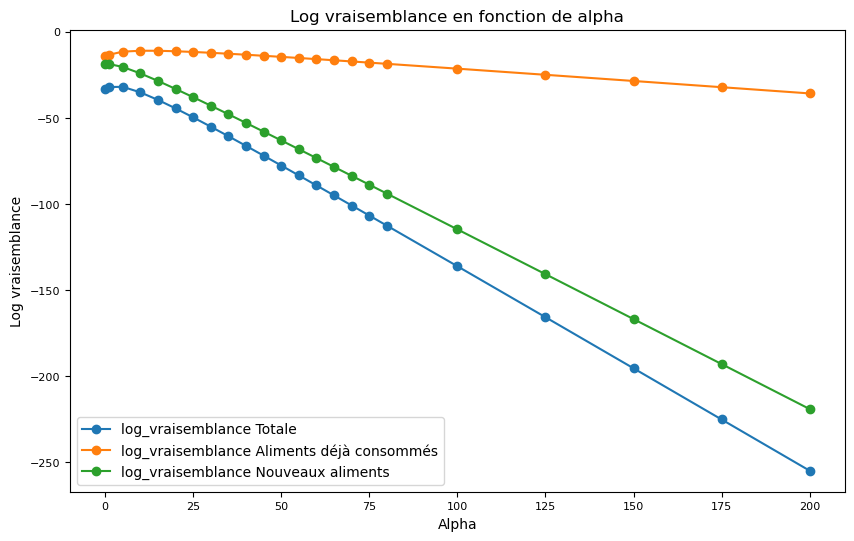

In [128]:
# CALCUL DE LA VRAISEMBLANCE DES ALIMENTS DU JOUR CACHE POUR PLUSIEURS INDIVIDUS 
# AVEC NOTRE MODELE ET COURBE DES VALEURS D'ALPHA
# TEST SUR UNE GAMME LARGE

from tqdm import tqdm
model=w2v_cbow_rep_freq_Rappgroups  
alpha_values=[0, 1, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 100, 125, 150, 175, 200]

beta=0.01


liste_users=list(d_alparcluster_1j.keys())
tot_log_lkl_mean=[]
log_like_all_old_mean=[]
log_like_all_new_mean=[]

for alpha in tqdm(alpha_values): 
    log_like_all=0
    log_like_all_old=0
    log_like_all_new=0
    
    for user in liste_users:
        ind=user      
        dic_proba={}    
        similarities = {}
        proba = {}

        for i in c_new:
            if d_alparcluster_6j[ind][tuple(i)]!=[]:
                p=[]
                p_normalized=[]
                for e in dic_alimnonrare_cat[tuple(i)]:
                    similarities[e] = dot(mean_indiv_clust_6j[(ind,tuple(i))], model.wv[str(e)]) / (norm(mean_indiv_clust_6j[(ind,tuple(i))]) 
                                                                                        * norm(model.wv[str(e)]))
                    proba[e] = np.exp(alpha*similarities[e])
                    p.append(proba[e])            
                p=np.array(p)
                p_normalized = p / np.sum(p)
                dic_proba[tuple(i)]=p_normalized
            elif d_alparcluster_6j[ind][tuple(i)]==[]:
                p=[]
                p_normalized=[]
                for e in dic_alimnonrare_cat[tuple(i)]:        
                    similarities[e] = dot(moy_clusters[tuple(i)], model.wv[str(e)]) / (norm(moy_clusters[tuple(i)]) * norm(model.wv[str(e)]))        
                    proba[e] = np.exp(alpha*similarities[e])
                    p.append(proba[e]) 
                p=np.array(p)
                p_normalized = p / np.sum(p) 
                dic_proba[tuple(i)]=p_normalized
        # print(dic_proba)  
        log_likelihood=0
        log_like_old=0
        log_like_new=0
        cat=0
        for i in c_new:
            if d_alparcluster_1j[ind][tuple(i)]!=[]:
                cat+=1

        for i in c_new:
            if d_alparcluster_1j[ind][tuple(i)]!=[]:
                if d_alparcluster_6j[ind][tuple(i)]!=[]:
                    for j in d_alparcluster_1j[ind][tuple(i)]:
                        if j in d_alparcluster_6j[ind][tuple(i)]: 
                            index = dic_alimnonrare_cat[tuple(i)].index(int(j.replace("'","")))
                            log_like_old += np.log((dic_proba[tuple(i)][index])*(d_cluster_freq_ind[ind][tuple(i)]))
                        elif j not in d_alparcluster_6j[ind][tuple(i)]:
                            index2= dic_alimnonrare_cat[tuple(i)].index(int(j.replace("'","")))
                            log_like_new += np.log((dic_proba[tuple(i)][index2])*(d_cluster_freq_ind[ind][tuple(i)]))
                elif d_alparcluster_6j[ind][tuple(i)]==[]:        
                    for j in d_alparcluster_1j[ind][tuple(i)]:
                        index2= dic_alimnonrare_cat[tuple(i)].index(int(j.replace("'","")))
                        log_like_new += np.log((dic_proba[tuple(i)][index2])*beta)
        log_likelihood=log_like_old+log_like_new 

        log_like_all += log_likelihood
        log_like_all_old += log_like_old
        log_like_all_new += log_like_new
      

    tot_log_lkl_mean.append(log_like_all/len(liste_users))
    log_like_all_old_mean.append(log_like_all_old/len(liste_users))    
    log_like_all_new_mean.append(log_like_all_new/len(liste_users))                             
        
fig, ax = plt.subplots(figsize=(10, 6))
x = alpha_values
y1 = tot_log_lkl_mean
y2 = log_like_all_old_mean
y3 = log_like_all_new_mean
print(y1)
print(y2)
print(y3)

ax.plot(x, y1, 'o-', label="log_vraisemblance Totale")
ax.plot(x, y2, 'o-', label='log_vraisemblance Aliments déjà consommés')
ax.plot(x, y3, 'o-', label='log_vraisemblance Nouveaux aliments')
ax.legend(fontsize=12)
ax.tick_params(axis='both', labelsize=8)
ax.set_title(f"Log vraisemblance en fonction de alpha", fontsize=12)
ax.set_xlabel("Alpha", fontsize=10)
ax.set_ylabel("Log vraisemblance", fontsize=10)
ax.legend(fontsize=10) 
plt.savefig("loglikelihood_alpha.jpg")
plt.show()  



100%|██████████| 36/36 [05:38<00:00,  9.40s/it]


[-33.09531276536727, -32.1895779287901, -31.72827899304085, -31.606933974168868, -31.74113834961625, -32.06541266682205, -32.53088111779469, -33.102553058279405, -33.75590300499666, -34.47367061812205, -35.24346179415521, -36.05614108810221, -36.904795962680254, -37.784068995747745, -38.689719136434896, -39.61832624950514, -40.567087182290486, -41.533671782742935, -42.51611915337772, -43.51276149488908, -44.52216722077942, -45.543097751823936, -46.57447416601758, -47.615351051270046, -48.6648956993309, -49.72237132074973, -50.78712333432047, -51.85856804403943, -52.93618319808181, -54.019500052107496, -55.10809665015469, -56.20159210190019, -57.299641683012354, -58.40193262097453, -59.50818045573212, -60.618125885249206]
[-14.247200652754602, -13.32861617403673, -12.643802830696314, -12.13913163425537, -11.770656849421147, -11.502960591787543, -11.308935536078291, -11.169157762622877, -11.070225587338435, -11.002916306990404, -10.960752986358523, -10.939050995150856, -10.93431868830031

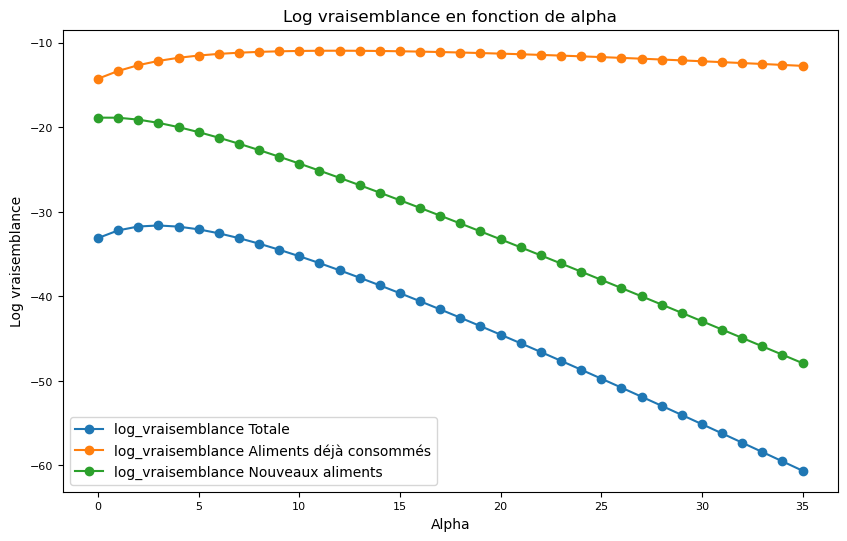

alpha* total, old, new: 3 12 0


In [75]:
# CALCUL DE LA VRAISEMBLANCE DES ALIMENTS DU JOUR CACHE POUR PLUSIEURS INDIVIDUS 
# AVEC NOTRE MODELE ET COURBE DES VALEURS D'ALPHA 
# FOCUS SUR UNE GAMME RESTREINTE 

from tqdm import tqdm
model=w2v_cbow_rep_freq_Rappgroups  
alpha_values=[i for i in range(36)]

beta=0.01


liste_users=list(d_alparcluster_1j.keys())
tot_log_lkl_mean=[]
log_like_all_old_mean=[]
log_like_all_new_mean=[]
# log_like_all_new_spe_mean=[]

for alpha in tqdm(alpha_values): 
    log_like_all=0
    log_like_all_old=0
    log_like_all_new=0
#     log_like_all_new_spe=0
    
    for user in liste_users:
        ind=user      
        dic_proba={}    
        similarities = {}
        proba = {}

        for i in c_new:
            if d_alparcluster_6j[ind][tuple(i)]!=[]:
                p=[]
                p_normalized=[]
                for e in dic_alimnonrare_cat[tuple(i)]:
                    similarities[e] = dot(mean_indiv_clust_6j[(ind,tuple(i))], model.wv[str(e)]) / (norm(mean_indiv_clust_6j[(ind,tuple(i))]) 
                                                                                        * norm(model.wv[str(e)]))
                    proba[e] = np.exp(alpha*similarities[e])
                    p.append(proba[e])            
                p=np.array(p)
                p_normalized = p / np.sum(p)
                dic_proba[tuple(i)]=p_normalized
            elif d_alparcluster_6j[ind][tuple(i)]==[]:
                p=[]
                p_normalized=[]
                for e in dic_alimnonrare_cat[tuple(i)]:        
                    similarities[e] = dot(moy_clusters[tuple(i)], model.wv[str(e)]) / (norm(moy_clusters[tuple(i)]) * norm(model.wv[str(e)]))        
                    proba[e] = np.exp(alpha*similarities[e])
                    p.append(proba[e]) 
                p=np.array(p)
                p_normalized = p / np.sum(p) 
                dic_proba[tuple(i)]=p_normalized
        # print(dic_proba)  
        log_likelihood=0
        log_like_old=0
        log_like_new=0
#         log_like_new_spe=0
        cat=0
        for i in c_new:
            if d_alparcluster_1j[ind][tuple(i)]!=[]:
                cat+=1

        for i in c_new:
            if d_alparcluster_1j[ind][tuple(i)]!=[]:
                if d_alparcluster_6j[ind][tuple(i)]!=[]:
                    for j in d_alparcluster_1j[ind][tuple(i)]:
                        if j in d_alparcluster_6j[ind][tuple(i)]: 
                            index = dic_alimnonrare_cat[tuple(i)].index(int(j.replace("'","")))
                            log_like_old += np.log((dic_proba[tuple(i)][index])*(d_cluster_freq_ind[ind][tuple(i)]))
                        elif j not in d_alparcluster_6j[ind][tuple(i)]:
                            index2= dic_alimnonrare_cat[tuple(i)].index(int(j.replace("'","")))
                            log_like_new += np.log((dic_proba[tuple(i)][index2])*(d_cluster_freq_ind[ind][tuple(i)]))
                elif d_alparcluster_6j[ind][tuple(i)]==[]:        
                    for j in d_alparcluster_1j[ind][tuple(i)]:
                        index2= dic_alimnonrare_cat[tuple(i)].index(int(j.replace("'","")))
                        log_like_new += np.log((dic_proba[tuple(i)][index2])*beta)
#                         log_like_new_spe += np.log((dic_proba[tuple(i)][index2])*beta)
        log_likelihood=log_like_old+log_like_new 

        log_like_all += log_likelihood
        log_like_all_old += log_like_old
        log_like_all_new += log_like_new
#         log_like_all_new_spe += log_like_new_spe  

    tot_log_lkl_mean.append(log_like_all/len(liste_users))
    log_like_all_old_mean.append(log_like_all_old/len(liste_users))    
    log_like_all_new_mean.append(log_like_all_new/len(liste_users)) 
#     log_like_all_new_spe_mean.append(log_like_all_new_spe/len(liste_users))
        
fig, ax = plt.subplots(figsize=(10, 6))
x = alpha_values
y1 = tot_log_lkl_mean
y2 = log_like_all_old_mean
y3 = log_like_all_new_mean
# y4 = log_like_all_new_spe_mean
print(y1)
print(y2)
print(y3)
# print(y4)

ax.plot(x, y1, 'o-', label="log_vraisemblance Totale")
ax.plot(x, y2, 'o-', label='log_vraisemblance Aliments déjà consommés')
ax.plot(x, y3, 'o-', label='log_vraisemblance Nouveaux aliments')
# ax.plot(x, y4, 'o-', label='log_vraisemblance Nouveaux aliments dans catégorie non consommée')

ax.legend(fontsize=12)
ax.tick_params(axis='both', labelsize=8)
ax.set_title(f"Log vraisemblance en fonction de alpha", fontsize=12)
ax.set_xlabel("Alpha", fontsize=10)
ax.set_ylabel("Log vraisemblance", fontsize=10)
ax.legend(fontsize=10) 
plt.savefig("loglikelihood_alpha.jpg")
plt.show()  


argmax_alpha_tot = np.argmax(tot_log_lkl_mean)
best_alpha_tot = alpha_values[argmax_alpha_tot]
argmax_alpha_old = np.argmax(log_like_all_old_mean)
best_alpha_old = alpha_values[argmax_alpha_old]
argmax_alpha_new = np.argmax(log_like_all_new_mean)
best_alpha_new = alpha_values[argmax_alpha_new]

print("alpha* total, old, new:", best_alpha_tot, best_alpha_old, best_alpha_new)

In [97]:
#AVEC UN MODELE RANDOM SUR LE CLUSTER (aliments du cluster équiprobables)
#CALCUL DE LA VRAISEMBLANCE DES ALIMENTS DU JOUR CACHE POUR UN INDIVIDU  

ind=110113        
model=w2v_cbow_rep_freq_Rappgroups  
alpha=1
beta=0.01



for i in c_new:
    print("consommations reelles de la catégorie:", i, list(dic_alim[int(e.replace("'", ""))] for e in d_alparcluster_6j[ind][tuple(i)]))

print("consommations reelles de la catégorie le jour masqué:")
for subkey, subvalue in d_alparcluster_1j[ind].items():
    print(subkey)
    for e in subvalue:
        print(e, dic_alim[int(e.replace("'",""))]) 
        

dic_proba={}    
similarities = {}
proba = {}

for i in c_new:
    p=[]
    p_normalized=[]
    for e in dic_alimnonrare_cat[tuple(i)]:
        proba[e] = 1/len(dic_alimnonrare_cat[tuple(i)])
        p.append(proba[e]) 
    p=np.array(p)
    p_normalized = p
    dic_proba[tuple(i)]=p_normalized
print(dic_proba)  

log_likelihood=0
log_like_old=0
log_like_new=0
cat=0


for i in c_new:
    if d_alparcluster_1j[ind][tuple(i)]!=[]:
        cat+=1
print("nombre catégorie", cat)

for i in c_new:
    if d_alparcluster_1j[ind][tuple(i)]!=[]:
        if d_alparcluster_6j[ind][tuple(i)]!=[]:
            for j in d_alparcluster_1j[ind][tuple(i)]:
                if j in d_alparcluster_6j[ind][tuple(i)]: 
                    index = dic_alimnonrare_cat[tuple(i)].index(int(j.replace("'","")))
                    log_like_old += np.log((dic_proba[tuple(i)][index])*(d_cluster_freq_ind[ind][tuple(i)]))
                elif j not in d_alparcluster_6j[ind][tuple(i)]:
                    index2= dic_alimnonrare_cat[tuple(i)].index(int(j.replace("'","")))
                    log_like_new += np.log((dic_proba[tuple(i)][index2])*(d_cluster_freq_ind[ind][tuple(i)]))
        elif d_alparcluster_6j[ind][tuple(i)]==[]:        
            for j in d_alparcluster_1j[ind][tuple(i)]:
                index2= dic_alimnonrare_cat[tuple(i)].index(int(j.replace("'","")))
                log_like_new += np.log((dic_proba[tuple(i)][index2])*beta)
log_likelihood=log_like_old+log_like_new 

print("RANDOM ON CLUSTER- 1 indiv- total log likelihood", log_likelihood)           
print("RANDOM ON CLUSTER- 1 indiv- old log likelihood", log_like_old)     
print("RANDOM ON CLUSTER- 1 indiv- new log likelihood", log_like_new) 

consommations reelles de la catégorie: ['36', '3', '4', '39', '24'] ['pot-au-feu', 'quiche lorraine']
consommations reelles de la catégorie: ['10'] []
consommations reelles de la catégorie: ['43'] ['vinaigrette sans précision']
consommations reelles de la catégorie: ['17', '18', '21', '12'] []
consommations reelles de la catégorie: ['11'] []
consommations reelles de la catégorie: ['31', '32'] ['eau du robinet', 'eau du robinet']
consommations reelles de la catégorie: ['38'] []
consommations reelles de la catégorie: ['23'] ['salade verte sans assaisonnement sans précision']
consommations reelles de la catégorie: ['1'] []
consommations reelles de la catégorie: ['33'] []
consommations reelles de la catégorie: ['34'] []
consommations reelles de la catégorie: ['30'] []
consommations reelles de la catégorie: ['41', '26', '8'] ['poire non pelée fraîche']
consommations reelles de la catégorie: ['13'] []
consommations reelles de la catégorie: ['14'] []
consommations reelles de la catégorie: ['1

In [235]:
print(dic_alimnonrare_cat[('31', '32')].index(18008))
print(dic_alimnonrare_cat[('23',)].index(20036))
print(dic_alimnonrare_cat[('41', '26', '8')].index(13039))
print(dic_alimnonrare_cat[('20',)].index(28916)) 

7
36
20
4


In [236]:
#AVEC UN MODELE RANDOM SUR LE CLUSTER (aliments du cluster équiprobables)
# CALCUL DE LA VRAISEMBLANCE DES ALIMENTS DU JOUR CACHE POUR PLUSIEURS INDIVIDUS 

model=w2v_cbow_rep_freq_Rappgroups  
beta=0.01
log_like_all=0
log_like_all_old=0
log_like_all_new=0

liste_users=list(d_alparcluster_1j.keys())

for user in liste_users:
    ind=user 

#     for i in c_new:
#         print("consommations reelles de la catégorie:", i, list(dic_alim[int(e.replace("'", ""))] for e in d_alparcluster_6j[ind][tuple(i)]))

#     print("consommations reelles de la catégorie le jour masqué:")
#     for subkey, subvalue in d_alparcluster_1j[ind].items():
#         print(subkey)
#         for e in subvalue:
#             print(dic_alim[int(e.replace("'",""))])    

    dic_proba={}    
    proba = {}
    for i in c_new:
        p=[]
        p_normalized=[]
        for e in dic_alimnonrare_cat[tuple(i)]:
            proba[e] = 1/len(dic_alimnonrare_cat[tuple(i)])
            p.append(proba[e]) 
        p=np.array(p)
        p_normalized = p
        dic_proba[tuple(i)]=p_normalized
#     print(dic_proba)

    log_likelihood=0
    log_like_old=0
    log_like_new=0
    cat=0   
    for i in c_new:
        if d_alparcluster_1j[ind][tuple(i)]!=[]:
            cat+=1

    for i in c_new:
        if d_alparcluster_1j[ind][tuple(i)]!=[]:
            if d_alparcluster_6j[ind][tuple(i)]!=[]:
                for j in d_alparcluster_1j[ind][tuple(i)]:
                    if j in d_alparcluster_6j[ind][tuple(i)]: 
                        index = dic_alimnonrare_cat[tuple(i)].index(int(j.replace("'","")))
                        log_like_old += np.log((dic_proba[tuple(i)][index])*(d_cluster_freq_ind[ind][tuple(i)]))
                    elif j not in d_alparcluster_6j[ind][tuple(i)]:
                        index2= dic_alimnonrare_cat[tuple(i)].index(int(j.replace("'","")))
                        log_like_new += np.log((dic_proba[tuple(i)][index2])*(d_cluster_freq_ind[ind][tuple(i)]))
            elif d_alparcluster_6j[ind][tuple(i)]==[]:        
                for j in d_alparcluster_1j[ind][tuple(i)]:
                    index2= dic_alimnonrare_cat[tuple(i)].index(int(j.replace("'","")))
                    log_like_new += np.log((dic_proba[tuple(i)][index2])*beta)
    log_likelihood=log_like_old+log_like_new 
    
    log_like_all += log_likelihood
    log_like_all_old += log_like_old
    log_like_all_new += log_like_new

    

print("RANDOM ON CLUSTER - total log likelihood", log_like_all)
print("RANDOM ON CLUSTER => mean total log likelihood", log_like_all/len(liste_users))
print("RANDOM ON CLUSTER => mean old log likelihood", log_like_all_old/len(liste_users))
print("RANDOM ON CLUSTER => mean new log likelihood", log_like_all_new/len(liste_users))

RANDOM ON CLUSTER - total log likelihood -68626.95156902946
RANDOM ON CLUSTER => mean total log likelihood -33.05729844365581
RANDOM ON CLUSTER => mean old log likelihood -14.270627039880162
RANDOM ON CLUSTER => mean new log likelihood -18.786671403775703


In [98]:
#AVEC UN MODELE RANDOM (aliments du petit déjeuner équiprobables)
# CALCUL DE LA VRAISEMBLANCE DES ALIMENTS DU JOUR CACHE POUR PLUSIEURS INDIVIDUS 

#Rappel du nombre d'aliments 
longueur=0
for i in c_new:
    longueur+=len(dic_alimnonrare_cat[tuple(i)])
print(longueur)

model=w2v_cbow_rep_freq_Rappgroups  
beta=0.01
log_like_all=0
log_like_all_old=0
log_like_all_new=0


liste_users=list(d_alparcluster_1j.keys())

for user in liste_users:
    ind=user 
    dic_proba={}    
    proba = {}
    for i in c_new:
        p=[]
        p_normalized=[]
        for e in dic_alimnonrare_cat[tuple(i)]:
            proba[e] = 1/longueur
            p.append(proba[e])
        p=np.array(p)
        p_normalized = p
        dic_proba[tuple(i)]=p_normalized
#     print(dic_proba)

    log_likelihood=0
    log_like_old=0
    log_like_new=0
    cat=0   
    for i in c_new:
        if d_alparcluster_1j[ind][tuple(i)]!=[]:
            cat+=1

    for i in c_new:
        if d_alparcluster_1j[ind][tuple(i)]!=[]:        
            if d_alparcluster_6j[ind][tuple(i)]!=[]:
                for j in d_alparcluster_1j[ind][tuple(i)]: 
                    if j in d_alparcluster_6j[ind][tuple(i)]: 
                        log_like_old += np.log(1/longueur)
                    elif j not in d_alparcluster_6j[ind][tuple(i)]:    
                        log_like_new += np.log(1/longueur)
            elif d_alparcluster_6j[ind][tuple(i)]==[]: 
                for j in d_alparcluster_1j[ind][tuple(i)]:
                    log_like_new += np.log(1/longueur)
    log_likelihood=log_like_old+log_like_new   

    log_like_all += log_likelihood
    log_like_all_old += log_like_old
    log_like_all_new += log_like_new   
    
print("RANDOM - total log likelihood", log_like_all)
print("RANDOM => mean total log likelihood", log_like_all/len(liste_users))
print("RANDOM - mean old log likelihood", log_like_all_old/len(liste_users))
print("RANDOM - mean new log likelihood", log_like_all_new/len(liste_users))
    

335
RANDOM - total log likelihood -70496.33269837883
RANDOM => mean total log likelihood -33.957771049315426
RANDOM - mean old log likelihood -16.789842263146166
RANDOM - mean new log likelihood -17.167928786169522


In [99]:
# MOST POPULAR BY CLUSTER 
# définir l'aliment le plus populaire par cluster
# ensemble des consommations du cluster par l'ensemble des individus


beta=0.01
liste_conso_cluster={}
liste_conso_cluster_merge={}
mostpopular_byclust={}

for i in c_new:
    liste_conso_cluster[tuple(i)]=[]
    liste_conso_cluster_merge[tuple(i)]=[]

for i in c_new:
    for key, value in d_alparcluster_6j.items(): 
            liste_conso_cluster[tuple(i)].append(d_alparcluster_6j[key][tuple(i)])
# print(liste_conso_cluster)

for i in c_new:
    for key, value in liste_conso_cluster.items():
        for sublist in value:
            for e in sublist:
                if key==tuple(i):
                    liste_conso_cluster_merge[tuple(i)].append(e)
# print(liste_conso_cluster_merge)

from collections import Counter
for i in c_new:
    compteur = Counter(liste_conso_cluster_merge[tuple(i)])
    element_plus_frequent, nombre_occurrences = compteur.most_common(1)[0]
    mostpopular_byclust[tuple(i)]= element_plus_frequent
# print(mostpopular_byclust)

for key, value in mostpopular_byclust.items():
    print(key, dic_alim[int(value.replace("'",""))])
    
    
    
#AVEC UN MODELE MOST POPULAR BY CLUSTER (aliments les plus fréquents par cluster)
# CALCUL DE LA VRAISEMBLANCE DES ALIMENTS DU JOUR CACHE POUR PLUSIEURS INDIVIDUS 

#Rappel du nombre d'aliments 
longueur=0
for i in c_new:
    longueur+=len(dic_alimnonrare_cat[tuple(i)])
print(longueur)

model=w2v_cbow_rep_freq_Rappgroups  
beta=0.01
log_like_all=0
log_like_all_old=0
log_like_all_new=0

liste_users=list(d_alparcluster_1j.keys())

for user in liste_users:
    ind=user 
    dic_proba={}    
    proba = {}
    for i in c_new:
        p=[]
        p_normalized=[]
        for e in dic_alimnonrare_cat[tuple(i)]:
            if e==mostpopular_byclust[tuple(i)]:
                proba[e] = 1-0.0001*(len(dic_alimnonrare_cat[tuple(i)])-1)
            else:
                proba[e]=0.0001
            p.append(proba[e])
        p=np.array(p)
        p_normalized = p
        dic_proba[tuple(i)]=p_normalized
#     print(dic_proba)


    log_likelihood=0
    log_like_old=0
    log_like_new=0
    cat=0    
    for i in c_new:
        if d_alparcluster_1j[ind][tuple(i)]!=[]:
            cat+=1
            
            
    for i in c_new:
        if d_alparcluster_1j[ind][tuple(i)]!=[]:
            if d_alparcluster_6j[ind][tuple(i)]!=[]:
                for j in d_alparcluster_1j[ind][tuple(i)]:
                    if j in d_alparcluster_6j[ind][tuple(i)]: 
                        index = dic_alimnonrare_cat[tuple(i)].index(int(j.replace("'","")))
                        log_like_old += np.log((dic_proba[tuple(i)][index])*(d_cluster_freq_ind[ind][tuple(i)]))
                    elif j not in d_alparcluster_6j[ind][tuple(i)]:
                        index2= dic_alimnonrare_cat[tuple(i)].index(int(j.replace("'","")))
                        log_like_new += np.log((dic_proba[tuple(i)][index2])*(d_cluster_freq_ind[ind][tuple(i)]))
            elif d_alparcluster_6j[ind][tuple(i)]==[]:        
                for j in d_alparcluster_1j[ind][tuple(i)]:
                    index2= dic_alimnonrare_cat[tuple(i)].index(int(j.replace("'","")))
                    log_like_new += np.log((dic_proba[tuple(i)][index2])*beta)
    log_likelihood=log_like_old+log_like_new 
    
    log_like_all += log_likelihood
    log_like_all_old += log_like_old
    log_like_all_new += log_like_new
    
print("MOST POPULAR ON CLUSTER - total log likelihood", log_like_all)
print("MOST POPULAR ON CLUSTER => mean total log likelihood", log_like_all/len(liste_users))
print("MOST POPULAR ON CLUSTER => mean old log likelihood", log_like_all_old/len(liste_users))
print("MOST POPULAR ON CLUSTER => mean new log likelihood", log_like_all_new/len(liste_users))
    

('36', '3', '4', '39', '24') pâtes alimentaires cuites
('10',) yaourt ou spécialité laitière nature
('43',) vinaigrette sans précision
('17', '18', '21', '12') steak haché 15% m.g. cuit
('11',) camembert sans précision
('31', '32') eau du robinet
('38',) soupe aux légumes type fait maison
('23',) salade verte sans assaisonnement sans précision
('1',) pain baguette
('33',) vin rouge 10°
('34',) café noir prêt à boire non sucré
('30',) sucre blanc
('41', '26', '8') pomme non pelée fraîche
('13',) beurre doux non allégé ajouté à la cuisson
('14',) huile d'olive ajoutée à la cuisson
('15',) margarine ordinaire  70% ou 80% m.g. ajoutée à la cuisson
('20',) jambon cuit
335
MOST POPULAR ON CLUSTER - total log likelihood -143842.68879494906
MOST POPULAR ON CLUSTER => mean total log likelihood -69.28838573937816
MOST POPULAR ON CLUSTER => mean old log likelihood -32.990345423697335
MOST POPULAR ON CLUSTER => mean new log likelihood -36.298040315680936


In [240]:
d_alparcluster_6j
# d_cluster_parepas_6j


{110006: {('36', '3', '4', '39', '24'): ['9811',
   '9811',
   '25103',
   '9104',
   '4003'],
  ('10',): ['19611', '19640', '19640', '19611', '19640', '19624'],
  ('43',): ['11110', '11110', '11110', '11081'],
  ('17', '18', '21', '12'): ['28301', '22501', '25163', '36005', '36306'],
  ('11',): [],
  ('31', '32'): ['18008',
   '18008',
   '18008',
   '18008',
   '18008',
   '18008',
   '18008',
   '18008'],
  ('38',): [],
  ('23',): ['20047', '20071', '20071', '20101'],
  ('1',): ['7001', '7001', '7001', '7001', '7001', '7001', '7001', '7001'],
  ('33',): [],
  ('34',): [],
  ('30',): [],
  ('41', '26', '8'): ['13030', '39221', '13037', '13014', '39221'],
  ('13',): ['81007', '81007', '81007', '81007', '81007', '81007', '81007'],
  ('14',): ['17440'],
  ('15',): ['16632'],
  ('20',): ['8400', '28925', '28504', '28900']},
 110020: {('36', '3', '4', '39', '24'): ['9811'],
  ('10',): ['19700'],
  ('43',): ['11114'],
  ('17', '18', '21', '12'): [],
  ('11',): [],
  ('31', '32'): ['76022']

In [100]:
# Essayer MRR appliquée à notre système avec recommandations triees par cluster:
#  calcul du MRR en considérant les consommations du jour caché 
# (on ordonne tous les aliments en fonction de leur proba au sein d'un cluster)
# ALPHA n'a pas d'impact donc on teste alpha=1

model=w2v_cbow_rep_freq_Rappgroups  
alpha_values=[1]
best_mrr = 0.0
best_params = {}

# keys=list(d_alparcluster_1j.keys())
# first_keys=keys[:1]
for alpha in alpha_values:
    dic_nmf={k: {tuple(i): [] for i in c_new} for k in d_alparcluster_1j.keys()}
    total_mrr=0
    for user_id in d_alparcluster_1j:
        ind=user_id   
        proba={}
        similarities={}
        for i in c_new:
            if d_alparcluster_6j[ind][tuple(i)]!=[]:
                p=[]
                p_normalized=[]
                for e in dic_alimnonrare_cat[tuple(i)]:
                    similarities[e] = dot(mean_indiv_clust_6j[(ind,tuple(i))], model.wv[str(e)]) / (norm(mean_indiv_clust_6j[(ind,tuple(i))]) * norm(model.wv[str(e)]))
                    proba[e] = np.exp(alpha*similarities[e])
#                     print(proba)
                    p.append(proba[e])            
                p=np.array(p)
                p_normalized = p / np.sum(p)
#                 print(user_id, i, "cat consommée, proba normalisee", p_normalized)
                liste_combinee=zip(p_normalized, dic_alimnonrare_cat[tuple(i)])
                liste_triee=sorted(liste_combinee, reverse=True)
                dic_nmf[user_id][tuple(i)]=[x[1] for x in liste_triee]
    
            elif d_alparcluster_6j[ind][tuple(i)]==[]:
                    p=[]
                    p_normalized=[]
                    for e in dic_alimnonrare_cat[tuple(i)]:
                        similarities[e] = dot(moy_clusters[tuple(i)], model.wv[str(e)]) / (norm(moy_clusters[tuple(i)]) * norm(model.wv[str(e)]))        
                        proba[e] = np.exp(alpha*similarities[e])
                        p.append(proba[e])
                    p=np.array(p)
                    p_normalized = p / np.sum(p)
    #                 print(user_id, i, "cat non consommée, proba normalisee", p_normalized)
                    liste_combinee=zip(p_normalized, dic_alimnonrare_cat[tuple(i)])
                    liste_triee=sorted(liste_combinee, reverse=True)
                    dic_nmf[user_id][tuple(i)]=[x[1] for x in liste_triee]
#         print(dic_nmf[user_id][('36','3', '4','39','24')])   

        real_conso=d_alparcluster_1j[user_id]
#         print(real_conso)

        mrr = 0
        nbre_alim=0
        for k in c_new:
            for consumption in real_conso[tuple(k)]:
                nbre_alim+=1
                if int(consumption.replace("'","")) in dic_nmf[user_id][tuple(k)]:
                    rank = dic_nmf[user_id][tuple(k)].index(int(consumption.replace("'","")))
                    inverse_rank = 1/(rank+1)
                    mrr += inverse_rank
        mrr /= nbre_alim
    #     print("mrr id", user_id, mrr, "\n")
        total_mrr+=mrr          
                        
    performance=total_mrr/len(d_alparcluster_1j)
    print("alpha=", alpha, "MRR moyenne sur tous les utilisateurs:", total_mrr/len(d_alparcluster_1j))

    if performance > best_mrr:
        best_mrr = performance
        best_params = {
        'alpha': alpha,
            }    
    

print("Meilleurs hyperparamètres :")
print(best_params)
print("Meilleure performance (MRR) :", best_mrr) 

alpha= 1 MRR moyenne sur tous les utilisateurs: 0.4717274285328413
Meilleurs hyperparamètres :
{'alpha': 1}
Meilleure performance (MRR) : 0.4717274285328413


In [104]:
# Essayer MRR appliquée à notre système avec recommandations triees par cluster:SUR 1 UTILISATEUR POUR ALPHA =1
#  calcul du MRR en considérant les consommations du jour caché SUR 1 UTILISATEUR 
# (on ordonne tous les aliments en fonction de leur proba au sein d'un cluster)

model=w2v_cbow_rep_freq_Rappgroups  
alpha_values=[1]
best_mrr = 0.0
best_params = {}

keys=list(d_alparcluster_1j.keys())
for alpha in alpha_values:
    dic_nmf={k: {tuple(i): [] for i in c_new} for k in keys}
    dic_nmf_names={k: {tuple(i): [] for i in c_new} for k in keys}
    total_mrr=0
    for user_id in keys:
        ind=user_id   
        proba={}
        similarities={}
        for i in c_new:
            if d_alparcluster_6j[ind][tuple(i)]!=[]:
                p=[]
                p_normalized=[]
                for e in dic_alimnonrare_cat[tuple(i)]:
                    similarities[e] = dot(mean_indiv_clust_6j[(ind,tuple(i))], model.wv[str(e)]) / (norm(mean_indiv_clust_6j[(ind,tuple(i))]) * norm(model.wv[str(e)]))
                    proba[e] = np.exp(alpha*similarities[e])
#                     print(proba)
                    p.append(proba[e])            
                p=np.array(p)
                p_normalized = p / np.sum(p)
#                 print(user_id, i, "cat consommée, proba normalisee", p_normalized)
                liste_combinee=zip(p_normalized, dic_alimnonrare_cat[tuple(i)])
                liste_triee=sorted(liste_combinee, reverse=True)
                dic_nmf[user_id][tuple(i)]=[x[1] for x in liste_triee]
                dic_nmf_names[user_id][tuple(i)]=[dic_alim[x[1]] for x in liste_triee]
       
            elif d_alparcluster_6j[ind][tuple(i)]==[]:
                    p=[]
                    p_normalized=[]
                    for e in dic_alimnonrare_cat[tuple(i)]:
                        similarities[e] = dot(moy_clusters[tuple(i)], model.wv[str(e)]) / (norm(moy_clusters[tuple(i)]) * norm(model.wv[str(e)]))        
                        proba[e] = np.exp(alpha*similarities[e])
                        p.append(proba[e])
                    p=np.array(p)
                    p_normalized = p / np.sum(p)
    #                 print(user_id, i, "cat non consommée, proba normalisee", p_normalized)
                    liste_combinee=zip(p_normalized, dic_alimnonrare_cat[tuple(i)])
                    liste_triee=sorted(liste_combinee, reverse=True)
                    dic_nmf[user_id][tuple(i)]=[x[1] for x in liste_triee]
                    dic_nmf_names[user_id][tuple(i)]=[dic_alim[x[1]] for x in liste_triee]
#         print(dic_nmf_names[user_id])   
#         with open("rangs_alim_1er_individu_modele.txt", "w") as file:
#             for key, values in dic_nmf_names[user_id].items():
#                 file.write(f"{key}: {values}\n")
        
        real_conso=d_alparcluster_1j[user_id]
#         print(real_conso)

        mrr = 0
        nbre_alim=0
        for k in c_new:
            for consumption in real_conso[tuple(k)]:
                nbre_alim+=1
                if int(consumption.replace("'","")) in dic_nmf[user_id][tuple(k)]:
                    rank = dic_nmf[user_id][tuple(k)].index(int(consumption.replace("'","")))
                    inverse_rank = 1/(rank+1)
                    mrr += inverse_rank
#                     print("consumption", consumption, dic_alim[int(consumption)], "mrr:", mrr)
        mrr /= nbre_alim
#         print("mrr id", user_id, mrr, "\n")
        total_mrr+=mrr          
                        
    performance=total_mrr/len(keys)
    print("alpha=", alpha, "MRR moyenne sur tous les utilisateurs:", total_mrr/len(keys))

    if performance > best_mrr:
        best_mrr = performance
        best_params = {
        'alpha': alpha,
            }    
    

print("Meilleurs hyperparamètres :")
print(best_params)
print("Meilleure performance (MRR) :", best_mrr) 

alpha= 1 MRR moyenne sur tous les utilisateurs: 0.4717274285328413
Meilleurs hyperparamètres :
{'alpha': 1}
Meilleure performance (MRR) : 0.4717274285328413


In [105]:
#  MRR appliquée à RANDOM PAR CLUSTER 
#  calcul du MRR en considérant les consommations du jour caché 


total_mrr=0

for user_id in list(d_alparcluster_1j.keys()):
    ind=user_id   
    real_conso=d_alparcluster_1j[user_id]
#     print(real_conso)
    mrr = 0
    nbre_alim=0
    for k in c_new:
        for consumption in real_conso[tuple(k)]:
            mrr_e=0
            nbre_alim+=1
            if int(consumption.replace("'","")) in dic_nmf[user_id][tuple(k)]:
                for m in range(1,len(dic_nmf[user_id][tuple(k)])+1):
                    inverse_rank=1/m
                    mrr_e+=inverse_rank
    #                     print(mrr_e)
                mrr_e /= len(dic_nmf[user_id][tuple(k)])
    #                 print("mrr_e final", mrr_e)
                mrr += mrr_e
    mrr /= nbre_alim
#     print("mrr user:", mrr)
    total_mrr+=mrr

                         
performance=total_mrr/len(d_alparcluster_1j)
print("MRR moyenne sur tous les utilisateurs:", total_mrr/len(d_alparcluster_1j))

MRR moyenne sur tous les utilisateurs: 0.19905888262104582


In [527]:
#  MRR appliquée à RANDOM PAR CLUSTER SUR 1 INDIVIDU
#  calcul du MRR en considérant les consommations du jour caché  SUR 1 INDIVIDU

keys=list(d_alparcluster_1j.keys())
first_keys=keys[:10]
total_mrr=0

for user_id in first_keys:
    ind=user_id   
    real_conso=d_alparcluster_1j[user_id]
    print(real_conso)
    mrr = 0
    nbre_alim=0
    for k in c_new:
        for consumption in real_conso[tuple(k)]:
            mrr_e=0
            nbre_alim+=1
            if int(consumption.replace("'","")) in dic_nmf[user_id][tuple(k)]:
                for m in range(1,len(dic_nmf[user_id][tuple(k)])+1):
                    inverse_rank=1/m
                    mrr_e+=inverse_rank
#                     print(mrr_e)
                mrr_e /= len(dic_nmf[user_id][tuple(k)])
#                 print("mrr_e final", mrr_e)
                mrr += mrr_e
                print("consumption", consumption, "mrr", mrr)
    mrr /= nbre_alim
    print("mrr user:", mrr)
    total_mrr+=mrr

                         
performance=total_mrr/len(first_keys)
print("MRR moyenne sur tous les utilisateurs:", total_mrr/len(first_keys))

{('36', '3', '4', '39', '24'): [], ('10',): [], ('43',): [], ('17', '18', '21', '12'): ['6210'], ('11',): [], ('31', '32'): ['18008'], ('38',): [], ('23',): ['20030'], ('1',): ['7001'], ('33',): [], ('34',): [], ('30',): [], ('41', '26', '8'): ['23525'], ('13',): [], ('14',): [], ('15',): [], ('20',): []}
consumption 6210 mrr 0.10906520612657374
consumption 18008 mrr 0.33028047234184
consumption 20030 mrr 0.4247052349318567
consumption 7001 mrr 0.7644373777889995
consumption 23525 mrr 0.8855612010373946
mrr user: 0.1771122402074789
{('36', '3', '4', '39', '24'): ['9811'], ('10',): [], ('43',): ['11114', '81061'], ('17', '18', '21', '12'): [], ('11',): ['12114'], ('31', '32'): ['18009'], ('38',): ['25902'], ('23',): ['20009'], ('1',): [], ('33',): ['1007'], ('34',): [], ('30',): [], ('41', '26', '8'): [], ('13',): [], ('14',): [], ('15',): [], ('20',): []}
consumption 9811 mrr 0.10494959226436135
consumption 11114 mrr 0.24155834390529435
consumption 81061 mrr 0.37816709554622735
consump

In [106]:
#  MRR appliquée à MOST POPULAR
#  calcul du MRR en considérant les consommations du jour caché 


total_mrr=0

for user_id in list(d_alparcluster_1j.keys()):
    ind=user_id   
    real_conso=d_alparcluster_1j[user_id]
#     print(real_conso)
    mrr = 0
    nbre_alim=0
    for k in c_new:
        for consumption in real_conso[tuple(k)]:
            nbre_alim+=1
            if consumption==mostpopular_byclust[tuple(i)]:
                mrr+=1
    mrr /= nbre_alim
#     print(mrr)
    total_mrr+=mrr

performance=total_mrr/len(d_alparcluster_1j)
print("MRR moyenne sur tous les utilisateurs:", total_mrr/len(d_alparcluster_1j))    

MRR moyenne sur tous les utilisateurs: 0.014472315845148204


In [ ]:
#Factorisation matricielle BPR 
# lightFM BPR loss dans google colab : code copié collé ci dessous 

# !pip install lightfm
# import numpy as np
# from lightfm import LightFM
# import pickle
# from lightfm import LightFM
# from lightfm.data import Dataset

# import copy
# c1=['2', '5', '6', '7', '9', '16', '19', '22', '25', '27', '28', '29', '35', '37', '40', '42', '44']
# c2=['36', '3', '4', '39', '24']
# c3=['10']
# c4=['43']
# c5=['17', '18', '21', '12']
# c6=['11']
# c7=['31', '32']
# c8=['38']
# c9=['23']
# c10=['1']  
# c11=['33']
# c12=['34']
# c13=['30']
# c14=['41', '26', '8']
# c15=['13']
# c16=['14']
# c17=['15']
# c18=['20']

# c=[c1, c2, c3, c4, c5, c6, c7, c8, c9, c10, c11, c12, c13, c14, c15, c16, c17, c18]

# c_new=copy.deepcopy(c)
# c_new.remove(c1)

# with open("/d_indiv_alimfreq_6j.pkl", "rb") as fichier:
#     d_indiv_alimfreq_6j = pickle.load(fichier)
# with open("/Alim_non_rare_repas.pkl", "rb") as fichier:
#     Alim_non_rare= pickle.load(fichier)
# with open("/dic_alimnonrare_cat_repas.pkl", "rb") as fichier:
#     dic_alimnonrare_cat= pickle.load(fichier)
# with open("/dic_alimnonrare_cat_noms_repas.pkl", "rb") as fichier:
#     dic_alimnonrarecat_names= pickle.load(fichier)    
# with open("/d_1j_rep.pkl", "rb") as fichier:
#     d_1j= pickle.load(fichier)
# with open("/d_alparcluster_1j.pkl", "rb") as fichier:
#     d_alparcluster_1j= pickle.load(fichier)
 

# # Initialize variables
# users = list(d_indiv_alimfreq_6j.keys())
# items = Alim_non_rare

# # Create an empty list to store the interaction data
# interaction_data = []

# # Iterate over each user and calculate the frequency of food consumption
# for user in users:
#     for item in items:
#         if str(item) in d_indiv_alimfreq_6j[user]:
#             interaction_data.append((user, item))  # User has consumed the item

# print(interaction_data)

# # Create a Dataset object
# dataset = Dataset()

# # Fit the dataset with user and item IDs
# dataset.fit(users, items)

# # Build the interaction matrix
# train_data, _ = dataset.build_interactions(interaction_data)
# # print(train_data)



# # Définir les différentes valeurs d'hyperparamètres à tester
# epochs = [10, 1000, 5000, 9000]
# no_components = [10, 50, 100, 200]
# learning_rates = [5, 1, 0.01, 0.001]


# best_mrr = 0.0
# best_params = {}


# for epoch in epochs:
#     for num_components in no_components:
#         for learning_rate in learning_rates:
#             dic_bpr={k: {tuple(i): [] for i in c_new} for k in list(d_indiv_alimfreq_6j.keys())}
#             # Créer un modèle LightFM avec les hyperparamètres actuels
#             model = LightFM(loss='bpr', learning_rate=learning_rate, no_components=num_components)
#              # Entraîner le modèle sur les données d'entraînement
#             model.fit(train_data, epochs=epoch, num_threads=1)

#         # Évaluer MRR sur les données de validation
#             total_mrr=0
#             for user_idx, user_id in enumerate(users):
#                 train_prediction=model.predict(user_idx, list(range(len(items))))
#                # print(train_prediction)
#                 items_tries = sorted(range(len(train_prediction)), key=lambda i: train_prediction[i], reverse=True)
#                # print(items_tries)
#                 alim_tries = [Alim_non_rare[element] for element in items_tries]
#                 # print(alim_tries)
#                 for e in alim_tries:
#                     for i in c_new:
#                         if e in dic_alimnonrare_cat[tuple(i)]:
#                             dic_bpr[user_id][tuple(i)].append(e)
#                 real_conso=d_alparcluster_1j[user_id]
#               # print(real_conso)

#                 mrr = 0
#                 nbre_alim=0
#                 for k in c_new:
#                     for consumption in real_conso[tuple(k)]:
#                         mrr_e=0
#                         nbre_alim+=1
#                         if int(consumption.replace("'","")) in dic_bpr[user_id][tuple(k)]:
#                             rank = dic_bpr[user_id][tuple(k)].index(int(consumption.replace("'","")))
#                             inverse_rank = 1/(rank+1)
#                             mrr += inverse_rank
#                 mrr /= nbre_alim
#                 # print("mrr id", user_id, mrr)
#                 total_mrr+=mrr

#             performance=total_mrr/len(d_indiv_alimfreq_6j.keys())
#             print("MRR moyenne sur tous les utilisateurs:", total_mrr/len(d_indiv_alimfreq_6j.keys()))

#             if performance > best_mrr:
#                 best_mrr = performance
#                 best_params = {
#                   'no_components': num_components,
#                   'learning_rate': learning_rate,
#                   'epochs': epoch
#                   }


# print("Meilleurs hyperparamètres :")
# print(best_params)
# print("Meilleure performance (MRR) :", best_mrr)

In [ ]:
# Résultats obtenus dans google colab : notebook "repas_factomat_bprloss_v1.ipynb"
  